# The effect of COVID-19 on electricity consumption


## 1. [Background and Objectives](#Objectives)
## 2. [Methodology and Data Source ](#data)
## 3. [EDA of data](#EDA)
## 4. [Data preparation and feature engineering ](#Feature)
## 5. [Model building and evaluation](#Model)
## 6. [Insight and Discussion](#Insight)

<a id='Contents'></a> 

 <a id='Objectives'></a>
 ##  1. [Background and Objectives](#Contents)

During the pandemic there has been a shift in behaviour; industry has been disrupted and people are working from home. The purpose of this challenge is to examine historical electricity consumption data to determine if such shifts can be detected. The hope is then that this may potentially be used  as a barometer of activity.

In this insight report, we try to find out how the once-in-a-century pandemic affect the electricity consumption in Australia. 
The pandemic undoubtfully has led to economic depression in many countries due to the lockdown approaches. Since economic data tends to be a posteriori, it would be useful to analyze the potential of other index, such as electricity consumption as a referential barometer. Specifically, we will try to answer the following questions:


1. How much the pandemic affect the electricity consumption in different states of Australia?
    * Has there been a change in the electricity consumption during the pandemic when comparing historic data, in particular when lockdown and boarder control were implemented?
    
2. What are the impact factors that should be added in the model of predicting electricity consumption? Is there any difference before and after the pandemic era?
    * Weather (temperature, humidity, wind, precipitation, etc.)
    * Sector (Manufacturing, Business & Services, Residential)

3. Can electricity consumption be used as a barometer of economic activity?
    * How is electricity consumption correlated with the economic development index such as GDP in Australia and other countries? 
    * If there is any difference in the correlation, what could be the possible reasons?


 <a id='data'></a>
 ##  2. [Methodology and Data Source ](#Contents)

1.  Compare the electricity consumption of different states over the past 5 years. For the weather change, we will use the data from the capital cities as representative references.  
2.  Use the weather data to identify if there is any correlation with the electricity consumption, and develop a model to predict the electricity consumption of 2020 based on historic data.
3. Check how the electricity consumption changed in reality, when the pandemic and lockdown approach occured, compared to the predicted values

#### Data Source

Hourly electricity consumption data in Australia:
* For NEM (National Electricity Market) primarily in the east Australia: https://www.aemo.com.au/energy-systems/electricity/national-electricity-market-nem/data-nem/aggregated-data
* For WEM (Wholesale Electricity Market) primarily in the southwest Australia: http://data.wa.aemo.com.au/#load-summary

* For historic daily weather in Australia: http://www.bom.gov.au/climate/dwo/
 
* Economic indicators? https://www.investopedia.com/terms/l/leadingindicator.asp  

* PV-installation https://pv-map.apvi.org.au/postcode



In [3]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 100)

import os
import string
from urllib.request import Request, urlopen
    
from itertools import product
from sklearn.preprocessing import LabelEncoder

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import time
import sys
import gc
import pickle

from io import BytesIO
from zipfile import ZipFile 

sys.version_info

sys.version_info(major=3, minor=7, micro=6, releaselevel='final', serial=0)

In [226]:
import matplotlib as mpl
dpi = 150
mpl.rcParams['figure.dpi']= dpi

 <a id='EDA'></a>
 ##  3. [EDA of Data](#Contents)


* Electricity demand data

In [2]:
# download electricity consumption data from NEM

# download the data from  https://raw.githubusercontent.com/JeffSackmann/tennis_atp/master/

def download_data(states,year_month):  
    
    # a dictionary to store the electricity consumption data for different states
    dict_e = {}

    for state in states: 
        
        print('Start downloading dataset of',state)
        
        year_rec = 0
        df_st = pd.DataFrame() 

        for ym in year_month:
            
            year=ym[:4]
            
            if state in ['NSW','VIC','QLD','SA','TAS']:
                file_url = 'https://www.aemo.com.au/aemo/data/nem/priceanddemand/PRICE_AND_DEMAND_'+ym+'_'+state+'1'+'.csv'
                # open url
                req = Request(file_url)
                user_agent = 'Mozilla/5.0 (Windows NT 6.1; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/74.0.3729.169 Safari/537.36'
                req.add_header('User-Agent', user_agent)  
                
                # read file from url
                content = urlopen(req)
                df = pd.read_csv(content)
                cols = df.columns
                # concatenate the dataframe
                df_st = pd.concat([df_st, df], ignore_index=True, sort=False, keys=cols)
                
                 
                
            if (state in ['WA'])&(year!=year_rec):
                
                              
                file_url = 'http://data.wa.aemo.com.au/datafiles/operational-measurements/operational-measurements-'+ym[:4]+'.csv'  
                # open url
                req = Request(file_url)
                user_agent = 'Mozilla/5.0 (Windows NT 6.1; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/74.0.3729.169 Safari/537.36'
                req.add_header('User-Agent', user_agent) 
                
                # read file from url
                content = urlopen(req)
                df = pd.read_csv(content)
                cols = df.columns
                # concatenate the dataframe
                df_st = pd.concat([df_st, df], ignore_index=True, sort=False, keys=cols)
                year_rec = ym[:4]
                #print(year_rec)
    
        dict_e[state] = df_st    

    print('Download finished.')
    
    return dict_e


In [5]:
year_start = 2013
year_end = 2020
year_range = np.arange(year_start,year_end+1,1)
month_range = np.arange(1,13,1)
states = ['NSW','VIC','QLD','SA','TAS','WA']

In [3]:
# define the year_month range

year_month = []
for year in year_range:
    for month in month_range:        
        year_month.append(str(year)+str(month).zfill(2))
        
year_month = [x for x in year_month if x not in ['202011','202012']]
        


# download data
dict_ele = download_data(states = states, year_month=year_month)

Start downloading dataset of NSW
Start downloading dataset of VIC
Start downloading dataset of QLD
Start downloading dataset of SA
Start downloading dataset of TAS
Start downloading dataset of WA
Download finished.


In [4]:
# extract the date-time and total demand information
matrix_ele = pd.DataFrame()
matrix_ele['date_time'] = dict_ele['NSW']['SETTLEMENTDATE']
matrix_ele['date_time'] = pd.to_datetime(matrix_ele['date_time'],format='%Y/%m/%d %H:%M:%S', errors='ignore')

for state in states:
    
    if state in ['NSW','VIC','QLD','SA','TAS']:
        df = dict_ele[state][['SETTLEMENTDATE','TOTALDEMAND']]
        df = df.rename(columns={'SETTLEMENTDATE': 'date_time', 'TOTALDEMAND': state})
        df['date_time'] = pd.to_datetime(df['date_time'],format='%Y/%m/%d %H:%M:%S', errors='ignore')
        matrix_ele = matrix_ele.merge(df, on = 'date_time',how='left')
        
    if state in ['WA']:
        df = dict_ele[state][['Trading Interval','Operational Load Estimate (MW)']]
        df = df.rename(columns={'Trading Interval': 'date_time', 'Operational Load Estimate (MW)': state})
        df['date_time'] = pd.to_datetime(df['date_time'],format='%Y-%m-%d %H:%M:%S', errors='ignore')
        matrix_ele = matrix_ele.merge(df, on = 'date_time',how='left')
        

#matrix_ele

In [5]:
matrix_ele = matrix_ele[matrix_ele.date_time>='2013-01-01']
matrix_ele.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 136224 entries, 0 to 136223
Data columns (total 7 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   date_time  136224 non-null  datetime64[ns]
 1   NSW        136224 non-null  float64       
 2   VIC        136224 non-null  float64       
 3   QLD        136224 non-null  float64       
 4   SA         136224 non-null  float64       
 5   TAS        136224 non-null  float64       
 6   WA         135854 non-null  float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 8.3 MB


We extract further information

In [6]:
matrix_ele.loc[:,'date'] = matrix_ele.loc[:,'date_time'].dt.date
matrix_ele.loc[:,'year'] = matrix_ele.loc[:,'date_time'].dt.year 
matrix_ele.loc[:,'month'] = matrix_ele.loc[:,'date_time'].dt.month 
matrix_ele.loc[:,'week'] = matrix_ele.loc[:,'date_time'].dt.week
matrix_ele.loc[:,'day'] = matrix_ele.loc[:,'date_time'].dt.day
matrix_ele.loc[:,'day_of_year'] = matrix_ele.loc[:,'date_time'].dt.dayofyear
matrix_ele.loc[:,'day_of_week'] = matrix_ele.loc[:,'date_time'].dt.dayofweek
matrix_ele.loc[:,'hour'] = matrix_ele.loc[:,'date_time'].dt.hour
matrix_ele.loc[:,'time'] = matrix_ele.loc[:,'date_time'].dt.time
matrix_ele.loc[:,'month_name'] = matrix_ele.loc[:,'date_time'].dt.month_name()
#matrix_ele

There are some missing values for the data in WA.

In [7]:
print(matrix_ele[matrix_ele['WA'].isnull()].shape[0])
matrix_ele[matrix_ele['WA'].isnull()]

370


,date_time,NSW,VIC,QLD,SA,TAS,WA,date,year,month,week,day,day_of_year,day_of_week,hour,time,month_name
0,2013-01-01 00:30:00,7166.97,4652.88,5260.28,1514.07,777.94,NaN,2013-01-01,2013,1,1,1,1,1,0,00:30:00,January
1,2013-01-01 01:00:00,6928.11,4447.73,5154.60,1446.95,856.77,NaN,2013-01-01,2013,1,1,1,1,1,1,01:00:00,January
2,2013-01-01 01:30:00,6541.21,4487.48,4983.32,1338.02,856.83,NaN,2013-01-01,2013,1,1,1,1,1,1,01:30:00,January
3,2013-01-01 02:00:00,6253.60,4329.87,4881.88,1258.22,841.16,NaN,2013-01-01,2013,1,1,1,1,1,2,02:00:00,January
4,2013-01-01 02:30:00,6003.44,4162.36,4776.31,1240.19,849.46,NaN,2013-01-01,2013,1,1,1,1,1,2,02:30:00,January
5,2013-01-01 03:00:00,5838.95,4022.83,4710.08,1207.32,845.53,NaN,2013-01-01,2013,1,1,1,1,1,3,03:00:00,January
6,2013-01-01 03:30:00,5740.95,3908.69,4646.55,1180.57,837.77,NaN,2013-01-01,2013,1,1,1,1,1,3,03:30:00,January
7,2013-01-01 04:00:00,5669.57,3892.50,4605.58,1175.28,839.12,NaN,2013-01-01,2013,1,1,1,1,1,4,04:00:00,January
8,2013-01-01 04:30:00,5682.72,3894.27,4613.65,1166.21,848.85,NaN,2013-01-01,2013,1,1,1,1,1,4,04:30:00,January
9,2013-01-01 05:00:00,5622.05,3884.55,4608.45,1153.60,837.76,NaN,2013-01-01,2013,1,1,1,1,1,5,05:00:00,January


Let's see when the missing data happened

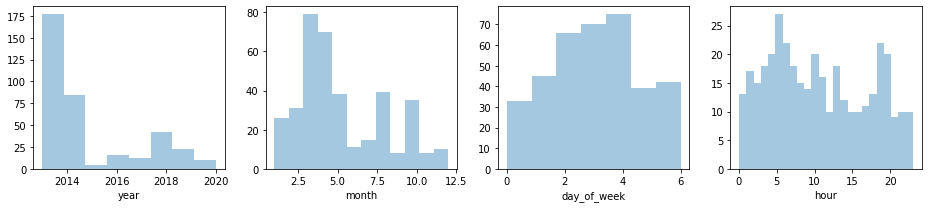

In [8]:
plt.figure(figsize=(13,3))
plt.subplot(1,4,1)
sns.distplot(matrix_ele[matrix_ele['WA'].isnull()]['year'],bins= 8,kde=False)
plt.subplot(1,4,2)
sns.distplot(matrix_ele[matrix_ele['WA'].isnull()]['month'],bins= 12,kde=False)
plt.subplot(1,4,3)
sns.distplot(matrix_ele[matrix_ele['WA'].isnull()]['day_of_week'],bins= 7,kde=False)
plt.subplot(1,4,4)
sns.distplot(matrix_ele[matrix_ele['WA'].isnull()]['hour'],bins= 24,kde=False)
plt.tight_layout()

To fill the gap at a particular hour, we use data of load_estimation from http://data.wa.aemo.com.au/datafiles/load-summary/

In [9]:
df_st = pd.DataFrame()

for year in year_range:

    file_url = 'http://data.wa.aemo.com.au/datafiles/load-summary/load-summary-'+str(year)+'.csv'  
    # open url
    req = Request(file_url)
    user_agent = 'Mozilla/5.0 (Windows NT 6.1; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/74.0.3729.169 Safari/537.36'
    req.add_header('User-Agent', user_agent) 

    # read file from url
    content = urlopen(req)
    df = pd.read_csv(content)
    cols = df.columns
    # concatenate the dataframe
    df_st = pd.concat([df_st, df], ignore_index=True, sort=False, keys=cols)


In [10]:
df_st['date_time'] = pd.to_datetime(df_st['Trading Interval'],format='%Y-%m-%d %H:%M:%S', errors='ignore')

In [11]:
# compare the load forecast and the actual operation load estimate
df_fc = df_st[(df_st['date_time']>'2013-01-02')&(df_st['date_time']<'2020-07-01')][['date_time','Load Forecast (MW)']]
df_op = matrix_ele[(matrix_ele['date_time']>'2013-01-02')&(matrix_ele['date_time']<'2020-07-01')][['date_time','WA']]

print(df_fc.info())
print(df_op.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 131375 entries, 33 to 131407
Data columns (total 2 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   date_time           131375 non-null  datetime64[ns]
 1   Load Forecast (MW)  131375 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 3.0 MB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 131375 entries, 48 to 131422
Data columns (total 2 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   date_time  131375 non-null  datetime64[ns]
 1   WA         131028 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 3.0 MB
None


<AxesSubplot:xlabel='ratio'>

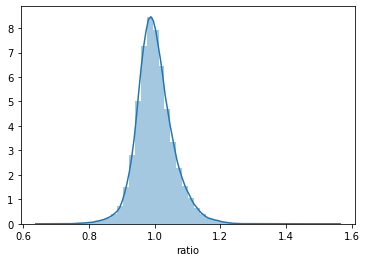

In [12]:
df_m = df_fc.merge(df_op,on='date_time',how ='left')
df_m['ratio'] = (df_m['Load Forecast (MW)']/df_m['WA']).replace([-np.inf,np.inf],np.nan)
plt.figure
sns.distplot(df_m['ratio'])

In [13]:
#matrix_ele = matrix_ele.drop(columns = ['Load Forecast (MW)_x','Load Forecast (MW)_y','WA_forcast'])
matrix_ele = matrix_ele.merge(df_fc,on='date_time',how = 'left')
matrix_ele = matrix_ele.rename(columns={'Load Forecast (MW)':'WA_forcast'})
matrix_ele['WA'].fillna(matrix_ele['WA_forcast'])
matrix_ele.head()

,date_time,NSW,VIC,QLD,SA,TAS,WA,date,year,month,week,day,day_of_year,day_of_week,hour,time,month_name,WA_forcast
0,2013-01-01 00:30:00,7166.97,4652.88,5260.28,1514.07,777.94,NaN,2013-01-01,2013,1,1,1,1,1,0,00:30:00,January,NaN
1,2013-01-01 01:00:00,6928.11,4447.73,5154.60,1446.95,856.77,NaN,2013-01-01,2013,1,1,1,1,1,1,01:00:00,January,NaN
2,2013-01-01 01:30:00,6541.21,4487.48,4983.32,1338.02,856.83,NaN,2013-01-01,2013,1,1,1,1,1,1,01:30:00,January,NaN
3,2013-01-01 02:00:00,6253.60,4329.87,4881.88,1258.22,841.16,NaN,2013-01-01,2013,1,1,1,1,1,2,02:00:00,January,NaN
4,2013-01-01 02:30:00,6003.44,4162.36,4776.31,1240.19,849.46,NaN,2013-01-01,2013,1,1,1,1,1,2,02:30:00,January,NaN


In [14]:
matrix_ele = matrix_ele.drop(columns ='WA_forcast')

We introduce some additional features

In [15]:
matrix_ele['year_month'] = matrix_ele['date_time'].dt.to_period('M')
matrix_ele['year_month'] = matrix_ele['year_month'].dt.to_timestamp('s').dt.strftime('%Y-%m')

matrix_ele['EML_of_month'] = (matrix_ele['day']<=10)*10+((matrix_ele['day']>=11)&(matrix_ele['day']<=20))*20+(matrix_ele['day']>=21)*30
matrix_ele.head()

,date_time,NSW,VIC,QLD,SA,TAS,WA,date,year,month,week,day,day_of_year,day_of_week,hour,time,month_name,year_month,EML_of_month
0,2013-01-01 00:30:00,7166.97,4652.88,5260.28,1514.07,777.94,NaN,2013-01-01,2013,1,1,1,1,1,0,00:30:00,January,2013-01,10
1,2013-01-01 01:00:00,6928.11,4447.73,5154.60,1446.95,856.77,NaN,2013-01-01,2013,1,1,1,1,1,1,01:00:00,January,2013-01,10
2,2013-01-01 01:30:00,6541.21,4487.48,4983.32,1338.02,856.83,NaN,2013-01-01,2013,1,1,1,1,1,1,01:30:00,January,2013-01,10
3,2013-01-01 02:00:00,6253.60,4329.87,4881.88,1258.22,841.16,NaN,2013-01-01,2013,1,1,1,1,1,2,02:00:00,January,2013-01,10
4,2013-01-01 02:30:00,6003.44,4162.36,4776.31,1240.19,849.46,NaN,2013-01-01,2013,1,1,1,1,1,2,02:30:00,January,2013-01,10


In [16]:
#matrix_ele.to_pickle('electricity_consumption.pkl')

In [57]:
#matrix_ele = pd.read_pickle('electricity_consumption.pkl')
matrix_ele.head()

,date_time,NSW,VIC,QLD,SA,TAS,WA,date,year,month,week,day,day_of_year,day_of_week,hour,time,month_name,year_month,EML_of_month
0,2013-01-01 00:30:00,7166.97,4652.88,5260.28,1514.07,777.94,NaN,2013-01-01,2013,1,1,1,1,1,0,00:30:00,January,2013-01,10
1,2013-01-01 01:00:00,6928.11,4447.73,5154.60,1446.95,856.77,NaN,2013-01-01,2013,1,1,1,1,1,1,01:00:00,January,2013-01,10
2,2013-01-01 01:30:00,6541.21,4487.48,4983.32,1338.02,856.83,NaN,2013-01-01,2013,1,1,1,1,1,1,01:30:00,January,2013-01,10
3,2013-01-01 02:00:00,6253.60,4329.87,4881.88,1258.22,841.16,NaN,2013-01-01,2013,1,1,1,1,1,2,02:00:00,January,2013-01,10
4,2013-01-01 02:30:00,6003.44,4162.36,4776.31,1240.19,849.46,NaN,2013-01-01,2013,1,1,1,1,1,2,02:30:00,January,2013-01,10


Let's have a quick view of the electricity consumption

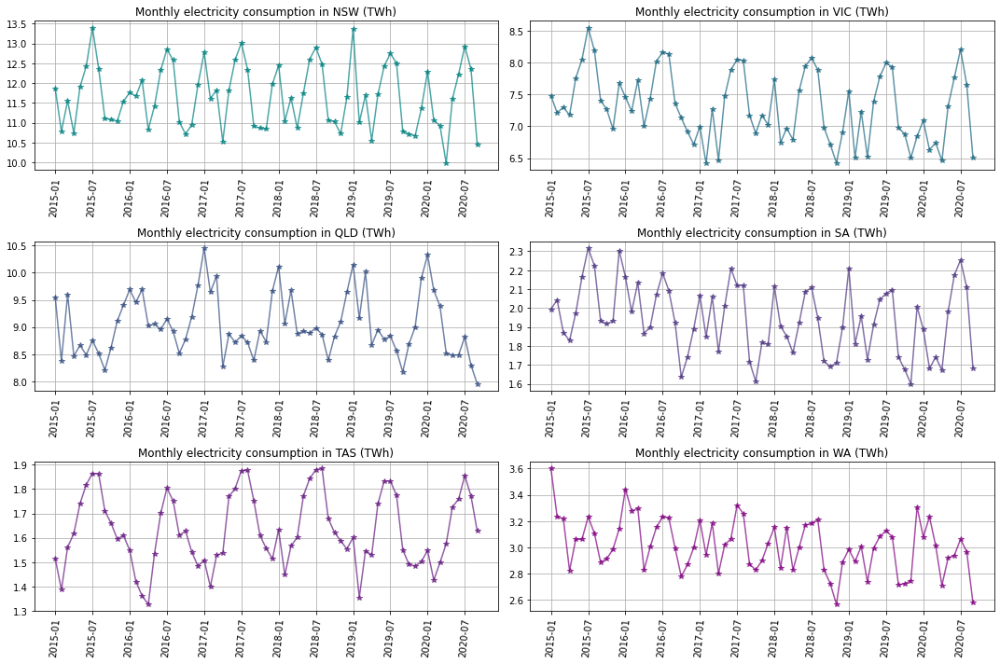

In [323]:
plt.figure(figsize=(15,10))

xticks = ['2015-01','2015-07','2016-01','2016-07','2017-01','2017-07',
         '2018-01','2018-07','2019-01','2019-07','2020-01','2020-07']

for i,state in enumerate(states):
    
    cond = (matrix_ele.date_time>='2015-01-01')&(matrix_ele.date_time<'2020-10-01')
    df = matrix_ele[cond].groupby('year_month')[[state]].sum()
    df = df.reset_index()
    
    plt.subplot(3,2,i+1)
    plt.plot(df['year_month'],df[state]/1e6,'*-',color=[i/10,0.5-i/10,0.5,0.7] )   
    plt.title('Monthly electricity consumption in '+state + ' (TWh)')
    plt.xticks(xticks,rotation=85)
    plt.grid()
    
plt.tight_layout()

We can clearly see strong seasonality in the data. For states in the north with warmer climate, the electricity consumption peaks at January, while for states in the south with cooler climate, the peaks appear in mid winter July. For states in between, peaks can be found in both January and July.

We can have a closer look at how the 10-day summation of monthly consumptions (i.e. the sum up the electricity demand for the first, second and last 10 days) change over the years. 

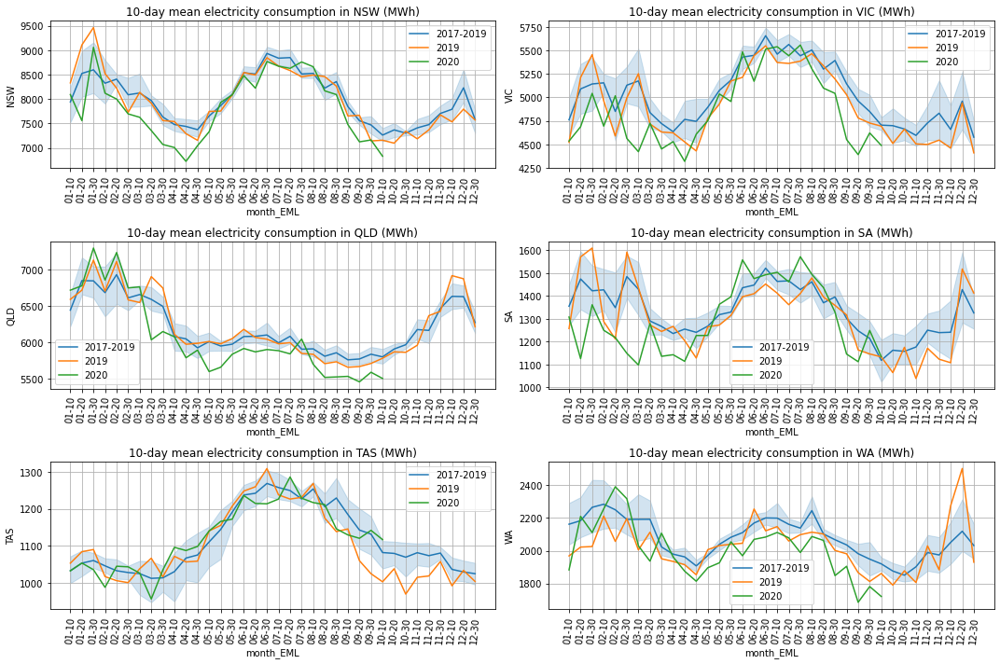

In [736]:
plt.figure(figsize=(15,10))


for i,state in enumerate(states):
    
    cond = (matrix_ele.date_time>='2014-01-01')&(matrix_ele.date_time<='2020-10-09')
    df = matrix_ele[cond].groupby(['year','month','EML_of_month'])[[state]].mean().reset_index()
    df[state] = df[state]
    df['month_EML'] = df['month'].astype(str).str.zfill(2)+'-'+df['EML_of_month'].astype(str)
    #df['month_EML'] = pd.to_datetime(df['month_EML'],format='%m-%d', errors='ignore')
    df = df.reset_index()
    
    plt.subplot(3,2,i+1)
    sns.lineplot(data=df[(df.year>=2015)&(df.year<=2019)],x='month_EML',y=state)
    sns.lineplot(data=df[(df.year==2019)],x='month_EML',y=state)
    sns.lineplot(data=df[(df.year==2020)],x='month_EML',y=state)
    plt.xticks(rotation=85)
    plt.legend(['2017-2019','2019','2020'])    
    plt.title('10-day mean electricity consumption in '+state+' (MWh)')
    plt.grid()
    
plt.tight_layout()

In [29]:
matrix_ele[matrix_ele.date_time=='2020-10-09']

,date_time,NSW,VIC,QLD,SA,TAS,WA,date,year,month,week,day,day_of_year,day_of_week,hour,time,month_name,year_month,EML_of_month
136223,2020-10-09,6953.76,4425.59,5611.51,1334.76,1046.57,1730.26,2020-10-09,2020,10,41,9,283,4,0,00:00:00,October,2020-10,10


See if there is any difference of electricity consumption behavior over a week

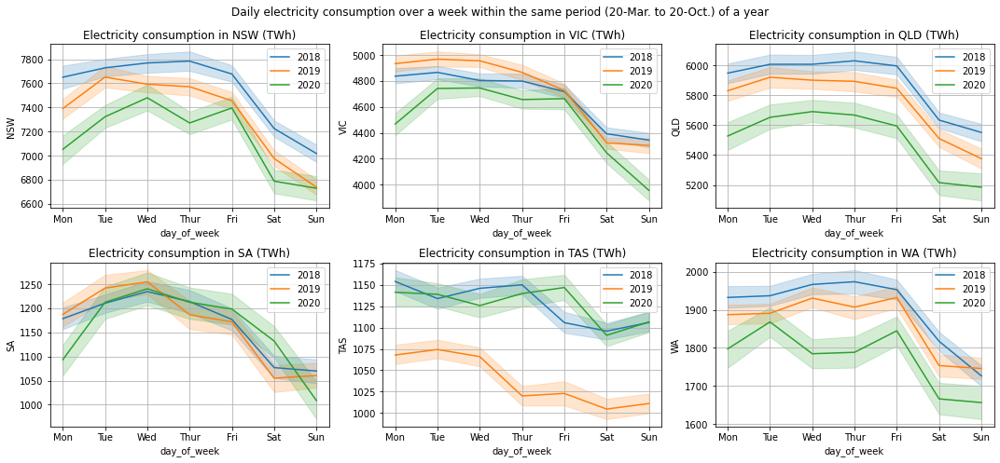

In [735]:
plt.figure(figsize=(15,7))

cond0 = (matrix_ele.date_time>='2018-01-01')&(matrix_ele.date_time<'2019-01-01')
cond1 = (matrix_ele.date_time>='2019-01-01')&(matrix_ele.date_time<'2020-01-01')
cond2 = (matrix_ele.date_time>='2020-01-01')
cond3 = (matrix_ele.day_of_year>=80)&(matrix_ele.day_of_year<=283)
cond3 = (matrix_ele.month>=9)&(matrix_ele.month<=10)&(matrix_ele.day<=31)

for i,state in enumerate(states):    
        
    plt.subplot(2,3,i+1)
    sns.lineplot(data=matrix_ele[cond0&cond3],x='day_of_week',y=state)
    sns.lineplot(data=matrix_ele[cond1&cond3],x='day_of_week',y=state)
    sns.lineplot(data=matrix_ele[cond2&cond3],x='day_of_week',y=state)    
    plt.xticks(rotation=0)
    plt.legend(['2018','2019','2020'])    
    plt.title('Electricity consumption in '+state+' (TWh)')
    plt.suptitle('Daily electricity consumption over a week within the same period (20-Mar. to 20-Oct.) of a year')
    plt.xticks(ticks = [0,1,2,3,4,5,6],labels=['Mon','Tue','Wed','Thur','Fri','Sat','Sun'])
    plt.grid()
    
plt.tight_layout()

It seems quite clear in some states, for example, NSW, VIC, QLD and WA, the electricity consumption have a reduction during the same period in 2020, compared to both 2019 and short term average from 2015-2019. While in SA and TAS, there is actually a slight increase compared to 2019, but still a bit lower than the short term average from 2015-2019.

In [347]:
matrix_ele['weekdays'] = 1*matrix_ele['day_of_week']<5
matrix_ele['weekends'] = 1*matrix_ele['day_of_week']>5

See if there is any difference of electricity consumption behavior over a day on weekdays and weekends

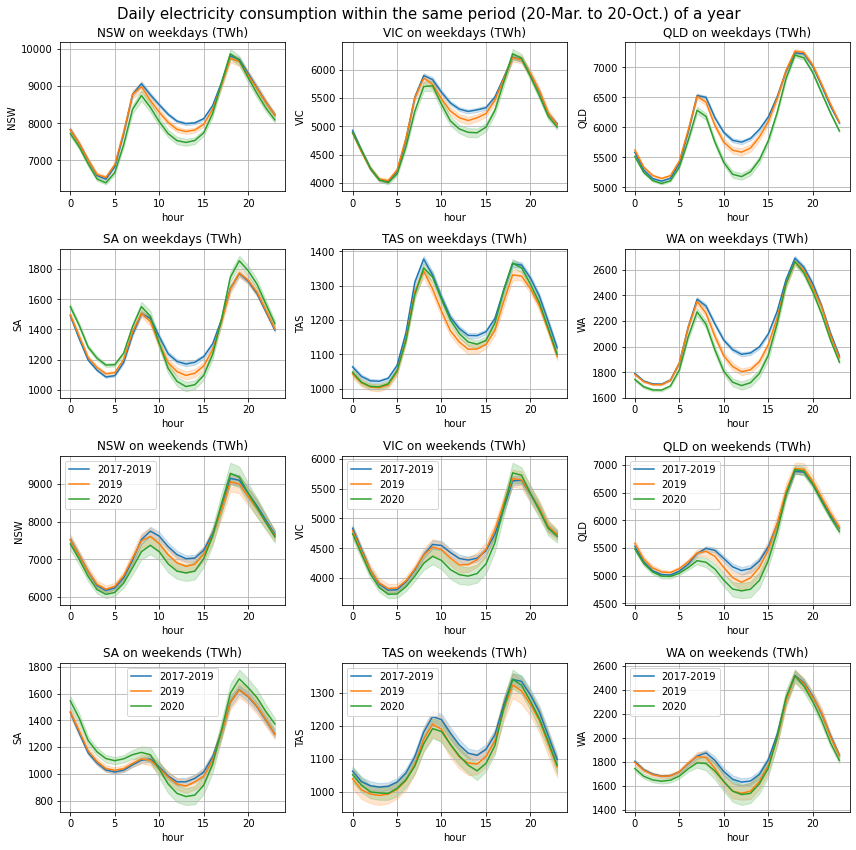

In [354]:
plt.figure(figsize=(12,12))

cond0 = (matrix_ele.date_time>='2017-01-01')&(matrix_ele.date_time<'2020-01-01')
cond1 = (matrix_ele.date_time>='2019-01-01')&(matrix_ele.date_time<'2020-01-01')
cond2 = (matrix_ele.date_time>='2020-03-20')
cond3 = (matrix_ele.day_of_year>=80)&(matrix_ele.day_of_year<=283)
cond4 = matrix_ele['weekdays'] == 1
cond5 = matrix_ele['weekends'] == 1

for i,state in enumerate(states):    
        
    plt.subplot(4,3,i+1)
    sns.lineplot(data=matrix_ele[cond0&cond3&cond4],x='hour',y=state)
    sns.lineplot(data=matrix_ele[cond1&cond3&cond4],x='hour',y=state)
    sns.lineplot(data=matrix_ele[cond2&cond3&cond4],x='hour',y=state)
    plt.title(state+' on weekdays (TWh)')
    plt.grid()
    
    plt.subplot(4,3,i+7)
    sns.lineplot(data=matrix_ele[cond0&cond3&cond5],x='hour',y=state)
    sns.lineplot(data=matrix_ele[cond1&cond3&cond5],x='hour',y=state)
    sns.lineplot(data=matrix_ele[cond2&cond3&cond5],x='hour',y=state)
       
    #plt.xticks(rotation=0)
    plt.legend(['2017-2019','2019','2020'])    
    plt.title(state+' on weekends (MWh)') 
    plt.grid()
    
plt.suptitle('Daily electricity consumption within the same period (20-Mar. to 09-Oct.) of a year',fontsize = 15)    
plt.tight_layout()

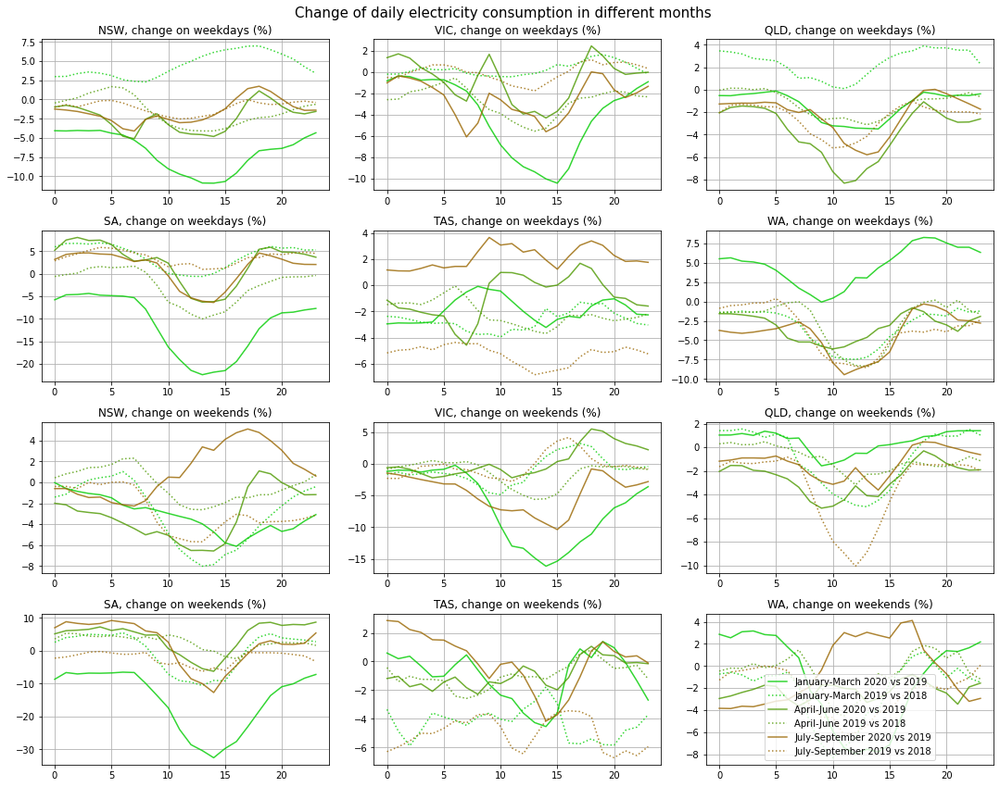

In [640]:
import calendar
plt.figure(figsize=(15,12))

cond0 = (matrix_ele.date_time>='2018-01-01')&(matrix_ele.date_time<'2019-01-01')
cond1 = (matrix_ele.date_time>='2019-01-01')&(matrix_ele.date_time<'2020-01-01')
cond2 = (matrix_ele.date_time>='2020-01-01')
cond3 = (matrix_ele.day_of_year>=80)&(matrix_ele.day_of_year<=283)

cond_wday = matrix_ele['weekdays'] == 1
cond_wend = matrix_ele['weekends'] == 1

# cond_feb = (matrix_ele.month==2) 
# cond_mar = (matrix_ele.month==3) 
# cond_apr = (matrix_ele.month==4) 
# cond_may = (matrix_ele.month==5) 
# cond_jun = (matrix_ele.month==6) 
# cond_jul = (matrix_ele.month==7) 
# cond_aug = (matrix_ele.month==8) 
# cond_sep = (matrix_ele.month==9) 
# cond_oct = (matrix_ele.month==10) 
 
month_array = np.arange(1,11,3)


for i,state in enumerate(states):    
        
    plt.subplot(4,3,i+1)
    
    for j,mth in enumerate(month_array[:-1]):
        cond_month = (matrix_ele.month>=mth) & (matrix_ele.month<month_array[j+1])
        
        data_h = ((matrix_ele[cond2&cond_month&cond_wday].groupby('hour')[state].mean()\
                  -matrix_ele[cond1&cond_month&cond_wday].groupby('hour')[state].mean())\
        /matrix_ele[cond1&cond_month&cond_wday].groupby('hour')[state].mean()).reset_index()
        
        data_h2 = ((matrix_ele[cond1&cond_month&cond_wday].groupby('hour')[state].mean()\
                  -matrix_ele[cond0&cond_month&cond_wday].groupby('hour')[state].mean())\
        /matrix_ele[cond0&cond_month&cond_wday].groupby('hour')[state].mean()).reset_index()
        
        plt.plot(data_h['hour'],100*data_h[state],
                 label=calendar.month_name[mth] + '-' + calendar.month_name[mth+2]+' 2020 vs 2019',
                color = [j*0.3,0.8-j*0.2,0.0,0.8])
        plt.plot(data_h2['hour'],100*data_h2[state],':',
                 label=calendar.month_name[mth] + '-' + calendar.month_name[mth+2]+' 2019 vs 2018',
                color = [j*0.3,0.8-j*0.2,0.0,0.8])
     
     
    plt.title(state+', change on weekdays (%)')
    #plt.legend()
    plt.grid()
    
    plt.subplot(4,3,i+7)
    for j,mth in enumerate(month_array[:-1]):
        cond_month = (matrix_ele.month>=mth) & (matrix_ele.month<month_array[j+1])
        data_h =  ((matrix_ele[cond2&cond_month&cond_wend].groupby('hour')[state].mean()\
                  -matrix_ele[cond1&cond_month&cond_wend].groupby('hour')[state].mean())\
        /matrix_ele[cond1&cond_month&cond_wend].groupby('hour')[state].mean()).reset_index()
        
        data_h2 =  ((matrix_ele[cond1&cond_month&cond_wend].groupby('hour')[state].mean()\
                  -matrix_ele[cond0&cond_month&cond_wend].groupby('hour')[state].mean())\
        /matrix_ele[cond0&cond_month&cond_wend].groupby('hour')[state].mean()).reset_index()
        
        
        plt.plot(data_h['hour'],100*data_h[state],
                 label=calendar.month_name[mth] + '-' + calendar.month_name[mth+2]+' 2020 vs 2019',
                color = [j*0.3,0.8-j*0.2,0.0,0.8])
        plt.plot(data_h2['hour'],100*data_h2[state],':',
                 label=calendar.month_name[mth] + '-' + calendar.month_name[mth+2]+' 2019 vs 2018',
                color = [j*0.3,0.8-j*0.2,0.0,0.8])
     
     
    plt.title(state+', change on weekends (%)')
    
    plt.grid()

plt.legend()
plt.suptitle('Change of daily electricity consumption in different months',fontsize = 15)    
plt.tight_layout()

It is not very clear since the electricity demand is weather related. 

To correct the influence of weather, we use the daily weather data and correct the data with heating-degree-days (HDD) and cooling-degree-days (CDD). Basically, when the daily averaged temperature $T$ rises above and critical temperature of CDD  $T_{\mathrm{CDD}}$, we trigger the CDD correction; similarly, when the daily averaged temerature drops below the $T_{\mathrm{HDD}}$, we trigger the HDD correction.

$CDD = Max(0,T-T_{\mathrm{CDD}}),$ 

$HDD = Max(T,T_{\mathrm{HDD}}-T)$

The standard of HDD and CDD at different states can be found at 'Electricity Demand Forecasting Methodology Information Paper 2019' from AEMO (Australian Energy Market Operator) https://www.aemo.com.au/-/media/Files/Electricity/NEM/Planning_and_Forecasting/NEM_ESOO/2019/Electricity-Demand-Forecasting-Methodology-Information-Paper.pdf.

The critical temperature for Western Australia is not provided in the report, we take the one based on the similarity of averaged temeratures. 

The critical tempereture is summarized below

In [14]:
CDD_HDD = pd.DataFrame(columns = ['State','T_CDD','T_HDD'])
T_CDD = [19.5,18,20,19,20,19]
T_HDD = [17,16.5,17,16.5,16,16.5]

for i, state in enumerate(states):
    CDD_HDD.loc[i,'State'] = state
    CDD_HDD.loc[i,'T_CDD'] = T_CDD[i]
    CDD_HDD.loc[i,'T_HDD'] = T_HDD[i]

CDD_HDD

,State,T_CDD,T_HDD
0,NSW,19.5,17
1,VIC,18,16.5
2,QLD,20,17
3,SA,19,16.5
4,TAS,20,16
5,WA,19,16.5


* Weather Data

In [34]:
import zipfile
import urllib

states = ['NSW','VIC','QLD','SA','TAS','WA']
Weather_station_name = ['BANKSTOWN AIRPORT AWS','MELBOURNE(Essendon Airport)','ARCHERFIELD AIRPORT','ADELAIDE (KENT TOWN)',
                        'HOBART (ELLERSLIE ROAD)','PERTH AIRPORT']
Weather_station_ID = ['066137','086038','040211','023034','094029','009021'] 

#  the pc id in the url below, unfortunately, are dynamic and need to be changed everytime I download the data
pc_ID_max = ['-874958112','-1480645047','-323522462','-106250589','-1768428126','-16413246']
pc_ID_min = ['-874958308','-1480645243','-323522658','-106250785','-1768428322','-16413442']

# a dictionary to store the weather data for different states
dict_w = {}

for i,state in enumerate(states):

    df_st = pd.DataFrame()
    ID_ws = Weather_station_ID[i]
    pc_max = pc_ID_max[i]
    pc_min = pc_ID_min[i]
    
    print('Downloading data of ',state)
    

    for year in year_range:

        page_url_max = 'http://www.bom.gov.au/jsp/ncc/cdio/weatherData/av?p_nccObsCode=122&p_display_type=dailyDataFile&p_startYear='\
                        +str(year)+'&p_c='+pc_max+'&p_stn_num='+ID_ws
        page_url_min = 'http://www.bom.gov.au/jsp/ncc/cdio/weatherData/av?p_nccObsCode=123&p_display_type=dailyDataFile&p_startYear='\
                        +str(year)+'&p_c='+pc_min+'&p_stn_num='+ID_ws

        file_url_max = 'http://www.bom.gov.au/tmp/cdio/IDCJAC0010_'+ID_ws+'_'+str(year)+'.zip'
        file_url_min = 'http://www.bom.gov.au/tmp/cdio/IDCJAC0011_'+ID_ws+'_'+str(year)+'.zip'

        # open url of page and open the zipfile, somehow it is nessecery to open the page url first
        # maximal temp
        req_max1 = Request(page_url_max)
        req_max2 = Request(file_url_max)
        user_agent = 'Mozilla/5.0 (Windows NT 6.1; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/74.0.3729.169 Safari/537.36'
        req_max1.add_header('User-Agent', user_agent)
        req_max2.add_header('User-Agent', user_agent) 

        # minimal temp
        req_min1 = Request(page_url_min)
        req_min2 = Request(file_url_min)
        user_agent = 'Mozilla/5.0 (Windows NT 6.1; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/74.0.3729.169 Safari/537.36'
        req_min1.add_header('User-Agent', user_agent)
        req_min2.add_header('User-Agent', user_agent) 

        # read file from url           
        page_max = urlopen(req_max1)
        content_max = urlopen(req_max2)
        zip_file_object_max = ZipFile(BytesIO(content_max.read()))        
        first_file_max = zip_file_object_max.namelist()[0]
        file_max = zip_file_object_max.open(first_file_max)
        df_max = pd.read_csv(file_max)
        
        page_min = urlopen(req_min1)
        content_min = urlopen(req_min2)        
        zip_file_object_min = ZipFile(BytesIO(content_min.read()))
        first_file_min = zip_file_object_min.namelist()[0]
        file_min = zip_file_object_min.open(first_file_min)
        df_min = pd.read_csv(file_min)
        
        if year==year_range[0]:
            cols_max = df_max.columns
            cols_min = df_min.columns
            
        df = df_max[['Year','Month','Day','Maximum temperature (Degree C)']].merge(df_min[['Year','Month','Day','Minimum temperature (Degree C)']],on=['Year','Month','Day'],how='left')
        
        
        df_st = pd.concat([df_st, df], ignore_index=True, sort=False, keys=cols)
 

    dict_w[state] = df_st
    
    

In [35]:
import datetime

matrix_temp = pd.DataFrame()

for i,state in enumerate(states):
    
    if i==0:
        matrix_temp[['year','month','day']] = dict_w[state][['Year','Month','Day']]
        matrix_temp['date']=pd.to_datetime(matrix_temp[['year','month','day']]).dt.date
        
        
    matrix_temp.loc[:,state+'_max'] = dict_w[state].loc[:,'Maximum temperature (Degree C)']
    matrix_temp.loc[:,state+'_min'] = dict_w[state].loc[:,'Minimum temperature (Degree C)']
    
matrix_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2838 entries, 0 to 2837
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   year     2838 non-null   float64
 1   month    2838 non-null   float64
 2   day      2838 non-null   float64
 3   date     2838 non-null   object 
 4   NSW_max  2824 non-null   float64
 5   NSW_min  2829 non-null   float64
 6   VIC_max  2836 non-null   float64
 7   VIC_min  2837 non-null   float64
 8   QLD_max  2832 non-null   float64
 9   QLD_min  2836 non-null   float64
 10  SA_max   2838 non-null   float64
 11  SA_min   2838 non-null   float64
 12  TAS_max  2833 non-null   float64
 13  TAS_min  2837 non-null   float64
 14  WA_max   2838 non-null   float64
 15  WA_min   2837 non-null   float64
dtypes: float64(15), object(1)
memory usage: 354.9+ KB


In [692]:
# matrix_temp[(matrix_temp['NSW_max'].isnull()) | (matrix_temp['NSW_min'].isnull())\
#            |(matrix_temp['VIC_max'].isnull()) | (matrix_temp['VIC_min'].isnull())\
#            |(matrix_temp['QLD_max'].isnull()) | (matrix_temp['QLD_min'].isnull())\
#            |(matrix_temp['SA_max'].isnull()) | (matrix_temp['SA_min'].isnull())\
#            |(matrix_temp['TAS_max'].isnull()) | (matrix_temp['TAS_min'].isnull())\
#            |(matrix_temp['WA_max'].isnull()) | (matrix_temp['WA_min'].isnull())]

In [36]:
for i,state in enumerate(states):
    
    T_CDD = CDD_HDD.loc[i,'T_CDD']
    T_HDD = CDD_HDD.loc[i,'T_HDD']
    
    # fill missing data using polynominal interpolation
    matrix_temp.loc[:,state+'_max'] = matrix_temp.loc[:,state+'_max'].interpolate(method='polynomial', order=2)
    matrix_temp.loc[:,state+'_min'] = matrix_temp.loc[:,state+'_min'].interpolate(method='polynomial', order=2)
    
    matrix_temp.loc[:,state+'_ave'] = 0.5*(matrix_temp.loc[:,state+'_max'] + matrix_temp.loc[:,state+'_min'])
    matrix_temp.loc[:,state+'_diff'] = (matrix_temp.loc[:,state+'_max'] - matrix_temp.loc[:,state+'_min'])
    
    matrix_temp.loc[:,state+'_HDD'] = 1*(matrix_temp.loc[:,state+'_ave']<T_HDD)*(T_HDD-matrix_temp.loc[:,state+'_ave']) 
    matrix_temp.loc[:,state+'_CDD'] = 1*(matrix_temp.loc[:,state+'_ave']>T_CDD)*(matrix_temp.loc[:,state+'_ave']-T_CDD) 
    
    

In [15]:
for i,state in enumerate(states):
    
    T_CDD = CDD_HDD.loc[i,'T_CDD']
    T_HDD = CDD_HDD.loc[i,'T_HDD']
    
    # fill missing data using polynominal interpolation
    T_min = matrix_ele_day.loc[:,state+'_min']
    T_max = matrix_ele_day.loc[:,state+'_max']
    
    matrix_ele_day.loc[:,state+'_HDD_n'] = 1*((T_min<=T_HDD)&(T_max>=T_HDD))\
                                            *(T_HDD-T_min)**2/(T_max-T_min)*0.5\
                                            +1*(T_max<T_HDD)*((T_max-T_min)*0.5+(T_HDD-T_max))
    matrix_ele_day.loc[:,state+'_CDD_n'] = 1*((T_min<=T_CDD)&(T_max>=T_CDD))\
                                            *(T_max-T_CDD)**2/(T_max-T_min)*0.5\
                                            +1*(T_min>T_CDD)*((T_max-T_min)*0.5+(T_min-T_CDD))
    
    matrix_ele_day.loc[:,state+'_HDD_n'] = matrix_ele_day.loc[:,state+'_HDD_n'].fillna(0)
    matrix_ele_day.loc[:,state+'_CDD_n'] = matrix_ele_day.loc[:,state+'_CDD_n'].fillna(0)

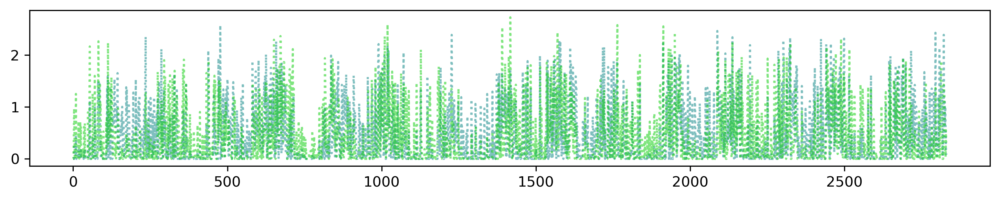

In [16]:
plt.figure(figsize=(12,2))
plt.plot(matrix_ele_day[state+'_HDD_n']-matrix_ele_day[state+'_HDD'],':',color=[0,0.5,0.5,0.5])
#plt.plot(matrix_ele_day[state+'_HDD'],color=[0,0,0.8,0.5])
plt.plot(matrix_ele_day[state+'_CDD_n']-matrix_ele_day[state+'_CDD'],':',color=[0,0.8,0.0,0.5])
#plt.plot(matrix_ele_day[state+'_CDD'],color=[0.5,0.5,0,0.5])

In [39]:
matrix_temp.to_pickle('temperature.pkl')

In [40]:
matrix_temp = pd.read_pickle("./temperature.pkl")
matrix_temp.head()

,year,month,day,date,NSW_max,NSW_min,VIC_max,VIC_min,QLD_max,QLD_min,SA_max,SA_min,TAS_max,TAS_min,WA_max,WA_min,NSW_ave,NSW_diff,NSW_HDD,NSW_CDD,VIC_ave,VIC_diff,VIC_HDD,VIC_CDD,QLD_ave,QLD_diff,QLD_HDD,QLD_CDD,SA_ave,SA_diff,SA_HDD,SA_CDD,TAS_ave,TAS_diff,TAS_HDD,TAS_CDD,WA_ave,WA_diff,WA_HDD,WA_CDD
0,2013.0,1.0,1.0,2013-01-01,31.3,20.0,26.0,13.4,30.7,18.5,25.9,12.7,21.8,14.1,32.0,24.3,25.65,11.3,-0.0,6.15,19.70,12.6,-0.0,1.70,24.60,12.2,-0.0,4.60,19.30,13.2,-0.0,0.30,17.95,7.7,-0.0,-0.00,28.15,7.7,-0.0,9.15
1,2013.0,1.0,2.0,2013-01-02,24.7,19.8,21.6,13.9,36.3,19.3,31.4,12.7,23.9,8.9,28.6,21.7,22.25,4.9,-0.0,2.75,17.75,7.7,-0.0,-0.00,27.80,17.0,-0.0,7.80,22.05,18.7,-0.0,3.05,16.40,15.0,-0.0,-0.00,25.15,6.9,-0.0,6.15
2,2013.0,1.0,3.0,2013-01-03,26.7,16.8,37.4,11.9,31.0,22.7,38.6,19.8,33.8,12.9,26.9,16.2,21.75,9.9,-0.0,2.25,24.65,25.5,-0.0,6.65,26.85,8.3,-0.0,6.85,29.20,18.8,-0.0,10.20,23.35,20.9,-0.0,3.35,21.55,10.7,-0.0,2.55
3,2013.0,1.0,4.0,2013-01-04,31.5,15.4,41.6,20.7,30.5,21.5,44.1,22.9,41.8,23.4,26.1,14.2,23.45,16.1,-0.0,3.95,31.15,20.9,-0.0,13.15,26.00,9.0,-0.0,6.00,33.50,21.2,-0.0,14.50,32.60,18.4,-0.0,12.60,20.15,11.9,-0.0,1.15
4,2013.0,1.0,5.0,2013-01-05,33.6,16.5,26.4,18.5,28.7,20.9,31.8,19.4,25.1,17.5,37.9,12.7,25.05,17.1,-0.0,5.55,22.45,7.9,-0.0,4.45,24.80,7.8,-0.0,4.80,25.60,12.4,-0.0,6.60,21.30,7.6,-0.0,1.30,25.30,25.2,-0.0,6.30


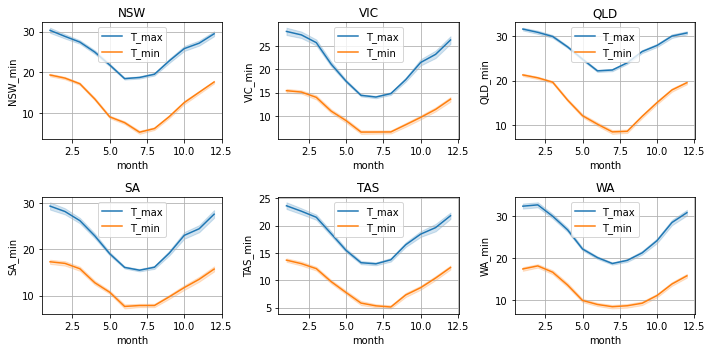

In [41]:
plt.figure(figsize=(10,5))

for i,state in enumerate(states):

    plt.subplot(2,3,i+1)
    sns.lineplot(matrix_temp.month,matrix_temp[state+'_max'])
    sns.lineplot(matrix_temp.month,matrix_temp[state+'_min'])
    plt.legend(['T_max','T_min'])
    plt.grid()
    plt.title(state)

plt.tight_layout()


### Relation between weather and electricity consumption

Since we only have daily temperature instead of hourly temperature, we focus on the daily electricity consumption

In [42]:
# combine the daily weather information and electricity consumption

matrix_ele_day = matrix_ele[matrix_ele.date_time<'2020-10-09'].groupby('date')[['NSW','VIC','QLD','SA','TAS','WA']].sum()
matrix_ele_day = matrix_ele_day.reset_index()

col = ['date','year','month','week','day','day_of_year','day_of_week','month_name','year_month','EML_of_month']

matrix_ele_day = matrix_ele_day.merge(matrix_ele[col].groupby('date').mean().reset_index(), on='date',how='left')



,date,NSW,VIC,QLD,SA,TAS,WA,year,month,week,day,day_of_year,day_of_week,EML_of_month
0,2013-01-01,346328.03,209105.56,259269.66,63256.94,42716.12,83180.58,2013,1,1,1,1,1,10
1,2013-01-02,361317.14,238533.19,302096.48,75150.73,48400.39,106805.79,2013,1,1,2,2,2,10
2,2013-01-03,370664.31,288996.78,296733.64,93525.61,52502.95,102829.52,2013,1,1,3,3,3,10
3,2013-01-04,397909.05,333499.72,290791.63,100142.94,52272.30,95117.27,2013,1,1,4,4,4,10
4,2013-01-05,396019.12,260577.50,275464.35,71180.34,49737.98,101535.50,2013,1,1,5,5,5,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2826,2020-09-27,328268.04,203406.98,242441.57,56205.51,54418.56,79400.52,2020,9,39,27,271,6,30
2827,2020-09-28,345109.74,229302.28,264391.35,54926.11,55933.20,79845.22,2020,9,40,28,272,0,30
2828,2020-09-29,347825.59,224152.92,265912.17,63633.41,53720.24,91712.33,2020,9,40,29,273,1,30
2829,2020-09-30,364059.33,227240.42,272191.69,62678.29,53633.08,88997.82,2020,9,40,30,274,2,30


We add the factor of solar flux

In [43]:
matrix_ele_day['solar'] = np.cos(2*np.pi*(matrix_ele_day['day_of_year']-10)/365.25)
matrix_ele_day.head()

,date,NSW,VIC,QLD,SA,TAS,WA,year,month,week,day,day_of_year,day_of_week,EML_of_month,solar
0,2013-01-01,346328.03,209105.56,259269.66,63256.94,42716.12,83180.58,2013,1,1,1,1,1,10,0.988039
1,2013-01-02,361317.14,238533.19,302096.48,75150.73,48400.39,106805.79,2013,1,1,2,2,2,10,0.990545
2,2013-01-03,370664.31,288996.78,296733.64,93525.61,52502.95,102829.52,2013,1,1,3,3,3,10,0.992759
3,2013-01-04,397909.05,333499.72,290791.63,100142.94,52272.30,95117.27,2013,1,1,4,4,4,10,0.994678
4,2013-01-05,396019.12,260577.50,275464.35,71180.34,49737.98,101535.50,2013,1,1,5,5,5,10,0.996303


In [48]:
for state in states:
    col = ['date',state+'_max',state+'_min',state+'_ave',state+'_diff',state+'_HDD',state+'_CDD']
    matrix_ele_day = matrix_ele_day.merge(matrix_temp[col], on='date',how='left')
    
matrix_ele_day

,date,NSW,VIC,QLD,SA,TAS,WA,year,month,week,day,day_of_year,day_of_week,EML_of_month,solar,NSW_max,NSW_min,NSW_ave,NSW_diff,NSW_HDD,NSW_CDD,VIC_max,VIC_min,VIC_ave,VIC_diff,VIC_HDD,VIC_CDD,QLD_max,QLD_min,QLD_ave,QLD_diff,QLD_HDD,QLD_CDD,SA_max,SA_min,SA_ave,SA_diff,SA_HDD,SA_CDD,TAS_max,TAS_min,TAS_ave,TAS_diff,TAS_HDD,TAS_CDD,WA_max,WA_min,WA_ave,WA_diff,WA_HDD,WA_CDD
0,2013-01-01,346328.03,209105.56,259269.66,63256.94,42716.12,83180.58,2013,1,1,1,1,1,10,0.988039,31.3,20.0,25.65,11.3,-0.00,6.15,26.0,13.4,19.70,12.6,-0.00,1.70,30.7,18.5,24.60,12.2,-0.0,4.60,25.9,12.7,19.30,13.2,-0.00,0.30,21.8,14.1,17.95,7.7,-0.00,-0.00,32.0,24.3,28.15,7.7,-0.00,9.15
1,2013-01-02,361317.14,238533.19,302096.48,75150.73,48400.39,106805.79,2013,1,1,2,2,2,10,0.990545,24.7,19.8,22.25,4.9,-0.00,2.75,21.6,13.9,17.75,7.7,-0.00,-0.00,36.3,19.3,27.80,17.0,-0.0,7.80,31.4,12.7,22.05,18.7,-0.00,3.05,23.9,8.9,16.40,15.0,-0.00,-0.00,28.6,21.7,25.15,6.9,-0.00,6.15
2,2013-01-03,370664.31,288996.78,296733.64,93525.61,52502.95,102829.52,2013,1,1,3,3,3,10,0.992759,26.7,16.8,21.75,9.9,-0.00,2.25,37.4,11.9,24.65,25.5,-0.00,6.65,31.0,22.7,26.85,8.3,-0.0,6.85,38.6,19.8,29.20,18.8,-0.00,10.20,33.8,12.9,23.35,20.9,-0.00,3.35,26.9,16.2,21.55,10.7,-0.00,2.55
3,2013-01-04,397909.05,333499.72,290791.63,100142.94,52272.30,95117.27,2013,1,1,4,4,4,10,0.994678,31.5,15.4,23.45,16.1,-0.00,3.95,41.6,20.7,31.15,20.9,-0.00,13.15,30.5,21.5,26.00,9.0,-0.0,6.00,44.1,22.9,33.50,21.2,-0.00,14.50,41.8,23.4,32.60,18.4,-0.00,12.60,26.1,14.2,20.15,11.9,-0.00,1.15
4,2013-01-05,396019.12,260577.50,275464.35,71180.34,49737.98,101535.50,2013,1,1,5,5,5,10,0.996303,33.6,16.5,25.05,17.1,-0.00,5.55,26.4,18.5,22.45,7.9,-0.00,4.45,28.7,20.9,24.80,7.8,-0.0,4.80,31.8,19.4,25.60,12.4,-0.00,6.60,25.1,17.5,21.30,7.6,-0.00,1.30,37.9,12.7,25.30,25.2,-0.00,6.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2826,2020-09-27,328268.04,203406.98,242441.57,56205.51,54418.56,79400.52,2020,9,39,27,271,6,30,-0.220724,19.4,8.4,13.90,11.0,3.10,-0.00,14.0,7.5,10.75,6.5,5.75,-0.00,26.0,6.4,16.20,19.6,0.8,-0.00,17.0,4.3,10.65,12.7,5.85,-0.00,13.3,3.9,8.60,9.4,7.40,-0.00,20.5,8.0,14.25,12.5,2.25,-0.00
2827,2020-09-28,345109.74,229302.28,264391.35,54926.11,55933.20,79845.22,2020,9,40,28,272,0,30,-0.203914,20.7,6.0,13.35,14.7,3.65,-0.00,14.6,5.3,9.95,9.3,6.55,-0.00,24.6,8.8,16.70,15.8,0.3,-0.00,22.4,11.3,16.85,11.1,-0.00,-0.00,17.2,7.5,12.35,9.7,3.65,-0.00,20.8,11.6,16.20,9.2,0.30,-0.00
2828,2020-09-29,347825.59,224152.92,265912.17,63633.41,53720.24,91712.33,2020,9,40,29,273,1,30,-0.187043,20.2,9.7,14.95,10.5,2.05,-0.00,20.7,2.6,11.65,18.1,4.85,-0.00,24.9,10.1,17.50,14.8,-0.0,-0.00,20.2,14.6,17.40,5.6,-0.00,-0.00,18.2,5.9,12.05,12.3,3.95,-0.00,20.0,7.5,13.75,12.5,2.75,-0.00
2829,2020-09-30,364059.33,227240.42,272191.69,62678.29,53633.08,88997.82,2020,9,40,30,274,2,30,-0.170118,21.9,8.9,15.40,13.0,1.60,-0.00,19.4,12.1,15.75,7.3,0.75,-0.00,25.1,8.9,17.00,16.2,0.0,-0.00,16.5,13.2,14.85,3.3,1.65,-0.00,19.0,10.5,14.75,8.5,1.25,-0.00,21.8,14.7,18.25,7.1,-0.00,-0.00


In [50]:
matrix_ele_day.to_pickle('electricity_weather.pkl')

Let's have a look how the heating+cooling degree days (HDD+CDD) and electricity consumption look like

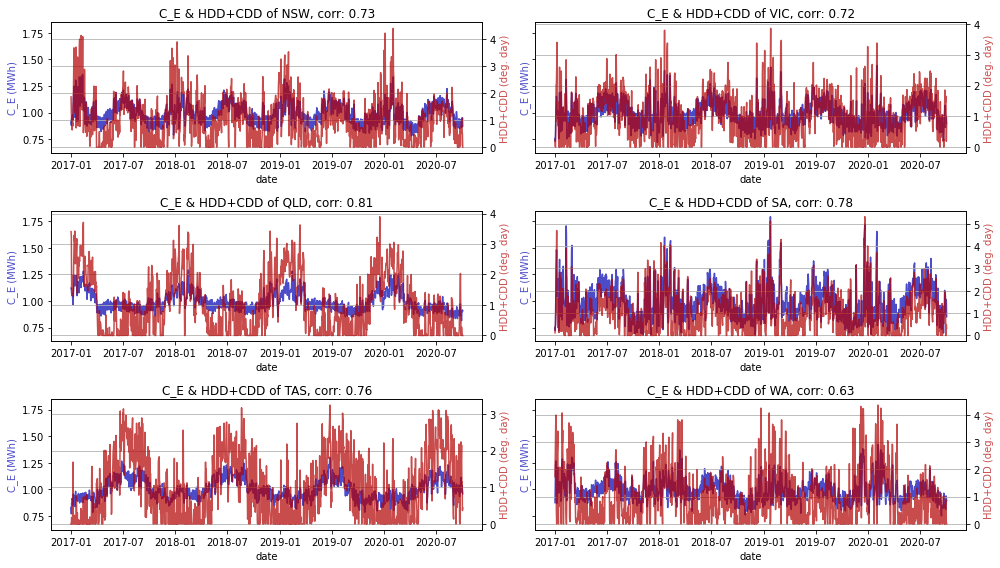

In [591]:
fig, axes = plt.subplots(3,2, figsize = (14,8), sharey=True)

cond = matrix_ele_day.year.isin([2017,2018,2019,2020])

for i, ax in enumerate(axes):

    for j,ax1 in enumerate(ax):

        n = i*2+j
        state = states[n]

        x = matrix_ele_day[cond].date            
        y1 = matrix_ele_day[cond][state]
        y2 = matrix_ele_day[cond][state+'_HDD']+matrix_ele_day[cond][state+'_CDD']
        
        corr = y1.corr(y2)

        ax2 = ax1.twinx()
        ax1.plot(x, y1/y1.mean(),color = [0.0,0.0,0.7,0.7])   # change the color for different players
        ax2.plot(x, y2/y2.mean(),color = [0.7,0.0,0.0,0.7])
        ax1.set_xlabel('date')
        ax1.set_ylabel('C_E (MWh)',color = [0.0,0.0,0.7,0.7])
        ax2.set_ylabel('HDD+CDD (deg. day)',color = [0.7,0.0,0.0,0.7])
        #ax1.set_ylim([min(y1)/1.05,1.05*max(y1)])
        #ax2.set_ylim([min(y2)/1.05,1.05*max(y2)])
        plt.title('C_E & HDD+CDD of {}, corr: {}'. format(state, round(corr,2)))
        plt.grid()

plt.tight_layout()

To reduce the randomness, We can compare the 10-day summation data of each month.

In [52]:
matrix_ele_10day = pd.DataFrame()

for i,state in enumerate(states):
    
    if i == 0:
        matrix_10day = matrix_ele_day.groupby(['year','month','EML_of_month'])[['solar',state,state+'_HDD',state+'_CDD',state+'_diff']].sum().reset_index()
    
        matrix_ele_10day = matrix_10day
        
    else:
        matrix_10day = matrix_ele_day.groupby(['year','month','EML_of_month'])[[state,state+'_HDD',state+'_CDD',state+'_diff']].sum().reset_index()
    
        matrix_ele_10day = matrix_ele_10day.merge(matrix_10day,on=['year','month','EML_of_month'],how='outer')
    
matrix_ele_10day['day'] = matrix_ele_10day['EML_of_month']-5
matrix_ele_10day['date']=pd.to_datetime(matrix_ele_10day[['year','month','day']])
matrix_ele_10day

,year,month,EML_of_month,solar,NSW,NSW_HDD,NSW_CDD,NSW_diff,VIC,VIC_HDD,VIC_CDD,VIC_diff,QLD,QLD_HDD,QLD_CDD,QLD_diff,SA,SA_HDD,SA_CDD,SA_diff,TAS,TAS_HDD,TAS_CDD,TAS_diff,WA,WA_HDD,WA_CDD,WA_diff,day,date
0,2013,1,10,9.957887,3954180.28,0.000000,50.850000,113.300000,2642081.22,0.45,42.200000,145.600000,2952485.97,0.00,60.700000,114.000000,791341.12,0.00,54.90,148.8,506238.81,2.350000,19.60,126.800000,1117757.72,0.000000,66.30,124.000000,5,2013-01-05
1,2013,1,20,9.943127,4030628.48,0.000000,47.800000,118.400000,2643174.39,0.00,30.850000,137.900000,3133350.56,0.00,78.850000,113.100000,757492.75,0.00,32.35,125.6,513230.66,0.850000,1.60,104.800000,1140146.20,0.000000,65.00,125.200000,15,2013-01-15
2,2013,1,30,10.570307,4435019.66,0.000000,54.300000,93.600000,2923171.37,0.00,24.750000,120.800000,3256317.35,0.00,62.950000,72.300000,777502.36,0.00,15.40,123.3,564169.83,3.150000,0.00,104.800000,1188594.94,0.000000,67.50,179.400000,25,2013-01-25
3,2013,2,10,8.967853,3850540.64,0.000000,31.600000,108.400000,2667482.56,2.05,29.100000,124.700000,2838652.55,0.00,41.200000,105.200000,711922.83,0.00,16.75,113.2,510685.88,3.000000,10.75,107.100000,1054848.82,0.000000,69.90,185.800000,5,2013-02-05
4,2013,2,20,8.082822,3873487.84,0.000000,21.500000,91.000000,2889400.07,0.00,54.500000,140.000000,2862190.33,0.00,33.950000,87.700000,848618.98,0.00,62.05,127.3,511812.37,3.400000,10.35,98.500000,1209767.28,0.000000,88.15,146.900000,15,2013-02-15
5,2013,2,30,5.667634,3239010.75,0.000000,40.500000,68.000000,2289598.85,0.00,43.750000,100.600000,2324150.54,0.00,41.250000,58.300000,654550.66,0.00,37.45,79.9,408495.53,2.050000,8.60,66.200000,879321.56,0.000000,56.45,115.600000,25,2013-02-25
6,2013,3,10,5.910571,3784780.95,0.000000,24.300000,96.200000,2891273.97,0.00,63.850000,156.300000,2772283.19,0.00,36.400000,74.400000,845424.94,0.00,71.70,115.4,529628.83,2.150000,6.65,87.000000,1001575.29,0.000000,52.95,137.900000,5,2013-03-05
7,2013,3,20,4.445158,3834728.35,0.000000,23.400000,102.700000,2776154.91,3.90,33.550000,105.500000,2799760.34,0.00,33.150000,117.300000,742515.92,0.15,32.85,100.0,500522.89,7.000000,11.50,100.600000,955489.76,0.000000,37.55,111.400000,15,2013-03-15
8,2013,3,30,3.041903,4149777.20,0.000000,38.150000,143.100000,2783459.18,4.75,21.100000,115.400000,3053158.87,0.00,46.250000,109.100000,721382.30,0.85,16.55,85.0,517647.02,4.300000,3.40,105.800000,999008.03,1.600000,7.75,157.800000,25,2013-03-25
9,2013,4,10,0.997008,3639613.43,0.000000,1.750000,95.200000,2543152.37,7.80,4.200000,118.400000,2686613.90,0.00,13.700000,101.400000,661409.53,0.05,3.25,123.2,530241.46,11.800000,0.00,83.200000,1034581.27,0.000000,59.90,161.800000,5,2013-04-05


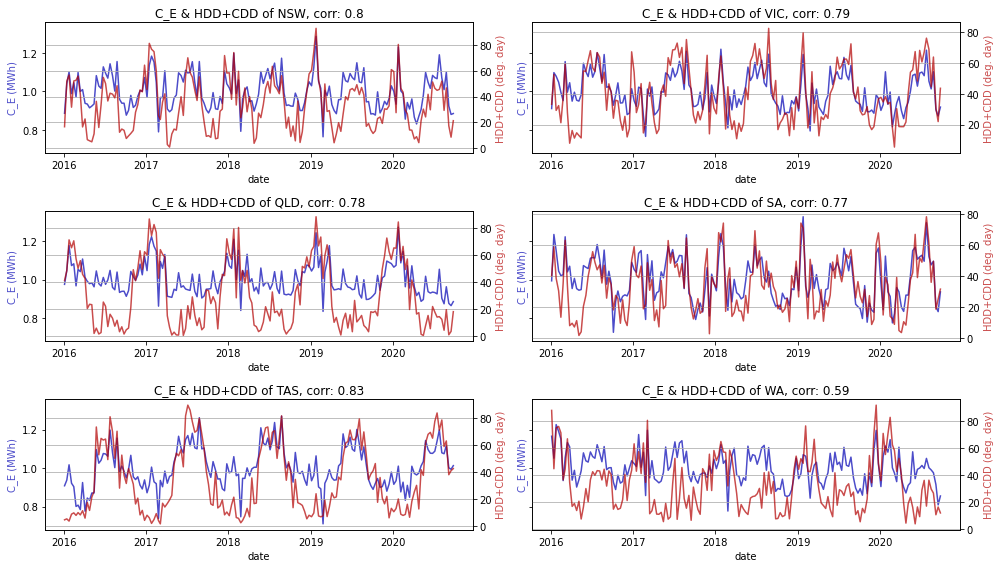

In [53]:
fig, axes = plt.subplots(3,2, figsize = (14,8), sharey=True)

cond = (matrix_ele_10day.date<'2020-10-01')&(matrix_ele_10day.date>'2016-01-01')


for i, ax in enumerate(axes):

    for j,ax1 in enumerate(ax):

        n = i*2+j
        state = states[n]

        x = matrix_ele_10day[cond].date            
        y1 = matrix_ele_10day[cond][state]
        y2 = matrix_ele_10day[cond][state+'_HDD']+matrix_ele_10day[cond][state+'_CDD']
        
        corr = y1.corr(y2)

        ax2 = ax1.twinx()
        ax1.plot(x, y1/y1.mean(),color = [0.0,0.0,0.7,0.7])   # change the color for different players
        ax2.plot(x, y2,color = [0.7,0.0,0.0,0.7])
        ax1.set_xlabel('date')
        ax1.set_ylabel('C_E (MWh)',color = [0.0,0.0,0.7,0.7])
        ax2.set_ylabel('HDD+CDD (deg. day)',color = [0.7,0.0,0.0,0.7])
        #ax1.set_ylim([min(y1)/1.05,1.05*max(y1)])
        #ax2.set_ylim([min(y2)/1.05,1.05*max(y2)])
        plt.title('C_E & HDD+CDD of {}, corr: {}'. format(state, round(corr,2)))
        plt.grid()

plt.tight_layout()

The figures and the correlation coefficients show that the electricity consumption and the HDD+CDD have a clear positive correlation.

### Economic indicators

From the Australian Bureau of Statistics, we get the annual GSP of each states and the seasonally GDP of the whole country.

In [54]:
GSP = pd.read_csv('https://raw.githubusercontent.com/Metaming/COVID-19/master/annual_gross_state_product_all_states.csv')
GSP.loc[9,'date'] = '2020-06-30'
#GSP['year'] = pd.to_datetime(GSP['year'],format='%Y-%m', errors='ignore')#.dt.to_period('M').dt.to_timestamp('s').dt.strftime('%Y-%m')

GSP 

,date,NSW,VIC,QLD,SA,WA,TAS,NT,ACT,Australia
0,2011-06-30,504340.0,358943.0,289605.0,98612.0,201434.0,28130.0,20635.0,32446.0,1529212.0
1,2012-06-30,516038.0,366246.0,305645.0,99569.0,220648.0,28333.0,21607.0,33696.0,1589129.0
2,2013-06-30,525816.0,370232.0,314029.0,100633.0,233689.0,28259.0,24189.0,34563.0,1630206.0
3,2014-06-30,535464.0,378812.0,320742.0,101438.0,247281.0,28552.0,24502.0,34871.0,1671501.0
4,2015-06-30,549534.0,389391.0,323849.0,102333.0,253346.0,28865.0,25105.0,35681.0,1708151.0
5,2016-06-30,570349.0,402564.0,331726.0,102602.0,256383.0,29364.0,25601.0,37062.0,1755478.0
6,2017-06-30,588454.0,418885.0,339652.0,104125.0,251941.0,29685.0,25977.0,38280.0,1797041.0
7,2018-06-30,603143.0,432993.0,352248.0,106477.0,258120.0,30710.0,26501.0,39686.0,1849880.0
8,2019-06-30,614409.0,446079.0,357044.0,107990.0,260640.0,31819.0,26109.0,40879.0,1884969.0
9,2020-06-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [55]:
GSP['date'] = pd.to_datetime(GSP['date'])
GSP['year'] = GSP['date'].dt.year

matrix_ele_day['date'] = pd.to_datetime(matrix_ele_day['date'])

In [56]:
from scipy.interpolate import CubicSpline
GSP_fit = pd.DataFrame()
GSP_fit[['date','year','month','EML_of_month']] = matrix_ele_day[['date','year','month','EML_of_month']]
GSP_fit = GSP_fit.merge(GSP['date'], on='date',how='outer').sort_values(by='date').reset_index().drop('index',axis=1)


for state in states:
     
    GSP_fit[state+'_GSP_i'] = GSP_fit.merge(GSP[['date',state]], on='date',how='outer')[state]
    #GSP_fit.loc[:,state+'_GSP_i'] = GSP_fit.merge(GSP[['date',state]], on='date',how='outer')[state]
    #GSP_fit[state+'_GSP_i'] = GSP_fit[state+'_GSP_i'].interpolate(method='spline',order=1,limit_area='inside')
    
    GSP_fit_time = GSP_fit.set_index('date')
    #GSP_fit[state+'_GSP_i'] = GSP_fit_time[state+'_GSP_i'].interpolate(method='time',order=2).values
    
     
#     normalize the GSP so that the total amount remain unchanged each finacial year
    for j,year in enumerate(year_range[0:-1]):
        
        min_date = str(year-1)+'-06-30'
        max_date = str(year)+'-06-30'
        mid_date = str(year-1)+'-12-29'
        #print(min_date,max_date)
        
        cond = (GSP_fit.date<=max_date)&(GSP_fit.date>min_date)
        i = GSP[GSP['year']==year].index
        idx = GSP_fit[cond].index
        
        i_min = GSP_fit[GSP_fit['date']==min_date].index
        i_max = GSP_fit[GSP_fit['date']==max_date].index
        i_mid = GSP_fit[GSP_fit['date']==mid_date].index
        
        GSP_fit.loc[i_min,state+'_GSP'] = 0.5*(GSP.loc[i,state].values+GSP.loc[i-1,state].values)/365.25
        
        if GSP.loc[i+1,state].values>0:
            GSP_fit.loc[i_max,state+'_GSP'] = 0.5*(GSP.loc[i,state].values+GSP.loc[i+1,state].values)/365.25
            GSP_fit.loc[i_mid,state+'_GSP'] = 2*GSP.loc[i,state].values/365.25-0.5*(GSP_fit.loc[i_min,state+'_GSP'].values+GSP_fit.loc[i_max,state+'_GSP'].values)
        else:
            GSP_fit.loc[i_max,state+'_GSP'] =  2*(GSP.loc[i,state].values+GSP_fit.loc[i_min,state+'_GSP'].values)/(len(idx)+1)-GSP_fit.loc[i_min,state+'_GSP'].values
            
            

    
    GSP_fit[state+'_GSP_i'] = GSP_fit[state+'_GSP'].interpolate(method='linear',order=1).values        
     
  

C:\Program Files (x86)\Python\WPy64-3761b1\python-3.7.6.amd64\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in greater


In [1147]:
#         if (GSP.loc[i,state]-GSP.loc[i+1,state])*(GSP.loc[i-1,state]-GSP.loc[i,state])>0:                
#             # if the GSP in the following financial year has the same trend, we set the GSP at the end if this financial year assuming monotonic change over the year
#             # we use a simple linear function 
#             GSP_fit.loc[i_max,state+'_GSP'] = 0.5*(GSP.loc[i,state]+GSP.loc[i+1,state])/365.25 
            
#         elif (GSP.loc[i,state]-GSP.loc[i+1,state])*(GSP.loc[i-1,state]-GSP.loc[i,state])<0:                
#             # if the GSP in the following financial year has an opposite trend, we set the GSP at the end if this financial year assuming monotonic change over the year

#             # we define additional points for the middle of the financial year, assuming it will be a V shape curve           
#             GSP_fit.loc[i_max,state+'_GSP'] =  0.5*(GSP.loc[i,state]+GSP.loc[i+1,state])/365.25
#             GSP_fit.loc[i_mid,state+'_GSP'] =  0.5*(GSP.loc[i,state]+GSP.loc[i+1,state])/365.25 
            
        
#         we assume in normal time, GSP is generally a smooth function, we set the GSP in the middle of the financial year 12-29
#         # using the daily-averaged GSP
        
#         #GSP_fit.loc[i_mid,state+'_GSP'] = GSP.loc[i,state].values/len(idx)
        
         
        
#         if year==2013:            
# #             we start from 2013-01, so only take half the GSP of the financial year
# #             for the first year, we simply normalize to the half year GSP
            
#             jdx = GSP_fit[(GSP_fit.date>'2013-01-01')&(GSP_fit.date<'2013-07-01')].index
#             #GSP_fit.loc[idx,state+'_GSP'] = len(jdx)/365*GSP_fit.loc[idx,state+'_GSP_i']*(GSP.loc[i,state].values)/(GSP_fit.loc[idx,state+'_GSP_i'].sum())
#             GSP_fit.loc[i_mid,state+'_GSP'] = GSP.loc[i,state].values/len(idx)
#             #GSP_fit.loc[idx,state+'_GSP_i'] = len(jdx)/365*GSP_fit.loc[idx,state+'_GSP_i']*(GSP.loc[i,state].values)/(GSP_fit.loc[idx,state+'_GSP_i'].sum())
             
#         else:
#             # from the second year, we need to make sure the GSP is continuous and the total yearly GSP is correct
            
#             if (GSP.loc[i,state]-GSP.loc[i+1,state])*(GSP.loc[i-1,state]-GSP.loc[i,state])>0:                
#                 # if the GSP in the following financial year has the same trend, we set the GSP at the end if this financial year assuming monotonic change over the year
#                 # we use a simple linear function 
#                 GSP_fit.loc[i_max,state+'_GSP'] =  2*(GSP.loc[i,state].values+GSP_fit.loc[i_min,state+'_GSP'].values)/(len(idx)+1)-GSP_fit.loc[i_min,state+'_GSP'].values
            
#             elif (GSP.loc[i,state]-GSP.loc[i+1,state])*(GSP.loc[i-1,state]-GSP.loc[i,state])<0:                
#                 # if the GSP in the following financial year has an opposite trend, we set the GSP at the end if this financial year assuming monotonic change over the year
                
#                 # we use a linear function 
#                 GSP_fit.loc[i_max,state+'_GSP'] =  2*(GSP.loc[i,state].values+GSP_fit.loc[i_min,stat    
            
# #             GSP_fit.loc[idx,state+'_GSP_i'] =  GSP_fit.loc[idx,state+'_GSP_i']*(GSP.loc[i,state].values)/(GSP_fit.loc[idx,state+'_GSP_i'].sum())
        
        

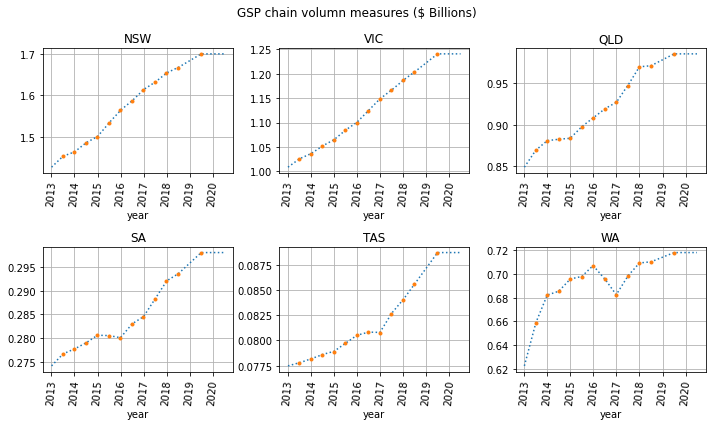

In [57]:
# we plot the 6 states we studied in this report
plt.figure(figsize=(10,6))

cond = (GSP_fit.date>'2013-01-02') & (GSP_fit.date<'2020-07-01') 
cond1 = (GSP.date>'2013-01-02') & (GSP.date<'2020-07-01') 

for i,state in enumerate(states):
    plt.subplot(2,3,i+1)
    #plt.plot(GSP[cond1].date,GSP[cond1][state]/365.25/1e3,'*-')
    plt.plot(GSP_fit[cond].date,GSP_fit[cond][state+'_GSP_i']/1e3,':')     
    plt.plot(GSP_fit[cond].date,GSP_fit[cond][state+'_GSP']/1e3,'.')
    plt.xlabel('year')
    plt.title(state)
    plt.xticks(rotation = 85)
    #plt.legend(['actual','fit'])
    plt.grid()
    
plt.suptitle('GSP chain volumn measures ($ Billions)')
plt.tight_layout() 

In [61]:
for state in states:
    matrix_ele_day = matrix_ele_day.merge(GSP_fit[['date',state+'_GSP_i']], on='date', how='left' )
    
matrix_ele_day.to_pickle('elec_temp_gsp.pkl')

In [2]:
matrix_ele_day = pd.read_pickle('elec_temp_gsp.pkl')
matrix_ele_day.head()

,date,NSW,VIC,QLD,SA,TAS,WA,year,month,week,day,day_of_year,day_of_week,EML_of_month,solar,NSW_max,NSW_min,NSW_ave,NSW_diff,NSW_HDD,NSW_CDD,VIC_max,VIC_min,VIC_ave,VIC_diff,VIC_HDD,VIC_CDD,QLD_max,QLD_min,QLD_ave,QLD_diff,QLD_HDD,QLD_CDD,SA_max,SA_min,SA_ave,SA_diff,SA_HDD,SA_CDD,TAS_max,TAS_min,TAS_ave,TAS_diff,TAS_HDD,TAS_CDD,WA_max,WA_min,WA_ave,WA_diff,WA_HDD,WA_CDD,NSW_GSP_i,VIC_GSP_i,QLD_GSP_i,SA_GSP_i,TAS_GSP_i,WA_GSP_i
0,2013-01-01,346328.03,209105.56,259269.66,63256.94,42716.12,83180.58,2013,1,1,1,1,1,10,0.988039,31.3,20.0,25.65,11.3,-0.0,6.15,26.0,13.4,19.70,12.6,-0.0,1.70,30.7,18.5,24.60,12.2,-0.0,4.60,25.9,12.7,19.30,13.2,-0.0,0.30,21.8,14.1,17.95,7.7,-0.0,-0.00,32.0,24.3,28.15,7.7,-0.0,9.15,1426.367318,1008.278474,848.401655,274.075737,77.471882,622.154885
1,2013-01-02,361317.14,238533.19,302096.48,75150.73,48400.39,106805.79,2013,1,1,2,2,2,10,0.990545,24.7,19.8,22.25,4.9,-0.0,2.75,21.6,13.9,17.75,7.7,-0.0,-0.00,36.3,19.3,27.80,17.0,-0.0,7.80,31.4,12.7,22.05,18.7,-0.0,3.05,23.9,8.9,16.40,15.0,-0.0,-0.00,28.6,21.7,25.15,6.9,-0.0,6.15,1426.514239,1008.373512,848.515835,274.089873,77.473539,622.356314
2,2013-01-03,370664.31,288996.78,296733.64,93525.61,52502.95,102829.52,2013,1,1,3,3,3,10,0.992759,26.7,16.8,21.75,9.9,-0.0,2.25,37.4,11.9,24.65,25.5,-0.0,6.65,31.0,22.7,26.85,8.3,-0.0,6.85,38.6,19.8,29.20,18.8,-0.0,10.20,33.8,12.9,23.35,20.9,-0.0,3.35,26.9,16.2,21.55,10.7,-0.0,2.55,1426.661161,1008.468551,848.630016,274.104008,77.475195,622.557743
3,2013-01-04,397909.05,333499.72,290791.63,100142.94,52272.30,95117.27,2013,1,1,4,4,4,10,0.994678,31.5,15.4,23.45,16.1,-0.0,3.95,41.6,20.7,31.15,20.9,-0.0,13.15,30.5,21.5,26.00,9.0,-0.0,6.00,44.1,22.9,33.50,21.2,-0.0,14.50,41.8,23.4,32.60,18.4,-0.0,12.60,26.1,14.2,20.15,11.9,-0.0,1.15,1426.808082,1008.563589,848.744196,274.118144,77.476851,622.759171
4,2013-01-05,396019.12,260577.50,275464.35,71180.34,49737.98,101535.50,2013,1,1,5,5,5,10,0.996303,33.6,16.5,25.05,17.1,-0.0,5.55,26.4,18.5,22.45,7.9,-0.0,4.45,28.7,20.9,24.80,7.8,-0.0,4.80,31.8,19.4,25.60,12.4,-0.0,6.60,25.1,17.5,21.30,7.6,-0.0,1.30,37.9,12.7,25.30,25.2,-0.0,6.30,1426.955003,1008.658627,848.858377,274.132279,77.478507,622.960600


* PV Installation


In [6]:
url = 'https://raw.githubusercontent.com/Metaming/COVID-19/master/PV_installation.csv'
matrix_pv = pd.read_csv(url)
matrix_pv 

,year_month,NSW,VIC,QLD,SA,TAS,WA
0,2007-01,26.0,24.0,10.0,56.0,0.0,38.0
1,2007-02,95.0,70.0,35.0,180.0,0.0,106.0
2,2007-03,208.0,162.0,69.0,391.0,0.0,210.0
3,2007-04,366.0,314.0,115.0,658.0,2.0,329.0
4,2007-05,578.0,526.0,162.0,951.0,2.0,475.0
5,2007-06,854.0,796.0,235.0,1335.0,5.0,672.0
6,2007-07,1253.0,1143.0,363.0,1868.0,13.0,899.0
7,2007-08,1794.0,1607.0,534.0,2603.0,23.0,1188.0
8,2007-09,2521.0,2207.0,795.0,3503.0,38.0,1550.0
9,2007-10,3450.0,3032.0,1216.0,4635.0,54.0,1981.0


In [7]:
matrix_pv['date'] = matrix_pv['year_month']+'-15'
matrix_pv['date'] = pd.to_datetime(matrix_pv['date'])

for state in states:
    matrix_pv.rename(columns={state:state+'_PV'},inplace = True)
    
matrix_pv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 163 entries, 0 to 162
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   year_month  162 non-null    object        
 1   NSW_PV      162 non-null    float64       
 2   VIC_PV      162 non-null    float64       
 3   QLD_PV      162 non-null    float64       
 4   SA_PV       162 non-null    float64       
 5   TAS_PV      162 non-null    float64       
 6   WA_PV       162 non-null    float64       
 7   date        162 non-null    datetime64[ns]
dtypes: datetime64[ns](1), float64(6), object(1)
memory usage: 10.3+ KB


In [8]:
matrix_ele_day = matrix_ele_day.merge(matrix_pv, on='date',how='left')
#matrix_ele_day

In [9]:
for state in states:
    matrix_ele_day[state+'_PV'] = matrix_ele_day[state+'_PV'].interpolate(method='linear', order=1)
    matrix_ele_day[state+'_solar_PV'] =  matrix_ele_day[state+'_PV']*(1+matrix_ele_day['solar'])
    

In [227]:
# plt.figure
# for state in states:
#     plt.plot(matrix_ele_day.date,matrix_ele_day[state+'_solar_PV'])

### Feature Engineering

We add additional features to identify if the day is weekend

In [3]:
matrix_ele_day['weekend'] = 1*(matrix_ele_day['day_of_week']>=5)

To identify if the day is a public holiday of the state, we download data from https://data.gov.au/dataset/ds-dga-b1bc6077-dadd-4f61-9f8c-002ab2cdff10/details?q=

In [4]:
data_hday = pd.read_csv('https://raw.githubusercontent.com/Metaming/COVID-19/master/australianpublicholidays_2014-2019.csv')
data_hday

,Date,Holiday Name,Information,More Information,Applicable To
0,20140101,New Year's Day,New Year's Day is the first day of the calenda...,NaN,NAT
1,20140127,Australia Day,Always celebrated on 26 January,NaN,NAT
2,20140303,Labour Day,"Always on a Monday, creating a long weekend. I...",http://www.commerce.wa.gov.au/labour-relations...,WA
3,20140310,March public holiday,The Holidays Act 1910 provides for the third M...,http://www.safework.sa.gov.au/show_page.jsp?id...,SA
4,20140310,Canberra Day,Held on the second Monday of March each year i...,http://www.cmd.act.gov.au/communication/holidays,ACT
5,20140310,Eight Hours Day,"Always on a Monday, creating a long weekend. I...",http://worksafe.tas.gov.au/resources/public_ho...,TAS
6,20140310,Labour Day,"Always on a Monday, creating a long weekend. I...",http://www.business.vic.gov.au/victorian-publi...,VIC
7,20140418,Good Friday,Easter is celebrated with Good Friday and East...,NaN,NAT
8,20140419,Easter Saturday,Easter Saturday is between Good Friday and Eas...,NaN,NAT
9,20140420,Easter Sunday,Public Holiday as part of Easter.,NaN,NSW|VIC


In [5]:
# the data is messy, clean it up and extract the dates and the states that have public holidays
 
data_hday['date'] = pd.to_datetime(data_hday['Date'].astype(str)) #,format='%Y%m%d %H:%M:%S', errors='ignore').dt.date()
data_hday['Applicable To'] = data_hday['Applicable To'].str.upper() 
data_hday['split']= data_hday['Applicable To'].str.split('|')

matrix_hday = pd.DataFrame()

for i in data_hday.index:
    
    date = data_hday.loc[i,'date']
    
    for state in data_hday.loc[i,'split']:        
        
        matrix_hday.loc[date,state+'_HDAY'] = 1
    
matrix_hday[matrix_hday.NAT_HDAY == 1] = matrix_hday[matrix_hday.NAT_HDAY == 1].loc[:,:].fillna(1)
matrix_hday = matrix_hday.fillna(0).reset_index() 

In [6]:
matrix_hday = matrix_hday.rename(columns = {'index':'date'})
matrix_hday.head()

,date,NAT_HDAY,WA_HDAY,SA_HDAY,ACT_HDAY,TAS_HDAY,VIC_HDAY,NSW_HDAY,NT_HDAY,QLD_HDAY
0,2014-01-01,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,2014-01-27,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,2014-03-03,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2014-03-10,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0
4,2014-04-18,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [7]:
matrix_ele_day = matrix_ele_day.merge(matrix_hday.drop(['NAT_HDAY','ACT_HDAY','NT_HDAY'],axis=1),on='date',how='left')
matrix_ele_day[['WA_HDAY','SA_HDAY','TAS_HDAY','VIC_HDAY','NSW_HDAY','QLD_HDAY']] = matrix_ele_day[['WA_HDAY','SA_HDAY','TAS_HDAY','VIC_HDAY','NSW_HDAY','QLD_HDAY']].fillna(0)
matrix_ele_day.head()

,date,NSW,VIC,QLD,SA,TAS,WA,year,month,week,day,day_of_year,day_of_week,EML_of_month,solar,NSW_max,NSW_min,NSW_ave,NSW_diff,NSW_HDD,NSW_CDD,VIC_max,VIC_min,VIC_ave,VIC_diff,VIC_HDD,VIC_CDD,QLD_max,QLD_min,QLD_ave,QLD_diff,QLD_HDD,QLD_CDD,SA_max,SA_min,SA_ave,SA_diff,SA_HDD,SA_CDD,TAS_max,TAS_min,TAS_ave,TAS_diff,TAS_HDD,TAS_CDD,WA_max,WA_min,WA_ave,WA_diff,WA_HDD,WA_CDD,NSW_GSP_i,VIC_GSP_i,QLD_GSP_i,SA_GSP_i,TAS_GSP_i,WA_GSP_i,weekend,WA_HDAY,SA_HDAY,TAS_HDAY,VIC_HDAY,NSW_HDAY,QLD_HDAY
0,2013-01-01,346328.03,209105.56,259269.66,63256.94,42716.12,83180.58,2013,1,1,1,1,1,10,0.988039,31.3,20.0,25.65,11.3,-0.0,6.15,26.0,13.4,19.70,12.6,-0.0,1.70,30.7,18.5,24.60,12.2,-0.0,4.60,25.9,12.7,19.30,13.2,-0.0,0.30,21.8,14.1,17.95,7.7,-0.0,-0.00,32.0,24.3,28.15,7.7,-0.0,9.15,1426.367318,1008.278474,848.401655,274.075737,77.471882,622.154885,0,0.0,0.0,0.0,0.0,0.0,0.0
1,2013-01-02,361317.14,238533.19,302096.48,75150.73,48400.39,106805.79,2013,1,1,2,2,2,10,0.990545,24.7,19.8,22.25,4.9,-0.0,2.75,21.6,13.9,17.75,7.7,-0.0,-0.00,36.3,19.3,27.80,17.0,-0.0,7.80,31.4,12.7,22.05,18.7,-0.0,3.05,23.9,8.9,16.40,15.0,-0.0,-0.00,28.6,21.7,25.15,6.9,-0.0,6.15,1426.514239,1008.373512,848.515835,274.089873,77.473539,622.356314,0,0.0,0.0,0.0,0.0,0.0,0.0
2,2013-01-03,370664.31,288996.78,296733.64,93525.61,52502.95,102829.52,2013,1,1,3,3,3,10,0.992759,26.7,16.8,21.75,9.9,-0.0,2.25,37.4,11.9,24.65,25.5,-0.0,6.65,31.0,22.7,26.85,8.3,-0.0,6.85,38.6,19.8,29.20,18.8,-0.0,10.20,33.8,12.9,23.35,20.9,-0.0,3.35,26.9,16.2,21.55,10.7,-0.0,2.55,1426.661161,1008.468551,848.630016,274.104008,77.475195,622.557743,0,0.0,0.0,0.0,0.0,0.0,0.0
3,2013-01-04,397909.05,333499.72,290791.63,100142.94,52272.30,95117.27,2013,1,1,4,4,4,10,0.994678,31.5,15.4,23.45,16.1,-0.0,3.95,41.6,20.7,31.15,20.9,-0.0,13.15,30.5,21.5,26.00,9.0,-0.0,6.00,44.1,22.9,33.50,21.2,-0.0,14.50,41.8,23.4,32.60,18.4,-0.0,12.60,26.1,14.2,20.15,11.9,-0.0,1.15,1426.808082,1008.563589,848.744196,274.118144,77.476851,622.759171,0,0.0,0.0,0.0,0.0,0.0,0.0
4,2013-01-05,396019.12,260577.50,275464.35,71180.34,49737.98,101535.50,2013,1,1,5,5,5,10,0.996303,33.6,16.5,25.05,17.1,-0.0,5.55,26.4,18.5,22.45,7.9,-0.0,4.45,28.7,20.9,24.80,7.8,-0.0,4.80,31.8,19.4,25.60,12.4,-0.0,6.60,25.1,17.5,21.30,7.6,-0.0,1.30,37.9,12.7,25.30,25.2,-0.0,6.30,1426.955003,1008.658627,848.858377,274.132279,77.478507,622.960600,1,0.0,0.0,0.0,0.0,0.0,0.0


Adding the degree day calculation based on maximal and minimal temperatures to reflect the influence of heat and cold front

In [16]:
for i,state in enumerate(states):
    T_CDD = CDD_HDD.loc[i,'T_CDD']
    T_HDD = CDD_HDD.loc[i,'T_HDD']
    matrix_ele_day.loc[:,state+'_HDD_m'] = 1*(matrix_ele_day.loc[:,state+'_ave']<T_HDD)*(T_HDD-matrix_ele_day.loc[:,state+'_min'])
    matrix_ele_day.loc[:,state+'_CDD_m'] = 1*(matrix_ele_day.loc[:,state+'_ave']>T_CDD)*(-T_CDD+matrix_ele_day.loc[:,state+'_max']) 
    
matrix_ele_day.head()

,date,NSW,VIC,QLD,SA,TAS,WA,year,month,week,day,day_of_year,day_of_week,EML_of_month,solar,NSW_max,NSW_min,NSW_ave,NSW_diff,NSW_HDD,NSW_CDD,VIC_max,VIC_min,VIC_ave,VIC_diff,VIC_HDD,VIC_CDD,QLD_max,QLD_min,QLD_ave,QLD_diff,QLD_HDD,QLD_CDD,SA_max,SA_min,SA_ave,SA_diff,SA_HDD,SA_CDD,TAS_max,TAS_min,TAS_ave,TAS_diff,TAS_HDD,TAS_CDD,WA_max,WA_min,WA_ave,WA_diff,WA_HDD,WA_CDD,NSW_GSP_i,VIC_GSP_i,QLD_GSP_i,SA_GSP_i,TAS_GSP_i,WA_GSP_i,weekend,WA_HDAY,SA_HDAY,TAS_HDAY,VIC_HDAY,NSW_HDAY,QLD_HDAY,NSW_HDD_m,NSW_CDD_m,VIC_HDD_m,VIC_CDD_m,QLD_HDD_m,QLD_CDD_m,SA_HDD_m,SA_CDD_m,TAS_HDD_m,TAS_CDD_m,WA_HDD_m,WA_CDD_m
0,2013-01-01,346328.03,209105.56,259269.66,63256.94,42716.12,83180.58,2013,1,1,1,1,1,10,0.988039,31.3,20.0,25.65,11.3,-0.0,6.15,26.0,13.4,19.70,12.6,-0.0,1.70,30.7,18.5,24.60,12.2,-0.0,4.60,25.9,12.7,19.30,13.2,-0.0,0.30,21.8,14.1,17.95,7.7,-0.0,-0.00,32.0,24.3,28.15,7.7,-0.0,9.15,1426.367318,1008.278474,848.401655,274.075737,77.471882,622.154885,0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,11.8,0.0,8.0,-0.0,10.7,0.0,6.9,0.0,0.0,-0.0,13.0
1,2013-01-02,361317.14,238533.19,302096.48,75150.73,48400.39,106805.79,2013,1,1,2,2,2,10,0.990545,24.7,19.8,22.25,4.9,-0.0,2.75,21.6,13.9,17.75,7.7,-0.0,-0.00,36.3,19.3,27.80,17.0,-0.0,7.80,31.4,12.7,22.05,18.7,-0.0,3.05,23.9,8.9,16.40,15.0,-0.0,-0.00,28.6,21.7,25.15,6.9,-0.0,6.15,1426.514239,1008.373512,848.515835,274.089873,77.473539,622.356314,0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,5.2,0.0,0.0,-0.0,16.3,0.0,12.4,0.0,0.0,-0.0,9.6
2,2013-01-03,370664.31,288996.78,296733.64,93525.61,52502.95,102829.52,2013,1,1,3,3,3,10,0.992759,26.7,16.8,21.75,9.9,-0.0,2.25,37.4,11.9,24.65,25.5,-0.0,6.65,31.0,22.7,26.85,8.3,-0.0,6.85,38.6,19.8,29.20,18.8,-0.0,10.20,33.8,12.9,23.35,20.9,-0.0,3.35,26.9,16.2,21.55,10.7,-0.0,2.55,1426.661161,1008.468551,848.630016,274.104008,77.475195,622.557743,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.2,0.0,19.4,-0.0,11.0,-0.0,19.6,0.0,13.8,0.0,7.9
3,2013-01-04,397909.05,333499.72,290791.63,100142.94,52272.30,95117.27,2013,1,1,4,4,4,10,0.994678,31.5,15.4,23.45,16.1,-0.0,3.95,41.6,20.7,31.15,20.9,-0.0,13.15,30.5,21.5,26.00,9.0,-0.0,6.00,44.1,22.9,33.50,21.2,-0.0,14.50,41.8,23.4,32.60,18.4,-0.0,12.60,26.1,14.2,20.15,11.9,-0.0,1.15,1426.808082,1008.563589,848.744196,274.118144,77.476851,622.759171,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,-0.0,23.6,-0.0,10.5,-0.0,25.1,-0.0,21.8,0.0,7.1
4,2013-01-05,396019.12,260577.50,275464.35,71180.34,49737.98,101535.50,2013,1,1,5,5,5,10,0.996303,33.6,16.5,25.05,17.1,-0.0,5.55,26.4,18.5,22.45,7.9,-0.0,4.45,28.7,20.9,24.80,7.8,-0.0,4.80,31.8,19.4,25.60,12.4,-0.0,6.60,25.1,17.5,21.30,7.6,-0.0,1.30,37.9,12.7,25.30,25.2,-0.0,6.30,1426.955003,1008.658627,848.858377,274.132279,77.478507,622.960600,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.1,-0.0,8.4,-0.0,8.7,-0.0,12.8,-0.0,5.1,0.0,18.9


Adding the moving-averaged degree day calculation to reflect the influence of short-term memory effect.

In [17]:
for state in states:
    matrix_ele_day.loc[:,state+'_HDD_3d'] = matrix_ele_day.loc[:,state+'_HDD'].rolling(window=3).mean()
    matrix_ele_day.loc[:,state+'_CDD_3d'] = matrix_ele_day.loc[:,state+'_CDD'].rolling(window=3).mean()
    matrix_ele_day.loc[:,state+'_HDD_5d'] = matrix_ele_day.loc[:,state+'_HDD'].rolling(window=5).mean()
    matrix_ele_day.loc[:,state+'_CDD_5d'] = matrix_ele_day.loc[:,state+'_CDD'].rolling(window=5).mean()
    
    matrix_ele_day.loc[:,state+'_HDD_3d_n'] = matrix_ele_day.loc[:,state+'_HDD_n'].rolling(window=3).mean()
    matrix_ele_day.loc[:,state+'_CDD_3d_n'] = matrix_ele_day.loc[:,state+'_CDD_n'].rolling(window=3).mean()
    matrix_ele_day.loc[:,state+'_HDD_5d_n'] = matrix_ele_day.loc[:,state+'_HDD_n'].rolling(window=5).mean()
    matrix_ele_day.loc[:,state+'_CDD_5d_n'] = matrix_ele_day.loc[:,state+'_CDD_n'].rolling(window=5).mean()
    


In [163]:
for state in states:
    matrix_ele_day.loc[:,state+'_3d'] = matrix_ele_day.loc[:,state].rolling(window=3).mean()
    matrix_ele_day.loc[:,state+'_5d'] = matrix_ele_day.loc[:,state].rolling(window=5).mean()
    matrix_ele_day.loc[:,state+'_15d'] = matrix_ele_day.loc[:,state].rolling(window=15).mean()
    
    matrix_ele_day.loc[:,state+'_ave_3d'] = matrix_ele_day.loc[:,state+'_ave'].rolling(window=3).mean()
    matrix_ele_day.loc[:,state+'_ave_5d'] = matrix_ele_day.loc[:,state+'_ave'].rolling(window=5).mean()
    matrix_ele_day.loc[:,state+'_ave_15d'] = matrix_ele_day.loc[:,state+'_ave'].rolling(window=15).mean()
    


Adding the moving-averaged degree day with exponential decay window function.

In [18]:
#import scipy.signal.windows as window

for state in states:
    matrix_ele_day.loc[:,state+'_HDD_3dexp'] = matrix_ele_day.loc[:,state+'_HDD'].rolling(window=3,win_type = 'exponential').mean(tau = 0.87)
    matrix_ele_day.loc[:,state+'_CDD_3dexp'] = matrix_ele_day.loc[:,state+'_CDD'].rolling(window=3,win_type = 'exponential').mean(tau = 0.87)
    matrix_ele_day.loc[:,state+'_HDD_5dexp'] = matrix_ele_day.loc[:,state+'_HDD'].rolling(window=5,win_type = 'exponential').mean(tau = 1.76)
    matrix_ele_day.loc[:,state+'_CDD_5dexp'] = matrix_ele_day.loc[:,state+'_CDD'].rolling(window=5,win_type = 'exponential').mean(tau = 1.76)
    matrix_ele_day.loc[:,state+'_HDD_7dexp'] = matrix_ele_day.loc[:,state+'_HDD'].rolling(window=7,win_type = 'exponential').mean(tau = 2.61)
    matrix_ele_day.loc[:,state+'_CDD_7dexp'] = matrix_ele_day.loc[:,state+'_CDD'].rolling(window=7,win_type = 'exponential').mean(tau = 2.61)
    matrix_ele_day.loc[:,state+'_HDD_14dexp'] = matrix_ele_day.loc[:,state+'_HDD'].rolling(window=14,win_type = 'exponential').mean(tau = 5.22)
    matrix_ele_day.loc[:,state+'_CDD_14dexp'] = matrix_ele_day.loc[:,state+'_CDD'].rolling(window=14,win_type = 'exponential').mean(tau = 5.22)
    
    matrix_ele_day.loc[:,state+'_HDD_3dexp_n'] = matrix_ele_day.loc[:,state+'_HDD_n'].rolling(window=3,win_type = 'exponential').mean(tau = 0.87)
    matrix_ele_day.loc[:,state+'_CDD_3dexp_n'] = matrix_ele_day.loc[:,state+'_CDD_n'].rolling(window=3,win_type = 'exponential').mean(tau = 0.87)
    matrix_ele_day.loc[:,state+'_HDD_5dexp_n'] = matrix_ele_day.loc[:,state+'_HDD_n'].rolling(window=5,win_type = 'exponential').mean(tau = 1.76)
    matrix_ele_day.loc[:,state+'_CDD_5dexp_n'] = matrix_ele_day.loc[:,state+'_CDD_n'].rolling(window=5,win_type = 'exponential').mean(tau = 1.76)
    matrix_ele_day.loc[:,state+'_HDD_7dexp_n'] = matrix_ele_day.loc[:,state+'_HDD_n'].rolling(window=7,win_type = 'exponential').mean(tau = 2.61)
    matrix_ele_day.loc[:,state+'_CDD_7dexp_n'] = matrix_ele_day.loc[:,state+'_CDD_n'].rolling(window=7,win_type = 'exponential').mean(tau = 2.61)
    matrix_ele_day.loc[:,state+'_HDD_14dexp_n'] = matrix_ele_day.loc[:,state+'_HDD_n'].rolling(window=14,win_type = 'exponential').mean(tau = 5.22)
    matrix_ele_day.loc[:,state+'_CDD_14dexp_n'] = matrix_ele_day.loc[:,state+'_CDD_n'].rolling(window=14,win_type = 'exponential').mean(tau = 5.22)
    

We also add the high order and fractional order of the features to characterise the nonlinear effect.

In [162]:
for state in states:
    
    matrix_ele_day.loc[:,state+'_max2'] = matrix_ele_day.loc[:,state+'_max']**2
    matrix_ele_day.loc[:,state+'_min2'] = matrix_ele_day.loc[:,state+'_min']**2
    
    matrix_ele_day.loc[:,state+'_diff2'] = matrix_ele_day.loc[:,state+'_diff']**2
    matrix_ele_day.loc[:,state+'_ave2'] = matrix_ele_day.loc[:,state+'_ave']**2
    
    matrix_ele_day.loc[:,state+'_HDD2'] = matrix_ele_day.loc[:,state+'_HDD']**2
    matrix_ele_day.loc[:,state+'_CDD2'] = matrix_ele_day.loc[:,state+'_CDD']**2
    
    matrix_ele_day.loc[:,state+'_HDD2_n'] = matrix_ele_day.loc[:,state+'_HDD_n']**2
    matrix_ele_day.loc[:,state+'_CDD2_n'] = matrix_ele_day.loc[:,state+'_CDD_n']**2
    
    matrix_ele_day.loc[:,state+'_HDD_m2'] = matrix_ele_day.loc[:,state+'_HDD_m']**2
    matrix_ele_day.loc[:,state+'_CDD_m2'] = matrix_ele_day.loc[:,state+'_CDD_m']**2

In [21]:
matrix_ele_day.to_pickle('ele_temp_gsp_features.pkl')

In [6]:
matrix_ele_day = pd.read_pickle('ele_temp_gsp_features.pkl')

In [17]:
matrix_ele_day.loc[:,state+'_3d']

0                 NaN
1                 NaN
2        97605.296667
3       101584.193333
4        99827.430000
            ...      
2826     82148.410000
2827     80196.686667
2828     83652.690000
2829     86851.790000
2830     89399.883333
Name: WA_3d, Length: 2831, dtype: float64

* Relation between temperature and electricity demand

In [ ]:
#!pip install mayavi

In [1]:
from scipy.stats import kde
from scipy import stats 

### Model proposal and validation

#### 1. Analytical model 
We first propose a simple analytical model based on a heuristic approach and see if it is possible to characterize the influence of different factors in electricity consumption C:

$C_{E}(d) = \beta_{\mathrm{base}} + \beta_{\mathrm{GSP}}GSP + \beta_{\mathrm{solar}}\cos[2\pi(d-10)/365.25] + \beta_{\mathrm{weekend}}WEND(d)
+\beta_{\mathrm{holiday}}HDAY(d) + F^{(1)}_\mathrm{{Temp}} + F^{(2)}_\mathrm{{Temp}}$
 
$F^{(1)}_\mathrm{{Temp}}  = \alpha_{\mathrm{HDD}}HDD(d) + \alpha_{\mathrm{CDD}}CDD(d) +\alpha_{\mathrm{diff}}T_{\mathrm{diff}}(d)+\alpha_{\mathrm{ave}}T_{\mathrm{ave}}(d) + \alpha_{\mathrm{max}}T_{\mathrm{max}}(d) + \alpha_{\mathrm{min}}T_{\mathrm{min}}(d)$ 

$F^{(2)}_\mathrm{{Temp}}  = \beta_{\mathrm{HDD}}HDD^2(d) + \beta_{\mathrm{CDD}}CDD^2(d) +\beta_{\mathrm{diff}}T^2_{\mathrm{diff}}(d)+\beta_{\mathrm{ave}}T^2_{\mathrm{ave}}(d) + \beta_{\mathrm{max}}T^2_{\mathrm{max}}(d)+\beta_{\mathrm{min}}T^2_{\mathrm{min}}(d)$
  


* Let's combine electricity, climate, GSP together

#### Model training 

Before we go into model fitting, we do a normalization of the data.  

In [149]:
# take VIC as an example


def scale_data(state,df,base_feature,cond_train,cond_val,cond_test):
    
    from sklearn.preprocessing import RobustScaler
    
    #
    col_feature = base_feature.copy() #['base','month','day','weekend','solar']
    
    if 'base' in base_feature:
        df.loc[:,'base'] =1
    
    for x in df.columns:
        if state in x:
            col_feature.append(x)
            
    col_feature.remove(state)
    col_feature.append(state)
    
    #print(col_feature)

    data_train = df[cond_train][col_feature]
    [X_train,Y_train] = [data_train.iloc[:,:-1],data_train.iloc[:,-1]]

    data_val = df[cond_val][col_feature]
    [X_val,Y_val] = [data_val.iloc[:,:-1],data_val.iloc[:,-1]]

    data_test = df[cond_test][col_feature]
    [X_test,Y_test] = [data_test.iloc[:,:-1],data_test.iloc[:,-1]]

    # don't add centering to reflect the influence of base level change
    scaler = RobustScaler(with_centering = False) 

    scaler.fit(data_train)

    data_train_n = scaler.transform(data_train)
    [X_train_n,Y_train_n] = [data_train_n[:,:-1],data_train_n[:,-1]]

    data_val_n = scaler.transform(data_val)
    [X_val_n,Y_val_n] = [data_val_n[:,:-1],data_val_n[:,-1]]

    data_test_n = scaler.transform(data_test)
    [X_test_n,Y_test_n] = [data_test_n[:,:-1],data_test_n[:,-1]]
    
    return X_train_n,Y_train_n,X_val_n,Y_val_n,X_test_n,Y_test_n,col_feature[:-1],scaler




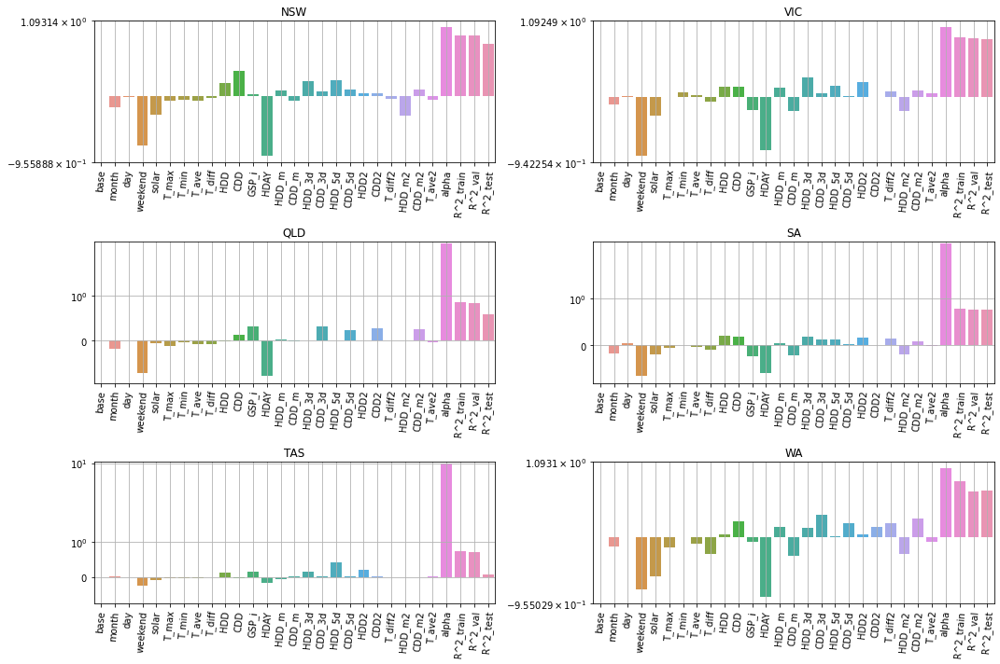

In [482]:
# using ridge regression
from sklearn.datasets import load_diabetes
from sklearn.linear_model import RidgeCV

df=matrix_ele_day

base_feature =['base','month', 'day','weekend', 'solar']

temp_feature = ['T_max', 'T_min',
 'T_ave', 'T_diff', 'HDD', 'CDD', 'GSP_i', 'HDAY',
 'HDD_m', 'CDD_m', 'HDD_3d', 'CDD_3d', 'HDD_5d', 'CDD_5d',
 'HDD2', 'CDD2', 'T_diff2', 'HDD_m2', 'CDD_m2', 'T_ave2']

temp_feature = ['T_HDAY','T_solar_PV','T_PV', 
                 'T_max','T_min','T_diff','T_ave2', 'T_diff2',
                 'T_HDD','T_CDD', 'T_HDD_m','T_HDD2','T_CDD_m','T_CDD2',
                 'T_HDD_5dexp_n','T_CDD_5dexp_n','T_HDD_5d', 'T_CDD_5d',]#'T_GSP_i', 


col_feature = base_feature+temp_feature

coef = pd.DataFrame(columns = col_feature)

cond_train = (df.date>'2014-06-30')&(df.date<='2018-06-30')
cond_val = (df.date>'2018-06-30')&(df.date<='2019-06-30')
cond_test = (df.date>'2019-06-30')&(df.date<='2020-10-30')
plt.figure(figsize=(15,10))

from sklearn.model_selection import TimeSeriesSplit
tscv = TimeSeriesSplit()


for i,state in enumerate(states):
    

    X_train_n,Y_train_n,X_val_n,Y_val_n,X_test_n,Y_test_n,_,_ = scale_data(state=state,df=df,base_feature = base_feature,
                                                                           cond_train=cond_train, cond_val=cond_val,cond_test=cond_test)

    clf_ridge = RidgeCV(alphas=[1e-2, 2.5e-2,5e-2,1e-1, 2.5e-1, 5e-1,1,2.5,5,10,15],store_cv_values=False,cv=None).fit(X_train_n, Y_train_n)

    coef.loc[state,col_feature] = clf_ridge.coef_.reshape([1,-1])
    coef.loc[state,'alpha'] = clf_ridge.alpha_.reshape([1,-1])
    coef.loc[state,'R^2_train'] = clf_ridge.score(X_train_n, Y_train_n)
    coef.loc[state,'R^2_val'] = clf_ridge.score(X_val_n, Y_val_n)
    coef.loc[state,'R^2_test'] = clf_ridge.score(X_test_n, Y_test_n)
    
    plt.subplot(3,2,i+1)
    sns.barplot(data = coef.loc[state,:].to_frame().T);
    plt.title(state)
    plt.xticks(rotation = 85);
    plt.yscale('symlog');
    plt.grid()
    
plt.tight_layout()

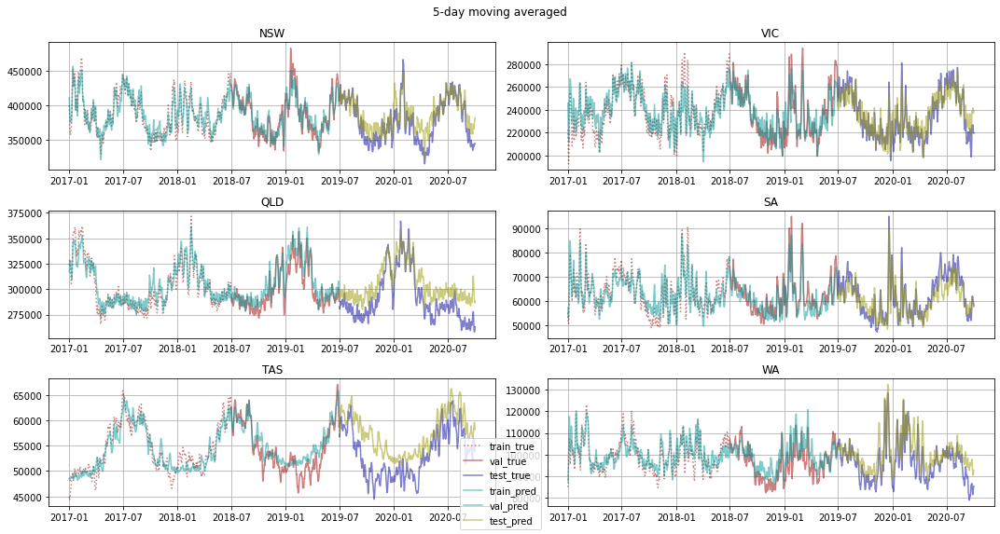

In [479]:
# plot the result
df=matrix_ele_day.copy()
df['year_month'] = df['date'].dt.to_period('M')
df['year_month'] = df['year_month'].dt.to_timestamp('s').dt.strftime('%Y-%m')

ind_train = df[cond_train].index
ind_val = df[cond_val].index  
ind_test = df[cond_test].index

cond_y=df.year>=2017

#plt.figure(figsize=(15,8))
fig, axes = plt.subplots(3,2,figsize=(15,8))

for i,state in enumerate(states):
    

    X_train_n,Y_train_n,X_val_n,Y_val_n,X_test_n,Y_test_n,_,scaler = scale_data(state=state,df=df,base_feature = base_feature,
                                                                                cond_train=cond_train,cond_val=cond_val,cond_test=cond_test)
    
    X_n = np.concatenate((np.concatenate((X_train_n,X_val_n)),X_test_n))

    clf_ridge = RidgeCV(alphas=[1,2.5,5,10],store_cv_values=False,cv=None).fit(X_train_n, Y_train_n)

#     coef.loc[state,col_feature] = clf_ridge.coef_.reshape([1,-1])
#     coef.loc[state,'alpha'] = clf_ridge.alpha_.reshape([1,-1])
#     coef.loc[state,'R^2_train'] = clf_ridge.score(X_train_n, Y_train_n)
#     coef.loc[state,'R^2_val'] = clf_ridge.score(X_val_n, Y_val_n)
#     coef.loc[state,'R^2_test'] = clf_ridge.score(X_test_n, Y_test_n)
    
    Y_train_pred = clf_ridge.predict(X_train_n)
    Y_val_pred = clf_ridge.predict(X_val_n)
    Y_test_pred = clf_ridge.predict(X_test_n)

    Y_true_n = np.append(np.append(Y_train_n,Y_val_n),Y_test_n)
    Y_pred_n = np.append(np.append(Y_train_pred,Y_val_pred),Y_test_pred)
    
    data_true_n = np.concatenate((X_n,Y_true_n.reshape(-1,1)),axis=1)
    data_pred_n = np.concatenate((X_n,Y_pred_n.reshape(-1,1)),axis=1)
    
    Y_true = scaler.inverse_transform(data_true_n)[:,-1]
    Y_pred = scaler.inverse_transform(data_pred_n)[:,-1]
    
    df.loc[ind_train[0]:,state+'_pred'] = Y_pred    
    
    df.loc[ind_train[0]:,state+'_5d'] = df.loc[ind_train[0]:,state].rolling(window=5).mean()
    df.loc[ind_train[0]:,state+'_pred_5d'] = df.loc[ind_train[0]:,state+'_pred'].rolling(window=5).mean()
     
        
    ax = plt.subplot(3,2,i+1)
    ax.plot(df[cond_y&cond_train].date,df[cond_y&cond_train][state+'_5d'],':',color=[0.6,0,0.0,0.5],label='train_true')
    ax.plot(df[cond_y&cond_val].date,df[cond_y&cond_val][state+'_5d'],'-',color=[0.6,0,0.0,0.5],label='val_true')
    ax.plot(df[cond_y&cond_test].date,df[cond_y&cond_test][state+'_5d'],'-',color=[0.0,0,0.6,0.5],label= 'test_true')
    ax.plot(df[cond_y&cond_train].date,df[cond_y&cond_train][state+'_pred_5d'],'-',color=[0.0,0.6,0.6,0.5],label='train_pred')
    ax.plot(df[cond_y&cond_val].date,df[cond_y&cond_val][state+'_pred_5d'],color=[0.0,0.6,0.6,0.5],label='val_pred')
    ax.plot(df[cond_y&cond_test].date,df[cond_y&cond_test][state+'_pred_5d'],color=[0.6,0.6,0,0.5],label='test_pred')
    #plt.plot(df[cond_val].date,df[cond_val][state],color=[0.0,0.6,0.6,0.5])
    #plt.plot(df[cond_test].date,df[cond_test][state],color=[0.6,0.6,0,0.5])
    
    #plt.legend(['train_true','val_true','test_true','train_pred','val_pred','test_pred'])
    handles, labels = ax.get_legend_handles_labels()
    plt.title(state)    
    #plt.xticks(rotation = 85);
    #plt.yscale('symlog');
    plt.grid()
    
fig.legend(handles, labels, loc='lower center')
plt.suptitle('5-day moving averaged')
plt.tight_layout()

We can have a clear look at the monthly change

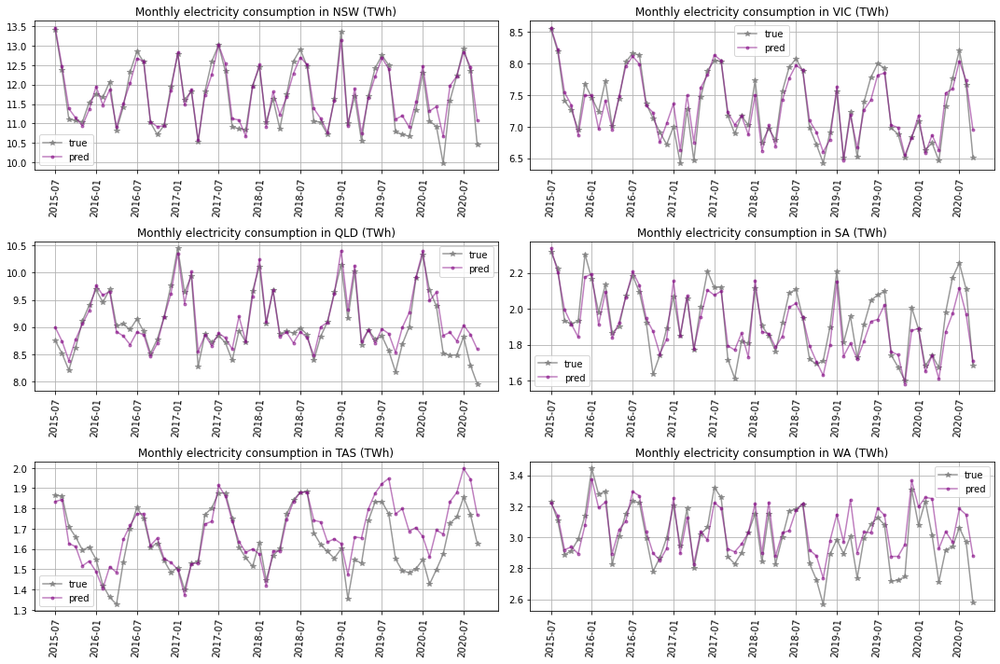

In [321]:
plt.figure(figsize=(15,10))

xticks = ['2015-07','2016-01','2016-07','2017-01','2017-07',
         '2018-01','2018-07','2019-01','2019-07','2020-01','2020-07']

for i,state in enumerate(states):
    
    cond = (df.date>='2015-07-01')&(df.date<'2020-10-01')
    df_month_true = df[cond].groupby('year_month')[[state]].sum().reset_index()
    df_month_pred = df[cond].groupby('year_month')[[state+'_pred']].sum().reset_index()
    #df = df.reset_index()
    
    plt.subplot(3,2,i+1);
    plt.plot(df_month_true['year_month'],df_month_true[state]/1e6,'*-',color=[0.5,0.5,0.5,0.8] );
    plt.plot(df_month_pred['year_month'],df_month_pred[state+'_pred']/1e6,'.-',color=[0.5,0.0,0.5,0.5] ) ; 
    plt.title('Monthly electricity consumption in '+state + ' (TWh)');
    plt.legend(['true','pred']);
    plt.xticks(xticks,rotation=85);
    plt.grid()
    
plt.tight_layout()

We put the change of GSP, electricity and HDD+CDD together.

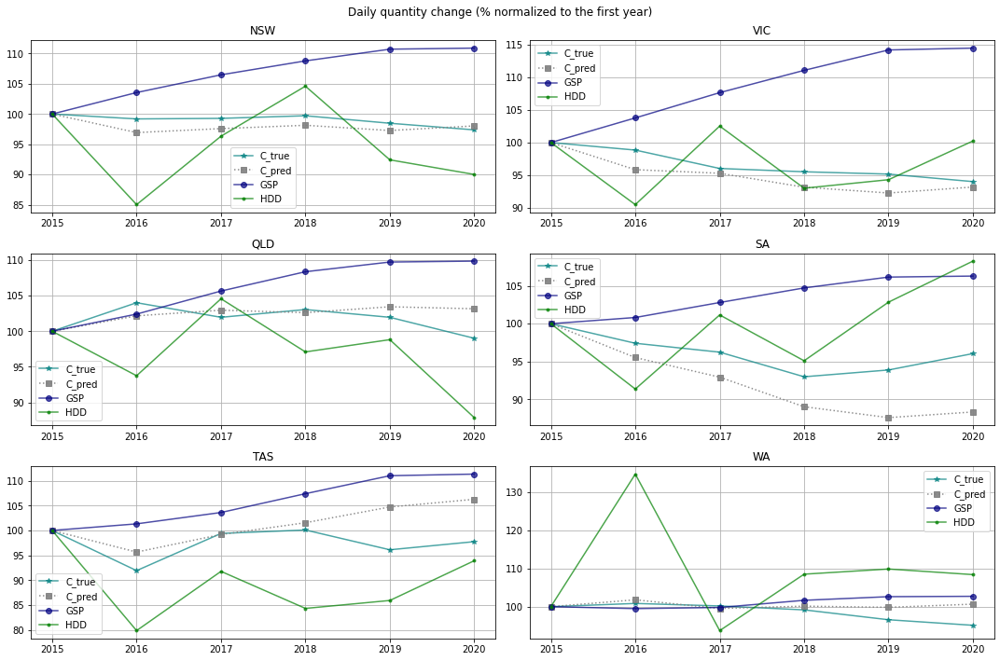

In [345]:
plt.figure(figsize=(15,10))

# xticks = ['2015-01','2015-07','2016-01','2016-07','2017-01','2017-07',
#          '2018-01','2018-07','2019-01','2019-07','2020-01','2020-07']

for i,state in enumerate(states):
    
    cond = (df.date>='2015-01-01')&(df.date<'2020-10-01')&(df.month<=10)&(df.month>=3)
    df_true = df[cond].groupby('year')[[state]].mean().reset_index()
    df_pred = df[cond].groupby('year')[[state+'_pred']].mean().reset_index()
    df_gsp = df[cond].groupby('year')[[state+'_GSP_i']].mean().reset_index()
    df_HDD = df[cond].groupby('year')[[state+'_HDD']].mean().reset_index()
    df_CDD = df[cond].groupby('year')[[state+'_CDD']].mean().fillna(1).reset_index()
    
    df[state+'_DD'] = df[state+'_HDD']+df[state+'_CDD']
    df_DD = df[cond].groupby('year')[[state+'_DD']].mean().fillna(1).reset_index()
    
    plt.subplot(3,2,i+1)
    plt.plot(df_true['year'],df_true[state]/df_true[state][0]*100,'*-',color=[0,0.5,0.5,0.7] ) 
    plt.plot(df_pred['year'],df_pred[state+'_pred']/df_pred[state+'_pred'][0]*100,'s:',color=[0.5,0.5,0.5,0.9] )
    plt.plot(df_gsp['year'],df_gsp[state+'_GSP_i']/df_gsp[state+'_GSP_i'][0]*100,'o-',color=[0.0,0.0,0.5,0.7] ) 
    #plt.plot(df_HDD['year'],df_HDD[state+'_HDD']/df_HDD[state+'_HDD'][0]*100,'.-',color=[0.5,0.0,0.0,0.7] )
    #plt.plot(df_CDD['year'],df_CDD[state+'_CDD']/df_CDD[state+'_CDD'][0]*100,'.-',color=[0.0,0.5,0.0,0.7] )
    plt.plot(df_DD['year'],df_DD[state+'_DD']/df_DD[state+'_DD'][0]*100,'.-',color=[0.0,0.5,0.0,0.7] )
    
    plt.suptitle('Daily quantity change (% normalized to the first year)')
    plt.title(state)
    plt.legend(['C_true','C_pred','GSP','HDD','CDD'])
    #plt.xticks(xticks,rotation=85)
    plt.grid()
    
plt.tight_layout()

2. Model with yearly varying parameters

In [145]:

def scale_data2(state,df,base_feature,state_feature,target,cond_train,cond_val,cond_test):
    
    from sklearn.preprocessing import RobustScaler
    
    #
    col_feature = base_feature.copy() #['base','month','day','weekend','solar']
    
    feature_n = []

    for x in state_feature:
        x = x.replace('T', state)
        feature_n.append(x)
    
    for x in feature_n:
        col_feature.append(x)
           
    for x in target:
        col_feature.append(x)
    
    
    #print(col_feature)
    #df[state] = 2 
    data_train = df[cond_train][col_feature]
   # [X_train,Y_train] = [data_train.iloc[:,:-1],data_train.iloc[:,-1]]

    data_val = df[cond_val][col_feature]
   # [X_val,Y_val] = [data_val.iloc[:,:-1],data_val.iloc[:,-1]]

    data_test = df[cond_test][col_feature]
   # [X_test,Y_test] = [data_test.iloc[:,:-1],data_test.iloc[:,-1]]

    # don't add centering to reflect the influence of base level change
    scaler = RobustScaler(with_centering = False) 

    scaler.fit(data_train)

    data_train_n = scaler.transform(data_train)
    [X_train_n,Y_train_n] = [data_train_n[:,:-len(target)],data_train_n[:,-len(target)]]

    data_val_n = scaler.transform(data_val)
    [X_val_n,Y_val_n] = [data_val_n[:,:-len(target)],data_val_n[:,-len(target)]]

    data_test_n = scaler.transform(data_test)
    [X_test_n,Y_test_n] = [data_test_n[:,:-len(target)],data_test_n[:,-len(target)]]
    
    return X_train_n,Y_train_n,X_val_n,Y_val_n,X_test_n,Y_test_n,col_feature[:-len(target)],scaler



Feature selection by removing highly correlated features

In [146]:
import scipy
import scipy.cluster.hierarchy as sch

def cluster_corr(corr_array, inplace=False):
    """
    Rearranges the correlation matrix, corr_array, so that groups of highly 
    correlated variables are next to eachother 
    
    Parameters
    ----------
    corr_array : pandas.DataFrame or numpy.ndarray
        a NxN correlation matrix 
        
    Returns
    -------
    pandas.DataFrame or numpy.ndarray
        a NxN correlation matrix with the columns and rows rearranged
    """
    pairwise_distances = sch.distance.pdist(corr_array)
    linkage = sch.linkage(pairwise_distances, method='complete')
    cluster_distance_threshold = pairwise_distances.max()/2
    idx_to_cluster_array = sch.fcluster(linkage, cluster_distance_threshold, 
                                        criterion='distance')
    idx = np.argsort(idx_to_cluster_array)
    
    if not inplace:
        corr_array = corr_array.copy()
    
    if isinstance(corr_array, pd.DataFrame):
        return corr_array.iloc[idx, :].T.iloc[idx, :]
    return corr_array[idx, :][:, idx]

In [1020]:
# define the base feature
df=matrix_ele_day.copy()

base_feature = ['weekend','solar','month','year']

state = 'QLD'

state_feature = []

for x in df.columns:
    if state in x:
        state_feature.append(x)

col_feature = base_feature + state_feature

cond = (df.date>='2014-07-01')&(df.date<'2019-07-01')

corr_df = df[cond][col_feature].corr() ;

# feature selection by the correlation
# re-order the columns accordin to the absolute value of correlation coefficients

col_corr = abs(corr_df[state]).sort_values(ascending=True).index

corr_df = df[col_corr].corr()


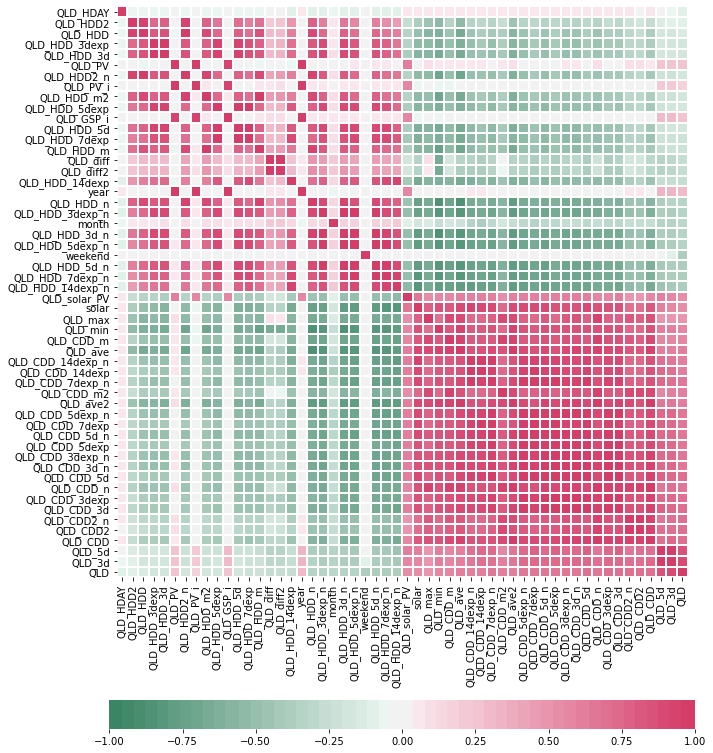

In [1021]:

plt.figure(figsize = (15,15))

ax=sns.heatmap(corr_df,vmin=-1, vmax=1, center=0,
            cmap=sns.diverging_palette(150,0, n=50),
            square=True,
            cbar_kws={'orientation':'horizontal','shrink':0.7},     
            linewidths = 1,
            linecolor = 'white',
            #annot=True,  
           # mask=mask_ut,
        );

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='center');


In [1022]:
drop_features = []

# threshold to define if the features are highly correlated
thre = 0.9

for i in np.arange(len(corr_df)):
    for j in np.arange(i+1,len(corr_df)):
        if corr_df.iloc[i,j]> thre:
            drop_features.append(corr_df.columns[j])
        
drop_features = list(dict.fromkeys(drop_features))
len(drop_features)
print(drop_features)


['QLD_HDD', 'QLD_HDD2_n', 'QLD_HDD_3d', 'QLD_HDD_5dexp', 'QLD_HDD_5d', 'QLD_HDD_3d_n', 'QLD_PV_i', 'QLD_GSP_i', 'year', 'QLD_HDD_m2', 'QLD_HDD_n', 'QLD_HDD_m', 'QLD_HDD_7dexp', 'QLD_HDD_5dexp_n', 'QLD_HDD_5d_n', 'QLD_HDD_7dexp_n', 'QLD_diff2', 'QLD_HDD_14dexp_n', 'QLD_CDD_14dexp_n', 'QLD_CDD_m', 'QLD_ave', 'QLD_CDD_m2', 'QLD_ave2', 'QLD_CDD_n', 'QLD_CDD', 'QLD_CDD_5d_n', 'QLD_CDD_3dexp_n', 'QLD_CDD_3d_n', 'QLD_CDD_14dexp', 'QLD_CDD_7dexp_n', 'QLD_CDD_5dexp_n', 'QLD_CDD_7dexp', 'QLD_CDD_5dexp', 'QLD_CDD_5d', 'QLD_CDD_3d', 'QLD_CDD_3dexp', 'QLD_CDD2_n', 'QLD_CDD2', 'QLD_3d', 'QLD']


In [1023]:
corr_df.columns.drop(drop_features)

Index(['QLD_HDAY', 'QLD_HDD2', 'QLD_HDD_3dexp', 'QLD_PV', 'QLD_diff',
       'QLD_HDD_14dexp', 'QLD_HDD_3dexp_n', 'month', 'weekend', 'QLD_solar_PV',
       'solar', 'QLD_max', 'QLD_min', 'QLD_5d'],
      dtype='object')

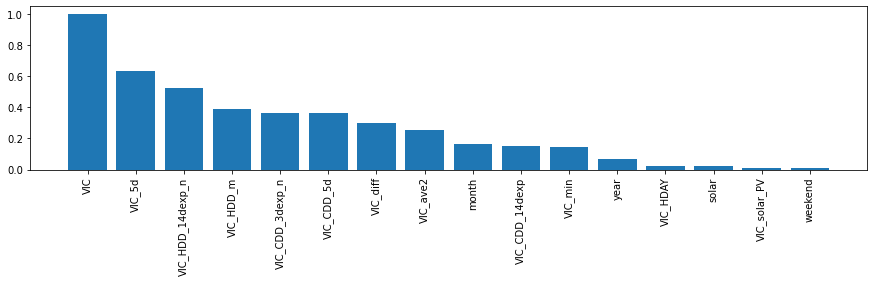

In [1019]:
corr_df_filter = df[cond][col_feature].drop(drop_features, axis=1).corr()
plt.figure(figsize=(15,3))
plt.bar(corr_df_filter[state].sort_values(ascending= False).index,abs(corr_df_filter[state]).sort_values(ascending= False)) ;
plt.xticks(rotation = 90);

In [147]:
def select_feature(df,state,threshold):
    
    state_feature = []

    for x in df.columns:
        if state in x:
            state_feature.append(x)
 
    cond = (df.date>='2014-07-01')&(df.date<'2019-07-01')

    corr_df = df[cond][state_feature].corr() ;

    # feature selection by the correlation
    # re-order the columns accordin to the absolute value of correlation coefficients

    col_corr = abs(corr_df[state]).sort_values(ascending=True).index

    corr_df = df[col_corr].corr()
    
    # drop highly correlated features
    
    drop_features = []

    # threshold to define if the features are highly correlated
    thre = 0.9

    for i in np.arange(len(corr_df)):
        for j in np.arange(i+1,len(corr_df)):
            if corr_df.iloc[i,j]> threshold:
                drop_features.append(corr_df.columns[j])

    drop_features = list(dict.fromkeys(drop_features))
    
    state_feature_filter = corr_df.columns.drop(drop_features)
    
    for x in state_feature_filter:
        if x in [state, state+'_3d',state+'_5d']:
            state_feature_filter = state_feature_filter.drop(x)
            
    
    return state_feature_filter.to_list() 

In [151]:
#from sklearn.metrics import mean_absolute_percentage_error

def mean_absolute_percentage_error(y_true, y_pred):
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    return mape

In [236]:
# using ridge regression
from sklearn.datasets import load_diabetes
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV

df=matrix_ele_day.copy()

# define the base feature
base_feature = ['weekend','solar','month']

# define the state feature 
state_feature = ['T_GSP_i', 'T_PV_i', 'T_max', 'T_HDD', 'T_CDD', 'T_HDAY',
 'T_HDD_m', 'T_CDD_m', 'T_HDD_5d', 'T_CDD_5d',
 'T_HDD2', 'T_CDD2', 'T_HDD_m2', 'T_CDD_m2',]#'T_PV_i','T_solar_PV''T_solar_PV','T_min', 'T_ave', 

# state_feature = ['T_GSP_i', 'T_PV_i','T_solar_PV', 
#   'T_HDD', 'T_CDD', 'T_HDAY',
#  'T_HDD_m', 'T_CDD_m', 'T_HDD_5d', 'T_CDD_5d',
#  'T_HDD2', 'T_CDD2',  'T_HDD_m2', 'T_CDD_m2', ]#

state_feature = ['T_HDAY','T_solar_PV','T_PV', 'T_GSP_i', 
                 'T_max','T_min','T_max2','T_min2','T_ave','T_ave2','T_diff', 'T_diff2',
                 'T_HDD','T_HDD2','T_CDD','T_CDD2','T_HDD_m','T_CDD_m','T_HDD_m2','T_CDD_m2',
                 'T_HDD_5dexp_n','T_CDD_5dexp_n','T_HDD_5d', 'T_CDD_5d','T_ave_15d', 'T_ave_15d']#'T_HDD_14dexp_n','T_CDD_14dexp_n'

 
# define the target feature

target_feature = ['']

 
col_feature = base_feature + state_feature

coef = pd.DataFrame(columns = col_feature)
result = pd.DataFrame()

cond_norm = (df.date>'2015-06-30')&(df.date<='2019-06-30')
cond_precovid = (df.date>'2019-06-30')&(df.date<='2020-01-01')
cond_covid = (df.date>'2020-01-01')&(df.date<='2020-10-10')

# index range of data to use as reference for normalization
ind_norm = df[cond_norm].index
 

from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import LeaveOneOut
loocv=LeaveOneOut()
tscv = TimeSeriesSplit(n_splits=4)
flag_filter = 0
threshold = 0.8


for i,state in enumerate(states):
    
     
    target = [state+target_feature[i] for i in range(len(target_feature))]
    
    # if we choose to filter the state feature via correlation analysis 
    if flag_filter ==1:
        state_feature = []
        state_feature0 = select_feature(df,state,threshold=threshold)
        
        for x in state_feature0:
            x_n = x.replace(state,'T')
            state_feature.append(x_n)
            
        col_feature = base_feature + state_feature
         
    X_train_n,Y_train_n,X_val_n,Y_val_n,X_test_n,Y_test_n,col_f,scaler\
    = scale_data2(state=state,df=df,base_feature = base_feature, state_feature = state_feature,
                  target = target,cond_train=cond_norm,cond_val=cond_precovid,cond_test=cond_covid)
    
    #print(col_f)
    X_n = np.concatenate((np.concatenate((X_train_n,X_val_n)),X_test_n))
    Y_true_n = np.append(np.append(Y_train_n,Y_val_n),Y_test_n)
    Y_pred_n = []
    
    
    for j,year in enumerate(np.arange(2018,2019)):
        
        cond_train = (df.date>str(year-3)+'-06-30')&(df.date<=str(year+1)+'-06-30')
        cond_val = cond_train #(df.date>str(year+1)+'-06-30')&(df.date<=str(year+2)+'-06-30')
        cond_test = (df.date>=str(year+1)+'-06-30')&(df.date<=str(year+2)+'-06-30')
        if year == 2018:
            cond_train = (df.date>str(year-3)+'-06-30')&(df.date<=str(year+2)+'-01-01')
            cond_test = (df.date>str(year+2)+'-01-01')&(df.date<=str(year+2)+'-10-10')
            
        
        ind_train = df[cond_train].index
        ind_val = df[cond_val].index
        ind_test = df[cond_test].index
        
        x_train_n = X_n[ind_train-ind_norm[0],:]
        y_train_n = Y_true_n[ind_train-ind_norm[0]]
        
        x_test_n = X_n[ind_test-ind_norm[0],:]
        y_test_n = Y_true_n[ind_test-ind_norm[0]]
    

        clf_ridge = RidgeCV(alphas=[1e-2,2.5e-2,5e-2,1e-1, 2.5e-1, 5e-1,1,2.5,5,7,10,12.5,15,20,25], cv=tscv,scoring = 'r2').fit(x_train_n, y_train_n);
        #clf_ridge = LassoCV(alphas=[2.5e-4, 5e-4,1e-3, 2.5e-3, 5e-3,1e-2, 2.5e-2, 5e-2, 1e-1, 2.5e-1,5e-1],cv=tscv,max_iter=100000).fit(x_train_n, y_train_n);
        
        y_train_pred = clf_ridge.predict(x_train_n)
        y_test_pred = clf_ridge.predict(x_test_n)
        
        
        coef.loc[j+i*6,'year'] = year
        coef.loc[j+i*6,'state'] = state
        
        for k,col in enumerate(col_feature):
            coef.loc[j+i*6,col] = clf_ridge.coef_[k]  #.reshape([1,-1])
            
        result.loc[j+i*6,'intercept'] = clf_ridge.intercept_
        result.loc[j+i*6,'alpha'] = clf_ridge.alpha_#.reshape([1,-1])
        result.loc[j+i*6,'R^2_train'] = clf_ridge.score(x_train_n, y_train_n)        
        result.loc[j+i*6,'R^2_test'] = clf_ridge.score(x_test_n, y_test_n)        
        result.loc[j+i*6,'MAPE_train'] = mean_absolute_percentage_error(y_train_n, y_train_pred)        
        result.loc[j+i*6,'MAPE_test'] = mean_absolute_percentage_error(y_test_n, y_test_pred)
        

        #Y_true_n = np.append(np.append(Y_train_n,Y_val_n),Y_test_n)
        if j == 0:
            Y_pred_n = np.append(np.append(Y_pred_n,y_train_pred),y_test_pred )
            
        else:
            Y_pred_n = np.append(Y_pred_n,y_test_pred)
            

    data_true_n = np.concatenate((X_n,Y_true_n.reshape(-1,1)),axis=1)
    data_pred_n = np.concatenate((X_n,Y_pred_n.reshape(-1,1)),axis=1)

    Y_true = scaler.inverse_transform(data_true_n)[:,-1]
    Y_pred = scaler.inverse_transform(data_pred_n)[:,-1]

    df.loc[ind_norm[0]:,target[0]+'_pred'] = Y_pred
    df.loc[ind_norm[0]:,target[0]+'_pred/true'] = df.loc[ind_norm[0]:,target[0]+'_pred']/df.loc[ind_norm[0]:,target[0]]

    df.loc[ind_norm[0]:,target[0]+'_5d'] = df.loc[ind_norm[0]:,target[0]].rolling(window=5).mean()
    df.loc[ind_norm[0]:,target[0]+'_pred_5d'] = df.loc[ind_norm[0]:,target[0]+'_pred'].rolling(window=5).mean()

coef = pd.concat([coef,result],axis=1)

In [165]:
coef

,weekend,solar,month,T_HDAY,T_solar_PV,T_PV,T_GSP_i,T_max,T_min,T_max2,T_min2,T_ave,T_ave2,T_diff,T_diff2,T_HDD,T_HDD2,T_CDD,T_CDD2,T_HDD_m,T_CDD_m,T_HDD_m2,T_CDD_m2,T_HDD_5dexp_n,T_CDD_5dexp_n,T_HDD_5d,T_CDD_5d,T_ave_15d,T_ave_15d,year,state,intercept,alpha,R^2_train,R^2_test,MAPE_train,MAPE_test
0,-0.688817,-0.170714,-0.14707,-0.739854,-0.0974833,-0.0519428,0.0773122,-0.0793314,0.00101025,0.0409089,-0.112647,-0.0369735,-0.019626,-0.105648,0.00827317,0.226278,0.0542045,0.38122,0.0688929,0.0568828,0.0316108,-0.189565,0.00941237,0.0305532,-0.0965535,0.406848,0.266797,0.0188991,0.0188991,2018.0,NSW,6.672785,5.0,0.883825,0.844642,2.481175,3.178909
6,-0.726597,-0.141534,-0.104129,-0.558293,-0.116271,0.0655241,-0.174027,-0.0643874,0.0146035,0.0117295,-0.0712764,-0.0334133,-0.0159455,-0.108564,0.0386561,0.0983609,0.169986,0.185052,0.005479,-0.0108943,-0.0548422,-0.0705886,0.0753133,0.127215,-0.0136965,0.179473,0.0764717,-0.0166537,-0.0166537,2018.0,VIC,8.848897,20.0,0.848627,0.795521,3.461083,4.282085
12,-0.688086,-0.0390484,-0.13769,-0.64895,-0.0614279,-0.101099,0.173393,-0.103515,-0.00505518,0.0170127,-0.0321556,-0.0482369,-0.0061453,-0.13254,0.0256546,0.0427769,0.000225968,0.167345,0.36435,0.0124545,-0.0858989,-0.00150549,0.240748,0.0189419,0.0710765,0.0259784,0.236233,0.121516,0.121516,2018.0,QLD,7.173287,12.5,0.890705,0.864806,2.009832,2.785532
18,-0.558596,-0.121539,-0.204321,-0.389937,-0.100083,0.0340169,-0.253757,-0.0667696,0.0068624,-0.00300519,-0.0403328,-0.0401539,-0.0266816,-0.101098,0.0864619,0.154218,0.153092,0.20542,0.0235045,0.0268326,-0.108075,-0.130466,0.10343,0.110491,0.031069,0.147801,0.110753,0.0332385,0.0332385,2018.0,SA,11.909527,25.0,0.790307,0.785479,6.031721,6.096957
24,-0.229815,0.111225,-0.0579357,-0.125244,-0.14054,-0.0983336,0.20063,-0.00498597,-0.0388648,0.0175526,-0.000471186,-0.0216105,0.024461,0.0486918,-0.111425,0.098178,0.232838,-0.00676257,-0.00223859,-0.0436035,0.00197432,0.0336123,0.00166457,0.151671,0.01163,0.187903,0.00494508,-0.148444,-0.148444,2018.0,TAS,4.278045,25.0,0.697734,0.745853,4.365878,3.732820
30,-0.70066,-0.34184,-0.0603089,-0.681033,-0.374095,0.0155037,-0.0438914,-0.160473,-0.000900325,-0.049039,-0.0413691,-0.101703,-0.0777357,-0.256237,0.183252,0.0868814,0.0431367,0.308531,0.148133,0.178955,-0.118286,-0.237715,0.226914,0.0887013,0.140749,0.123661,0.263239,0.146135,0.146135,2018.0,WA,10.343032,7.0,0.833225,0.727635,3.249263,4.741655


In [228]:
    
cond = (df.date>='2017-07-01')&(df.date<'2020-10-20')

plt.figure(figsize = (10,8))

for i,state in enumerate(states):
    
    #cond_dd = df[state+'_HDD'] + df[state+'_CDD']== 0 
    
    target = [state+target_feature[i] for i in range(len(target_feature))]
    
    ax = plt.subplot(3,2,i+1)
    plt.plot(df[cond].date,df[cond][target[0]],color=[0.0,0.6,0.6,0.6],label = 'true')
    plt.plot(df[cond].date,df[cond][target[0]+'_pred'],':',color=[0.6,0.0,0.6,0.6],label = 'pred')
    
#     plt.plot(df[cond&cond_dd].date,df[cond&cond_dd][state],':',color=[0.6,0.0,0.6,0.6],label = 'true_noDD')
#     plt.plot(df[cond&cond_dd].date,df[cond&cond_dd][state+'_pred'],':',color=[0.6,0.0,0.6,0.6],label = 'pred_noDD')
    #sns.distplot(df[cond][state+'_pred/true'],rug = True,kde=True)    
     
    mape = mean_absolute_percentage_error(df[cond][target[0]],df[cond][target[0]+'_pred'])
    #mape_noDD = mean_absolute_percentage_error(df[cond&cond_dd][target[0]],df[cond&cond_dd][target[0]+'_pred'])
    
    plt.title(state)
    plt.text(0.05,0.85,s='MAPE = '+str(round(mape,2))+'%',horizontalalignment='left',transform=ax.transAxes)
    #plt.text(0.05,0.90,s='MAPE_noDD = '+str(round(mape_noDD,2))+'%',horizontalalignment='left',transform=ax.transAxes)
    plt.xticks(rotation = 85)
    plt.legend(frameon = False)
    
plt.suptitle('Daily electricity demands, true vs prediction (MWh)',fontsize=15)
    
plt.tight_layout()
plt.savefig('electricity_linear_regression2.png')

<Figure size 900x600 with 0 Axes>

In [237]:
df['month_day'] = df['month'].astype(str).str.zfill(2) +'-' + df['day'].astype(str).str.zfill(2)
df['month_day'] = pd.to_datetime(df['month_day'],format='%m-%d', errors='ignore')

In [229]:
fig, axes = plt.subplots(3,2,figsize=(10,10))

df['month_day'] = df['month'].astype(str).str.zfill(2) +'-' + df['day'].astype(str).str.zfill(2)
df['month_day'] = pd.to_datetime(df['month_day'],format='%m-%d', errors='ignore')

xticks = ['01-01','02-01','03-01','04-01','05-01','06-01','07-01','08-01','09-01','10-01','11-01','12-01']
 
for i,state in enumerate(states):
    
    
    cond1 = (df.date>='2016-01-01')&(df.date<'2020-01-01')
    cond2 = (df.date>='2020-01-01')&(df.date<'2020-10-10')
    df.loc[:,state+'_10d'] = df.loc[:,state].rolling(window=10).mean()
    df.loc[:,state+'_10d_pred'] = df.loc[:,state+'_pred'].rolling(window=10).mean()
   
    df.loc[:,state+'_10d_pred/true'] = (df.loc[:,state+'_10d']/df.loc[:,state+'_10d_pred'])*100-100 
    
    plt.subplot(3,2,i+1)
 
    #plt.plot(df[cond2]['month_day'], 100*(df[cond2][state+'_10d_pred'] - df[cond2][state+'_10d'])/df[cond2][state+'_10d'])
    
    sns.lineplot(data = df[cond2], x='month_day', y = state+'_10d_pred/true')
    #plt.plot(df[cond2]['month_day'], df[cond2][state+'_10d_pred'])
    sns.lineplot(data = df[cond1], x='month_day', y = state+'_10d_pred/true')
    plt.axhline(y=0,color=[0.7,0.7,0.7,0.7],ls=":")
#     plt.plot(df2[cond2]['month_day'], df2[cond2][state+'_10d'])
#     plt.plot(df2[cond2]['month_day'], df2[cond2][state+'_10d_pred'])
#     plt.plot(df2[cond1]['month_day'], df2[cond1][state+'_10d'])
    
    plt.xticks(xticks,rotation=85)
    plt.ylabel('Relative difference (%)')
    
    plt.title(state)
    
    plt.grid(axis='x')
plt.suptitle('10-day rolling mean electricity demands, true vs prediction (%) \n',fontsize = 15)    
fig.legend(['2020','2016-2019'],frameon=False,loc='upper left')
plt.tight_layout()
plt.savefig('electricity_true_vs_pred1.png')

In [230]:
df['year_month'] = df['date'].dt.to_period('M')
df['year_month'] = df['year_month'].dt.to_timestamp('s').dt.strftime('%Y-%m')

plt.figure(figsize=(15,8))

xticks = ['2014-07','2015-01','2015-07','2016-01','2016-07','2017-01','2017-07',
       '2018-01','2018-07','2019-01','2019-07','2020-01','2020-07']

xticks = ['2017-07','2017-10','2018-01','2018-04','2018-07','2018-10','2019-01','2019-04','2019-07',
          '2019-10','2020-01','2020-04','2020-07','2020-10',]


cond = (df.date>='2017-07-01')&(df.date<'2020-10-20')

for i,state in enumerate(states):
    
    
    df_month_true = df[cond].groupby('year_month')[[state]].sum().reset_index()
    df_month_pred = df[cond].groupby('year_month')[[state+'_pred']].sum().reset_index()
    #df = df.reset_index()
    
    plt.subplot(3,2,i+1);
    plt.plot(df_month_true['year_month'],df_month_pred[state+'_pred']/df_month_true[state],'*-',color=[0.1+0.1*i,0.5-0.1*i,0.5,0.8] );
    #plt.plot(df_month_pred['year_month'],df_month_pred[state+'_pred']/1e6,'.-',color=[0.5,0.0,0.5,0.5] ) ; 
    #plt.title('Monthly electricity consumption in '+state + ' (TWh)');
    #sns.distplot(df_month_pred[state+'_pred']/df_month_true[state],label='pred/true')
    plt.legend(['pred/true','pred']);
    plt.xticks(xticks,rotation=85);
    plt.title(state)
    plt.grid()
    
plt.tight_layout()

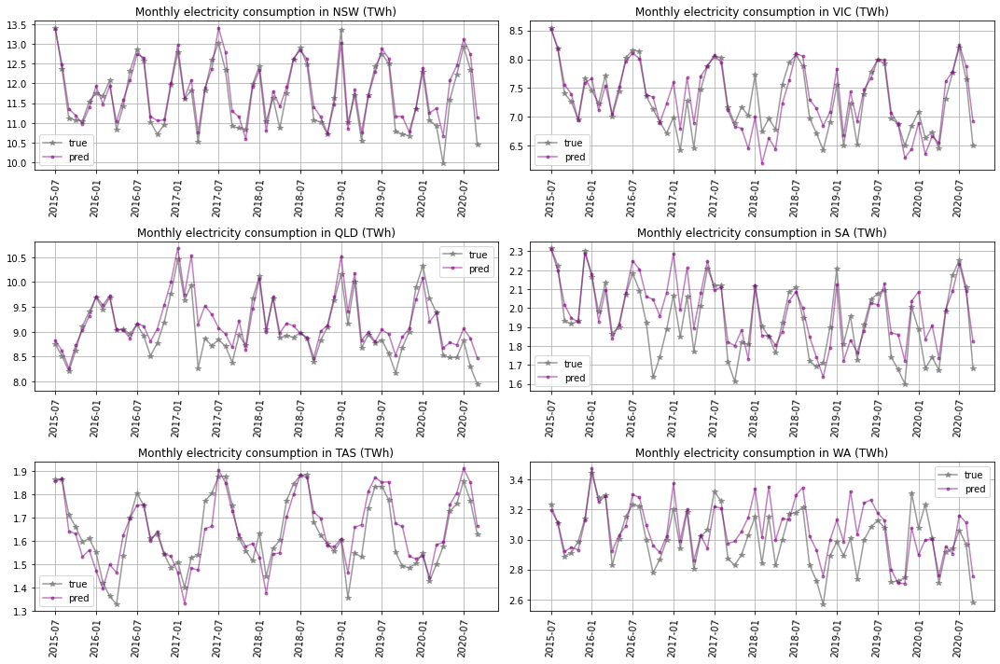

In [1100]:
plt.figure(figsize=(15,10))

xticks = ['2015-07','2016-01','2016-07','2017-01','2017-07',
         '2018-01','2018-07','2019-01','2019-07','2020-01','2020-07']

for i,state in enumerate(states):
    
    cond = (df.date>='2015-07-01')&(df.date<'2020-10-01')
    df_month_true = df[cond].groupby('year_month')[[state]].sum().reset_index()
    df_month_pred = df[cond].groupby('year_month')[[state+'_pred']].sum().reset_index()
    #df = df.reset_index()
    
    plt.subplot(3,2,i+1);
    plt.plot(df_month_true['year_month'],df_month_true[state]/1e6,'*-',color=[0.5,0.5,0.5,0.8] );
    plt.plot(df_month_pred['year_month'],df_month_pred[state+'_pred']/1e6,'.-',color=[0.5,0.0,0.5,0.5] ) ; 
    plt.title('Monthly electricity consumption in '+state + ' (TWh)');
    plt.legend(['true','pred']);
    plt.xticks(xticks,rotation=85);
    plt.grid()
    
plt.tight_layout()

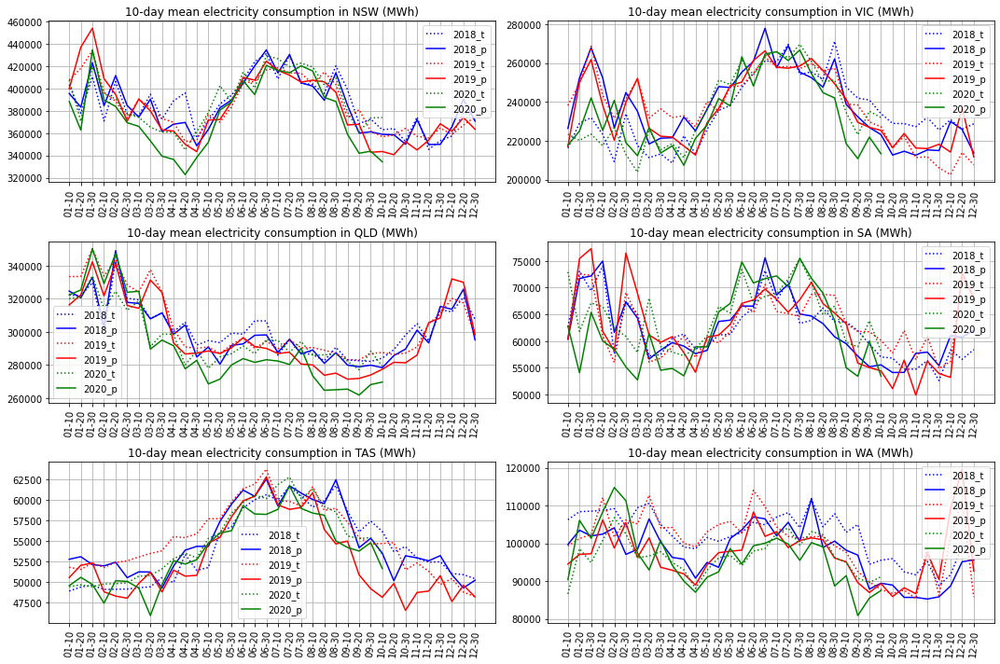

In [1101]:
plt.figure(figsize=(15,10))


for i,state in enumerate(states):
    
    cond = (df.date>='2014-01-01')&(df.date<='2020-10-09')
    df_10day = df[cond].groupby(['year','month','EML_of_month'])[[state,state+'_pred','solar']].mean().reset_index()
    
    #df_10day[state] = df[state]
    df_10day['month_EML'] = df_10day['month'].astype(str).str.zfill(2)+'-'+df_10day['EML_of_month'].astype(str)
    #df['month_EML'] = pd.to_datetime(df['month_EML'],format='%m-%d', errors='ignore')
    df_10day = df_10day.reset_index()
    
    plt.subplot(3,2,i+1)
    #sns.lineplot(data=df_10day[(df_10day.year>=2017)&(df_10day.year<=2019)],x='month_EML',y=state)
#     sns.lineplot(data=df_10day[(df_10day.year==2019)],x='month_EML',y=state)
#     sns.lineplot(data=df_10day[(df_10day.year==2019)],x='month_EML',y=state+'_pred')
#     sns.lineplot(data=df_10day[(df_10day.year==2020)],x='month_EML',y=state)
#     sns.lineplot(data=df_10day[(df_10day.year==2020)],x='month_EML',y=state+'_pred')
    plt.plot(df_10day[(df_10day.year==2018)]['month_EML'],df_10day[(df_10day.year==2018)][state+'_pred'],':b')
    plt.plot(df_10day[(df_10day.year==2018)]['month_EML'],df_10day[(df_10day.year==2018)][state],'b')
    plt.plot(df_10day[(df_10day.year==2019)]['month_EML'],df_10day[(df_10day.year==2019)][state+'_pred'],':r')
    plt.plot(df_10day[(df_10day.year==2019)]['month_EML'],df_10day[(df_10day.year==2019)][state],'r')
    plt.plot(df_10day[(df_10day.year==2020)]['month_EML'],df_10day[(df_10day.year==2020)][state+'_pred'],':g')
    plt.plot(df_10day[(df_10day.year==2020)]['month_EML'],df_10day[(df_10day.year==2020)][state],'g')
    #plt.plot(df_10day[(df_10day.year==2019)]['month_EML'],df_10day[(df_10day.year==2019)]['solar'] )
    
    plt.xticks(rotation=85)
    #plt.legend(['2017-2019','2019','2020','2020_pred'])
    #plt.legend(['2019','2019_pred','2020','2020_pred'])
    plt.legend(['2018_t','2018_p','2019_t','2019_p','2020_t','2020_p'])
    plt.title('10-day mean electricity consumption in '+state+' (MWh)')
    plt.grid()
    
plt.tight_layout()

We put the change of GSP, electricity and HDD+CDD together.

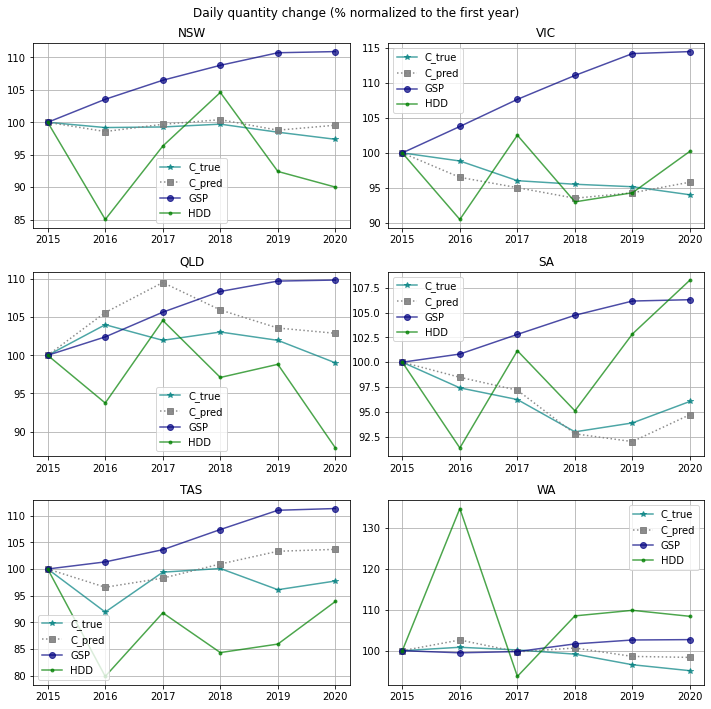

In [552]:
plt.figure(figsize=(15,10))

# xticks = ['2015-01','2015-07','2016-01','2016-07','2017-01','2017-07',
#          '2018-01','2018-07','2019-01','2019-07','2020-01','2020-07']

for i,state in enumerate(states):
    
    cond = (df.date>='2015-01-01')&(df.date<'2020-10-01')&(df.month<=10)&(df.month>=3)
    df_true = df[cond].groupby('month')[[state]].mean().reset_index()
    df_pred = df[cond].groupby('month')[[state+'_pred']].mean().reset_index()
    df_gsp = df[cond].groupby('month')[[state+'_GSP_i']].mean().reset_index()
    df_HDD = df[cond].groupby('month')[[state+'_HDD']].mean().reset_index()
    df_CDD = df[cond].groupby('month')[[state+'_CDD']].mean().fillna(1).reset_index()
    
    df[state+'_DD'] = df[state+'_HDD']+df[state+'_CDD']
    df_DD = df[cond].groupby('month')[[state+'_DD']].mean().fillna(1).reset_index()
    
    plt.subplot(3,2,i+1)
    plt.plot(df_true['month'],df_true[state]/df_true[state][0]*100,'*-',color=[0,0.5,0.5,0.7] ) 
    plt.plot(df_pred['month'],df_pred[state+'_pred']/df_pred[state+'_pred'][0]*100,'s:',color=[0.5,0.5,0.5,0.9] )
    plt.plot(df_gsp['month'],df_gsp[state+'_GSP_i']/df_gsp[state+'_GSP_i'][0]*100,'o-',color=[0.0,0.0,0.5,0.7] ) 
    #plt.plot(df_HDD['year'],df_HDD[state+'_HDD']/df_HDD[state+'_HDD'][0]*100,'.-',color=[0.5,0.0,0.0,0.7] )
    #plt.plot(df_CDD['year'],df_CDD[state+'_CDD']/df_CDD[state+'_CDD'][0]*100,'.-',color=[0.0,0.5,0.0,0.7] )
    plt.plot(df_DD['year'],df_DD[state+'_DD']/df_DD[state+'_DD'][0]*100,'.-',color=[0.0,0.5,0.0,0.7] )
    
    plt.suptitle('Daily quantity change (% normalized to the first year)')
    plt.title(state)
    plt.legend(['C_true','C_pred','GSP','HDD','CDD'])
    #plt.xticks(xticks,rotation=85)
    plt.grid()
    
plt.tight_layout()

3. Catboost


In [186]:
import catboost
from catboost import CatBoostRegressor

In [187]:
def build_cat(loss_function='RMSE',eval_metric = 'R2',od_wait=20,random_seed=42):
    
    #from catboost import CatBoostClassifier

    """
    This function define the parameters for catboost training
    loss_function is the metric used to optimize the model, while eval_metric is the metric used for overfitting detection,
    od_wait is the number of interation to wait for overfitting stop, od_type is thetype of the overfitting detector to use.
    """
    catb = CatBoostRegressor(loss_function=loss_function,eval_metric = eval_metric,
                              od_wait=od_wait,od_type='Iter',random_seed=random_seed)
    
    return catb

In [188]:
# this is a fuction to define the catboost traning and evaluation

def train_cat(model=None,grid_para=None,cv=None,verbose=False,train_data=None,val_data=None,test_data=None,cat_features_index=None,
              loss_function='RMSE',eval_metric = 'R2',plot_progress = False,retrain_best = True):
    
    from sklearn.model_selection import GridSearchCV
    from sklearn.metrics import r2_score
    from sklearn.metrics import mean_squared_error
    
    X_train, y_train = train_data[0],train_data[1]
    X_val, y_val = val_data[0],val_data[1]
    X_test, y_test = test_data[0],test_data[1]
    
    #X_test, y_test = test_data[0],test_data[1]
    
    # get the column index of categorical features in the X_train
    #cat_features_index = np.where(np.in1d(X_train.columns.values,col_category))[0]

    """Instead of using the GridSearchCV for finding the best hyperparameters, we only use it for cross-validation,but keep
    all the results, including the hyperparameters and the metrics of the model in train, validation and test sets.
     """
    
    # pay attention, * is used before the list to unpack the list into multiple argument for function
    # https://stackoverflow.com/questions/36901/what-does-double-star-asterisk-and-star-asterisk-do-for-parameters
    
    cases = list(product(*list(grid_para.values())[0:]))  

    cases = pd.DataFrame(columns = grid_para.keys(), data = cases)
    
    for row in cases.itertuples():
        
        print(row)
        idx = row.Index
        
        """
        row_bracket generate a dictionary of the form {key_A: [value_A],key_B: [value_B], ...  }
        which is required for the GridSearchCV param input 
        """
        
        row_bracket = list(map(lambda x: [x], row[1:]))
        param = dict(zip(grid_para.keys(),row_bracket))
        #print(param)

        catb_grid = GridSearchCV(model, param, cv = cv,n_jobs = 1,refit = True)    

        catb_grid.fit(X_train, y_train,
                eval_set=[(X_val, y_val)],
                cat_features= cat_features_index,
                verbose=verbose          
                 )
     
        cases.loc[idx,eval_metric+'_train'] = catb_grid.best_estimator_.get_best_score()['learn'][eval_metric]
        cases.loc[idx,loss_function+'_train'] =catb_grid.best_estimator_.get_best_score()['learn'][loss_function]
        cases.loc[idx,eval_metric+'_val'] =catb_grid.best_estimator_.get_best_score()['validation'][eval_metric]
        cases.loc[idx,loss_function+'_val'] =catb_grid.best_estimator_.get_best_score()['validation'][loss_function]
        
        train_metric = catb_grid.best_estimator_.get_evals_result()['learn'][eval_metric]
        train_loss = catb_grid.best_estimator_.get_evals_result()['learn'][loss_function]
        val_metric = catb_grid.best_estimator_.get_evals_result()['validation'][eval_metric]
        val_loss = catb_grid.best_estimator_.get_evals_result()['validation'][loss_function]

    
        if plot_progress == True:

            plot_train_progress(param,loss_function,train_loss,val_loss,eval_metric,train_metric,val_metric)
            
            
    # retrain the best parameters
    
    best_index = cases[eval_metric+'_val'].argmax()
    best_para = cases.loc[best_index,grid_para.keys()]
    row_bracket = list(map(lambda x: [x], best_para.to_dict().values()))
    param = dict(zip(grid_para.keys(),row_bracket))

    print('best parameters:',param)
    
        
    if retrain_best == True:
        
        catb_grid = GridSearchCV(model, param, cv = cv, n_jobs = 1,refit = True)    

        catb_grid.fit(X_train, y_train,
                eval_set=[(X_val, y_val)],
                cat_features= cat_features_index,
                verbose=verbose          
                 )

        train_metric = catb_grid.best_estimator_.get_evals_result()['learn'][eval_metric]
        train_loss = catb_grid.best_estimator_.get_evals_result()['learn'][loss_function]
        val_metric = catb_grid.best_estimator_.get_evals_result()['validation'][eval_metric]
        val_loss = catb_grid.best_estimator_.get_evals_result()['validation'][loss_function]

        plot_train_progress(param,loss_function,train_loss,val_loss,eval_metric,train_metric,val_metric)         

    return cases, best_para, catb_grid

In [189]:
def plot_train_progress(param,loss_function,train_loss,val_loss,eval_metric,train_metric,val_metric):
    
    """This function plot the trainning progress of the model,
    loss_function is the name of the loss function for training optimization
    train_loss and val_loss are the loss obtained for train and validation sets during the trainning
    eval_metric is the name of the evaludation metric for early stopping and model evaludation
    train_metric and val_metric are the evaludation metric for train and validation sets"""
    
    fig, ax1 = plt.subplots()

    color = 'tab:red'
    ax1.set_xlabel('Epochs',fontsize=15)
    ax1.set_ylabel(loss_function, color=color,fontsize=15)
    ax1.plot(train_loss, color=color,lw=2)
    ax1.plot(val_loss,'-.', color=color,lw=2)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.grid(True)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'tab:blue'
    ax2.set_ylabel(eval_metric, color=color,fontsize=15)  # we already handled the x-label with ax1
    ax2.plot(train_metric, color=color,lw=2)
    ax2.plot(val_metric, '-.',color=color,lw=2)
    ax2.tick_params(axis='y', labelcolor=color)

    plt.legend(['train','validation'])
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.title(param)
    plt.show()
    
    return

Pandas(Index=0, depth=8, learning_rate=0.05, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=1, depth=8, learning_rate=0.05, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=2, depth=8, learning_rate=0.05, l2_leaf_reg=2.0, random_strength=0, iterations=500)
Pandas(Index=3, depth=8, learning_rate=0.05, l2_leaf_reg=5.0, random_strength=0, iterations=500)
Pandas(Index=4, depth=8, learning_rate=0.1, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=5, depth=8, learning_rate=0.1, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=6, depth=8, learning_rate=0.1, l2_leaf_reg=2.0, random_strength=0, iterations=500)
Pandas(Index=7, depth=8, learning_rate=0.1, l2_leaf_reg=5.0, random_strength=0, iterations=500)
Pandas(Index=8, depth=8, learning_rate=0.15, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=9, depth=8, learning_rate=0.15, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=10, depth=8, learning

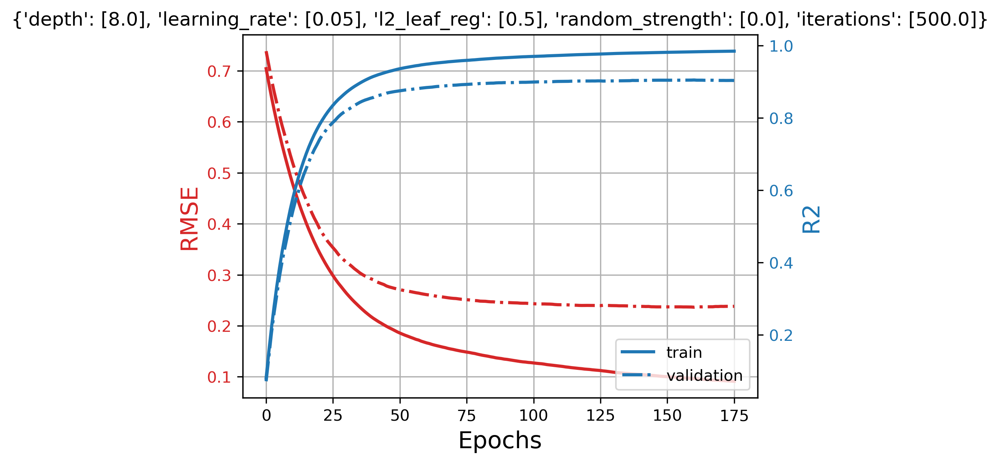

Pandas(Index=0, depth=8, learning_rate=0.05, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=1, depth=8, learning_rate=0.05, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=2, depth=8, learning_rate=0.05, l2_leaf_reg=2.0, random_strength=0, iterations=500)
Pandas(Index=3, depth=8, learning_rate=0.05, l2_leaf_reg=5.0, random_strength=0, iterations=500)
Pandas(Index=4, depth=8, learning_rate=0.1, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=5, depth=8, learning_rate=0.1, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=6, depth=8, learning_rate=0.1, l2_leaf_reg=2.0, random_strength=0, iterations=500)
Pandas(Index=7, depth=8, learning_rate=0.1, l2_leaf_reg=5.0, random_strength=0, iterations=500)
Pandas(Index=8, depth=8, learning_rate=0.15, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=9, depth=8, learning_rate=0.15, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=10, depth=8, learning

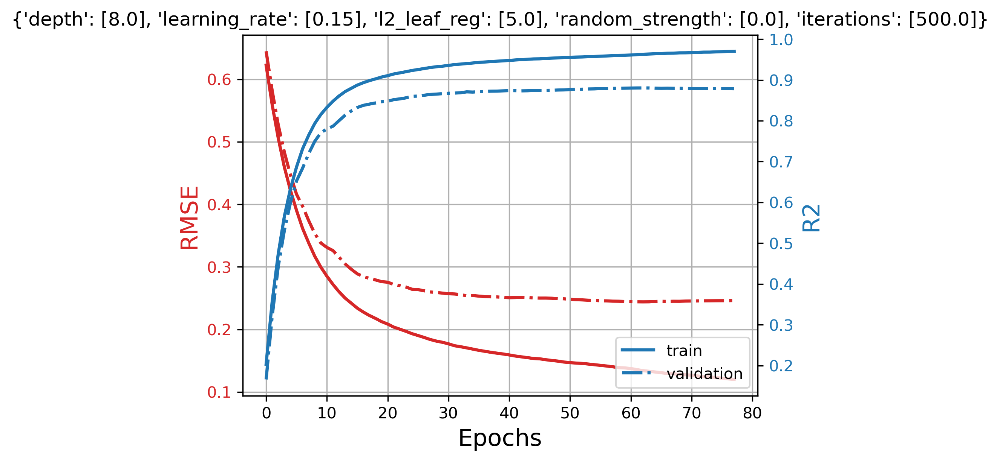

Pandas(Index=0, depth=8, learning_rate=0.05, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=1, depth=8, learning_rate=0.05, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=2, depth=8, learning_rate=0.05, l2_leaf_reg=2.0, random_strength=0, iterations=500)
Pandas(Index=3, depth=8, learning_rate=0.05, l2_leaf_reg=5.0, random_strength=0, iterations=500)
Pandas(Index=4, depth=8, learning_rate=0.1, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=5, depth=8, learning_rate=0.1, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=6, depth=8, learning_rate=0.1, l2_leaf_reg=2.0, random_strength=0, iterations=500)
Pandas(Index=7, depth=8, learning_rate=0.1, l2_leaf_reg=5.0, random_strength=0, iterations=500)
Pandas(Index=8, depth=8, learning_rate=0.15, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=9, depth=8, learning_rate=0.15, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=10, depth=8, learning

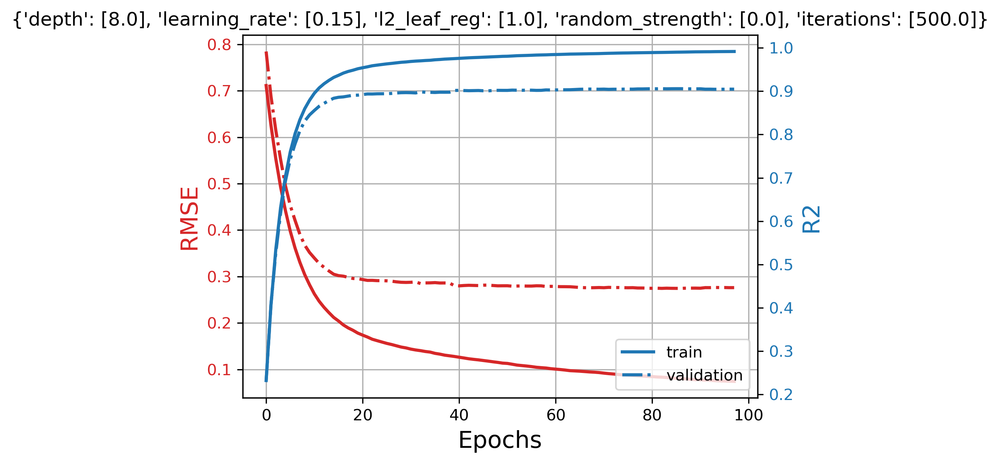

Pandas(Index=0, depth=8, learning_rate=0.05, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=1, depth=8, learning_rate=0.05, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=2, depth=8, learning_rate=0.05, l2_leaf_reg=2.0, random_strength=0, iterations=500)
Pandas(Index=3, depth=8, learning_rate=0.05, l2_leaf_reg=5.0, random_strength=0, iterations=500)
Pandas(Index=4, depth=8, learning_rate=0.1, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=5, depth=8, learning_rate=0.1, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=6, depth=8, learning_rate=0.1, l2_leaf_reg=2.0, random_strength=0, iterations=500)
Pandas(Index=7, depth=8, learning_rate=0.1, l2_leaf_reg=5.0, random_strength=0, iterations=500)
Pandas(Index=8, depth=8, learning_rate=0.15, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=9, depth=8, learning_rate=0.15, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=10, depth=8, learning

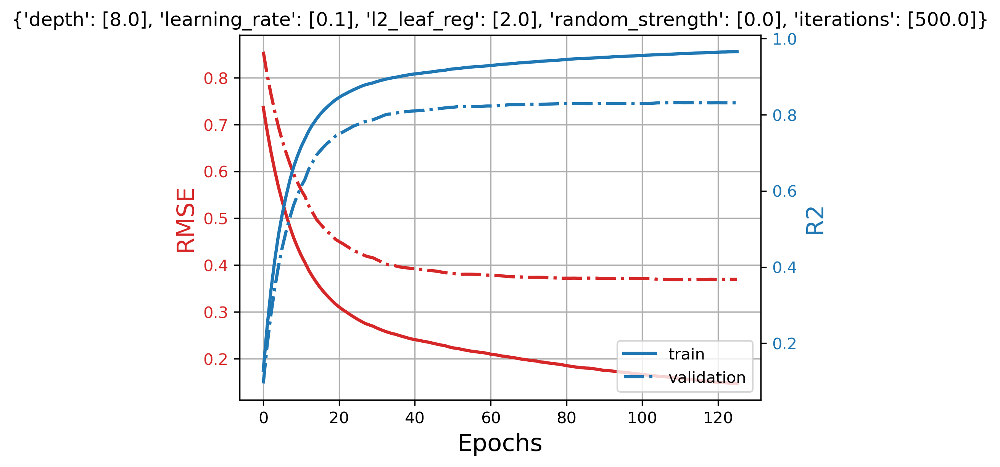

Pandas(Index=0, depth=8, learning_rate=0.05, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=1, depth=8, learning_rate=0.05, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=2, depth=8, learning_rate=0.05, l2_leaf_reg=2.0, random_strength=0, iterations=500)
Pandas(Index=3, depth=8, learning_rate=0.05, l2_leaf_reg=5.0, random_strength=0, iterations=500)
Pandas(Index=4, depth=8, learning_rate=0.1, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=5, depth=8, learning_rate=0.1, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=6, depth=8, learning_rate=0.1, l2_leaf_reg=2.0, random_strength=0, iterations=500)
Pandas(Index=7, depth=8, learning_rate=0.1, l2_leaf_reg=5.0, random_strength=0, iterations=500)
Pandas(Index=8, depth=8, learning_rate=0.15, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=9, depth=8, learning_rate=0.15, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=10, depth=8, learning

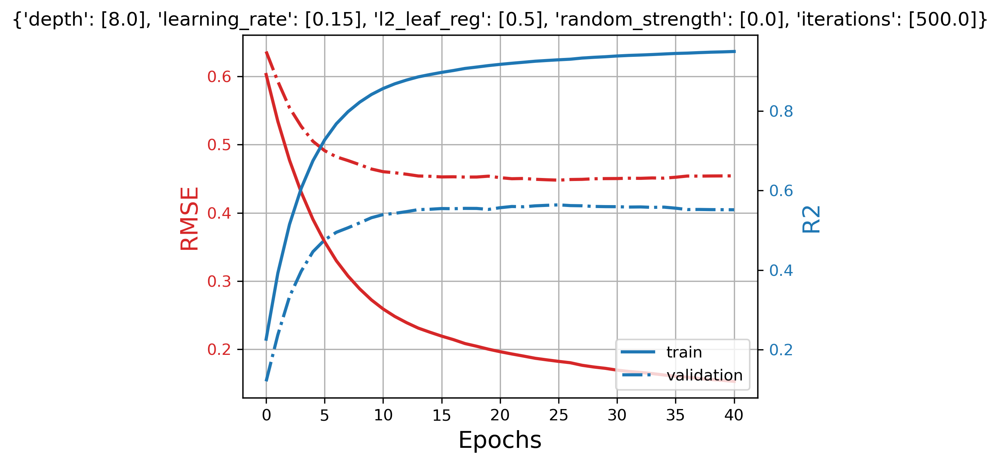

Pandas(Index=0, depth=8, learning_rate=0.05, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=1, depth=8, learning_rate=0.05, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=2, depth=8, learning_rate=0.05, l2_leaf_reg=2.0, random_strength=0, iterations=500)
Pandas(Index=3, depth=8, learning_rate=0.05, l2_leaf_reg=5.0, random_strength=0, iterations=500)
Pandas(Index=4, depth=8, learning_rate=0.1, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=5, depth=8, learning_rate=0.1, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=6, depth=8, learning_rate=0.1, l2_leaf_reg=2.0, random_strength=0, iterations=500)
Pandas(Index=7, depth=8, learning_rate=0.1, l2_leaf_reg=5.0, random_strength=0, iterations=500)
Pandas(Index=8, depth=8, learning_rate=0.15, l2_leaf_reg=0.5, random_strength=0, iterations=500)
Pandas(Index=9, depth=8, learning_rate=0.15, l2_leaf_reg=1.0, random_strength=0, iterations=500)
Pandas(Index=10, depth=8, learning

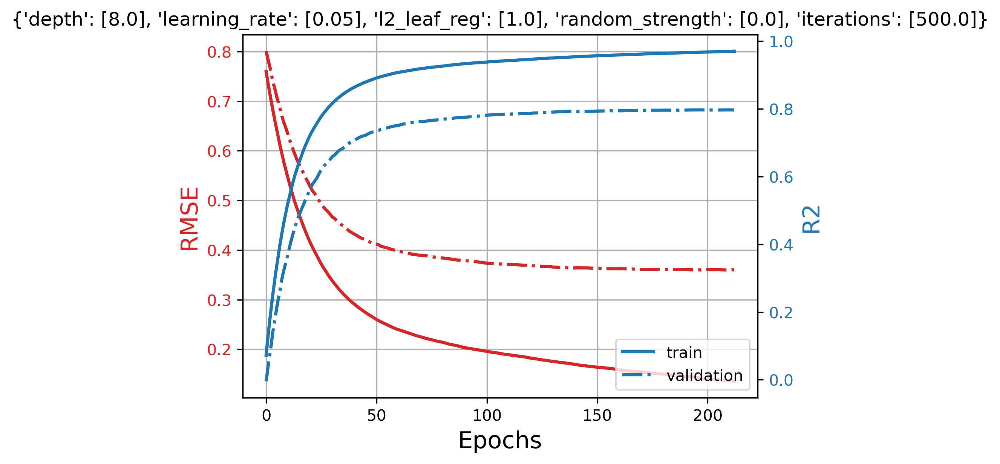

In [225]:
#import model_training
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import LeaveOneOut

df2=matrix_ele_day.copy()

state = 'VIC'

base_feature = ['year','month', 'day','weekend', 'solar','day_of_year','day_of_week']
state_feature = ['T_HDAY','T_solar_PV','T_PV',
                 'T_max','T_min','T_max2','T_min2','T_ave', 'T_ave2', 'T_diff','T_diff2',
                 'T_HDD','T_CDD', 'T_HDD_m','T_HDD2','T_CDD_m','T_CDD2',
                 'T_HDD_5dexp_n','T_CDD_5dexp_n','T_HDD_5d', 'T_CDD_5d'] # 'T_GSP_i', 

state_feature = ['T_HDAY','T_solar_PV','T_PV', 'T_GSP_i', 
                 'T_max','T_min','T_max2','T_min2','T_ave','T_ave2','T_diff', 'T_diff2',
                 'T_HDD','T_HDD2','T_CDD','T_CDD2','T_HDD_m','T_CDD_m','T_HDD_m2','T_CDD_m2',
                 'T_HDD_5dexp_n','T_CDD_5dexp_n','T_HDD_5d', 'T_CDD_5d','T_ave_15d', 'T_ave_15d']#'T_HDD_14dexp_n','T_CDD_14dexp_n'


target = ['']

col_feature = base_feature + state_feature

coef = pd.DataFrame(columns = col_feature)

cond_norm = (df2.date>'2015-06-30')&(df2.date<='2019-01-01')
cond_precovid = (df2.date>'2019-01-01')&(df2.date<='2020-01-01')
cond_covid = (df2.date>'2020-01-01')&(df2.date<='2020-10-10')

ind_norm = df2[cond_norm].index

loocv=LeaveOneOut()

n_splits = 4
tscv = TimeSeriesSplit(n_splits=n_splits)
cat_features_index = []

# use a dataframe to record the best parameter
bp = pd.DataFrame()


for state in states:
    
    target = [state]
    
    X_train_n,Y_train_n,X_val_n,Y_val_n,X_test_n,Y_test_n,col_f,scaler\
    = scale_data2(state=state,df=df2,base_feature = base_feature,state_feature = state_feature,target = target,
                  cond_train=cond_norm, cond_val=cond_precovid,cond_test=cond_covid)
    
    scale_data2(state,df,base_feature,state_feature,target,cond_train,cond_val,cond_test)

    #print(col_f)
    X_n = np.concatenate((np.concatenate((X_train_n,X_val_n)),X_test_n))
    Y_true_n = np.append(np.append(Y_train_n,Y_val_n),Y_test_n)
    Y_pred_n = []

    train_data = [X_train_n,Y_train_n]
    val_data = [X_val_n,Y_val_n]
    test_data = [X_test_n,Y_test_n]

    # choose features and target to put in the model

    # define the loss function and evaludation metric
    loss_function='RMSE'
    eval_metric = 'R2'

    catb = build_cat(loss_function=loss_function,eval_metric = eval_metric,od_wait=15,random_seed=42)

    # whether to use PCA
    flag_pca = 0

    params = {'depth': [8],
              'learning_rate' : [0.05,0.1,0.15],
             'l2_leaf_reg': [0.5,1,2,5],
              'random_strength':[0],
              'iterations': [500]
             }


    # for hyper-parameters, see https://catboost.ai/docs/concepts/python-reference_parameters-list.html
    train_results,best_para, catb_grid = train_cat(model=catb,grid_para=params,cv=tscv,verbose=False,
                        train_data=train_data,val_data=val_data,test_data=test_data,cat_features_index=cat_features_index,
                       loss_function = loss_function,eval_metric = eval_metric,plot_progress = False,retrain_best = True)
    
    
    for k,col in enumerate(best_para.index.to_list()):
        bp.loc[state,col] = best_para.values[k]
  

    Y_pred_n = catb_grid.predict(X_n)

    data_true_n = np.concatenate((X_n,Y_true_n.reshape(-1,1)),axis=1)
    data_pred_n = np.concatenate((X_n,Y_pred_n.reshape(-1,1)),axis=1)

    Y_true = scaler.inverse_transform(data_true_n)[:,-1]
    Y_pred = scaler.inverse_transform(data_pred_n)[:,-1]

    df2.loc[ind_norm[0]:,state+'_pred'] = Y_pred
    df2.loc[ind_norm[0]:,state+'_pred/true'] = df2.loc[ind_norm[0]:,state+'_pred']/df2.loc[ind_norm[0]:,state]
    
    


In [222]:
from sklearn.metrics import r2_score
for state in states:
    
    bp.loc[state,'R^2_train'] = r2_score(df2[cond_norm][state], df2[cond_norm][state+'_pred'])
    bp.loc[state,'R^2_test'] = r2_score(df2[cond_covid][state], df2[cond_covid][state+'_pred'])
    

In [223]:
bp

,depth,learning_rate,l2_leaf_reg,random_strength,iterations,"(NSW, R^2_train)","(NSW, R^2_test)","(VIC, R^2_train)","(VIC, R^2_test)","(QLD, R^2_train)","(QLD, R^2_test)","(SA, R^2_train)","(SA, R^2_test)","(TAS, R^2_train)","(TAS, R^2_test)","(WA, R^2_train)","(WA, R^2_test)",R^2_train,R^2_test
NSW,8.0,0.15,0.5,0.0,500.0,0.960846,0.809179,0.959867,0.845683,0.989676,0.828855,0.940127,0.795161,0.891858,0.68864,0.948488,0.753062,0.960846,0.809179
VIC,8.0,0.15,2.0,0.0,500.0,0.960846,0.809179,0.959867,0.845683,0.989676,0.828855,0.940127,0.795161,0.891858,0.68864,0.948488,0.753062,0.959867,0.845683
QLD,8.0,0.05,5.0,0.0,500.0,0.960846,0.809179,0.959867,0.845683,0.989676,0.828855,0.940127,0.795161,0.891858,0.68864,0.948488,0.753062,0.989676,0.828855
SA,8.0,0.10,5.0,0.0,500.0,0.960846,0.809179,0.959867,0.845683,0.989676,0.828855,0.940127,0.795161,0.891858,0.68864,0.948488,0.753062,0.940127,0.795161
TAS,8.0,0.15,5.0,0.0,500.0,0.960846,0.809179,0.959867,0.845683,0.989676,0.828855,0.940127,0.795161,0.891858,0.68864,0.948488,0.753062,0.891858,0.688640
WA,8.0,0.15,0.5,0.0,500.0,0.960846,0.809179,0.959867,0.845683,0.989676,0.828855,0.940127,0.795161,0.891858,0.68864,0.948488,0.753062,0.948488,0.753062


In [231]:
cond = (df2.date>'2017-07-01')&(df2.date<'2020-10-20')

plt.figure(figsize = (12,10))

for i,state in enumerate(states):
    
        
    #cond_dd = df[state+'_HDD'] + df[state+'_CDD']== 0 
    
    ax = plt.subplot(3,2,i+1)
    plt.plot(df2[cond].date,df2[cond][state],color=[0.0,0.6,0.6,0.6],label = 'true')
    plt.plot(df2[cond].date,df2[cond][state+'_pred'],':',color=[0.6,0.0,0.6,0.6],label = 'pred')
    
#     plt.plot(df[cond&cond_dd].date,df[cond&cond_dd][state],':',color=[0.6,0.0,0.6,0.6],label = 'true_noDD')
#     plt.plot(df[cond&cond_dd].date,df[cond&cond_dd][state+'_pred'],':',color=[0.6,0.0,0.6,0.6],label = 'pred_noDD')
    #sns.distplot(df[cond][state+'_pred/true'],rug = True,kde=True)    
     
    mape = mean_absolute_percentage_error(df2[cond][state],df2[cond][state+'_pred'])
    #mape_noDD = mean_absolute_percentage_error(df2[cond&cond_dd][state],df2[cond&cond_dd][state+'_pred'])
    
    plt.title(state)
    plt.text(0.05,0.80,s='MAPE = '+str(round(mape,2))+'%',horizontalalignment='left',transform=ax.transAxes)
    #plt.text(0.05,0.90,s='MAPE_noDD = '+str(round(mape_noDD,2))+'%',horizontalalignment='left',transform=ax.transAxes)
    plt.xticks(rotation = 85)
    plt.legend()
    
plt.suptitle('Electricity consumption (MWh)')
    
plt.tight_layout()

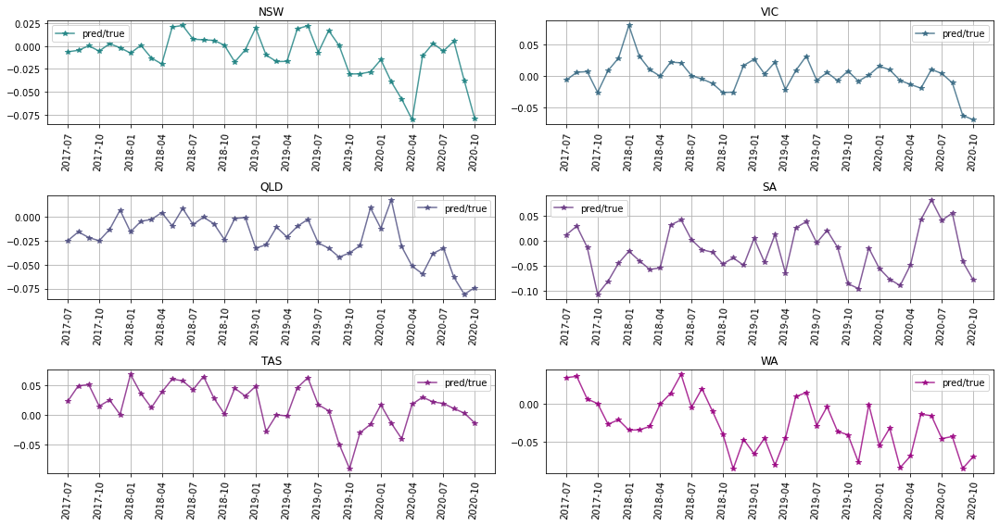

In [1165]:
df2['year_month'] = df2['date'].dt.to_period('M')
df2['year_month'] = df2['year_month'].dt.to_timestamp('s').dt.strftime('%Y-%m')

plt.figure(figsize=(15,8))

xticks = ['2014-07','2015-01','2015-07','2016-01','2016-07','2017-01','2017-07',
       '2018-01','2018-07','2019-01','2019-07','2020-01','2020-07']

xticks = ['2017-07','2017-10','2018-01','2018-04','2018-07','2018-10','2019-01','2019-04','2019-07',
          '2019-10','2020-01','2020-04','2020-07','2020-10',]


cond = (df2.date>='2017-07-01')&(df2.date<'2020-10-20')

for i,state in enumerate(states):
    
    
    df_month_true = df2[cond].groupby('year_month')[[state]].sum().reset_index()
    df_month_pred = df2[cond].groupby('year_month')[[state+'_pred']].sum().reset_index()
    #df = df.reset_index()
    
    plt.subplot(3,2,i+1);
    plt.plot(df_month_true['year_month'],1-df_month_pred[state+'_pred']/df_month_true[state+'_pred'],'*-',color=[0.1+0.1*i,0.5-0.1*i,0.5,0.8] );
    #plt.plot(df_month_pred['year_month'],df_month_pred[state+'_pred']/1e6,'.-',color=[0.5,0.0,0.5,0.5] ) ; 
    #plt.title('Monthly electricity consumption in '+state + ' (TWh)');
    #sns.distplot(df_month_pred[state+'_pred']/df_month_true[state],label='pred/true')
    plt.legend(['pred/true','pred']);
    plt.xticks(xticks,rotation=85);
    plt.title(state)
    plt.grid()
    
plt.tight_layout()

In [232]:
fig, axes = plt.subplots(3,2,figsize=(12,12))

df2['month_day'] = df2['month'].astype(str).str.zfill(2) +'-' + df2['day'].astype(str).str.zfill(2)
df2['month_day'] = pd.to_datetime(df2['month_day'],format='%m-%d', errors='ignore')
xticks = ['01-01','02-01','03-01','04-01','05-01','06-01','07-01','08-01','09-01','10-01','11-01','12-01']
 
for i,state in enumerate(states):
    
    cond1 = (df2.date>='2017-01-01')&(df2.date<'2020-01-01')
    cond2 = (df2.date>='2020-01-01')&(df2.date<'2020-10-10')
    df2.loc[:,state+'_10d'] = df2.loc[:,state].rolling(window=10).mean()
    df2.loc[:,state+'_10d_pred'] = df2.loc[:,state+'_pred'].rolling(window=10).mean()
   
    plt.subplot(3,2,i+1)
 
    sns.lineplot(data = df2[cond2], x='month_day', y=state+'_10d')
    sns.lineplot(data = df2[cond2], x='month_day', y=state+'_10d_pred')
    sns.lineplot(data = df2[cond1], x='month_day', y=state+'_10d')
    
#     plt.plot(df2[cond2]['month_day'], df2[cond2][state+'_10d'])
#     plt.plot(df2[cond2]['month_day'], df2[cond2][state+'_10d_pred'])
#     plt.plot(df2[cond1]['month_day'], df2[cond1][state+'_10d'])
    
    plt.xticks(xticks,rotation=85)    
    
    plt.title(state)
    
    plt.grid(axis='x')
plt.suptitle('10-day Mean Electricity Consumption (MWh) \n',fontsize = 15)    
fig.legend(['2020','2020_pred','2017-2019'],frameon=False)
plt.tight_layout()

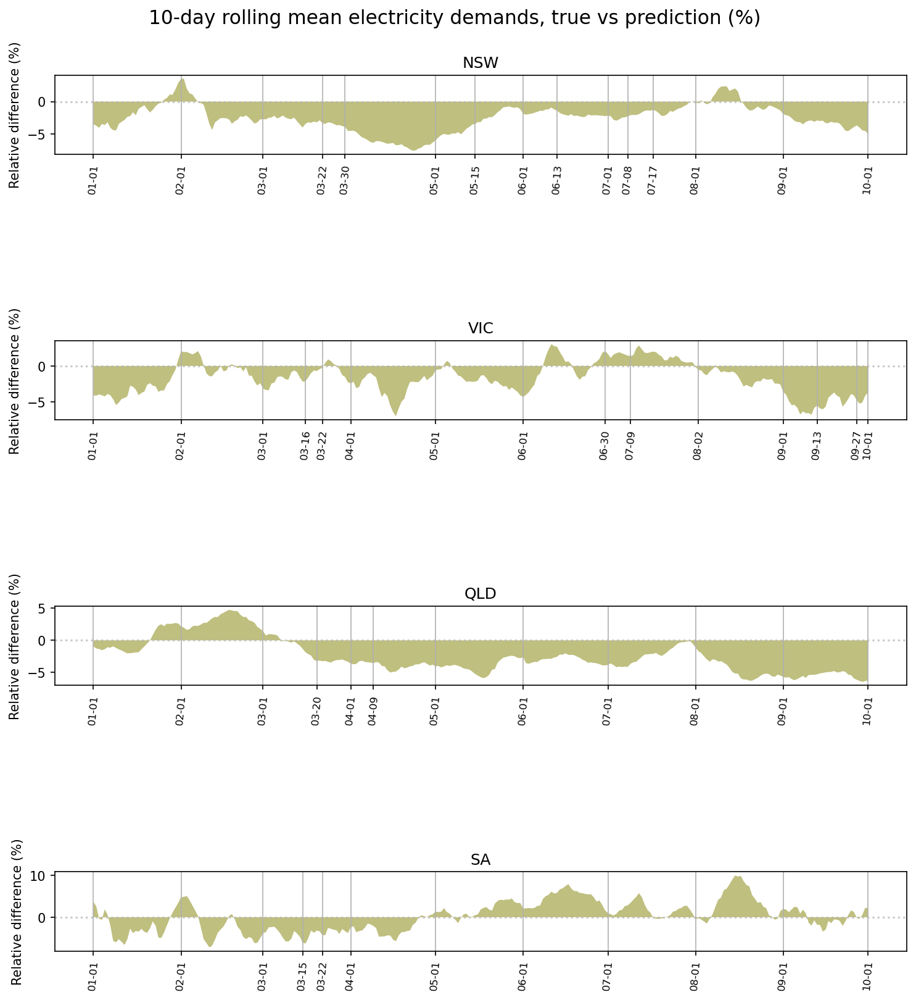

In [266]:
fig, axes = plt.subplots(6,1,figsize=(10,12))

df2['month_day'] = df2['month'].astype(str).str.zfill(2) +'-' + df2['day'].astype(str).str.zfill(2)
df2['month_day'] = pd.to_datetime(df2['month_day'],format='%m-%d', errors='ignore')

xticks = ['01-01','02-01','03-01','04-01','05-01','06-01','07-01','08-01','09-01','10-01']
xticks = {'NSW':['01-01','02-01','03-01','03-22','03-30','05-01','05-15','06-01','06-13','07-01','07-08','07-17','08-01','09-01','10-01'],
         'VIC':['01-01','02-01','03-01','03-16','03-22','04-01','05-01','06-01','06-30','07-09','08-02','09-01','09-13','09-27','10-01'],
         'QLD':['01-01','02-01','03-01','03-20','04-01','04-09','05-01','06-01','07-01','08-01','09-01','10-01'],
         'SA':['01-01','02-01','03-01','03-15','03-22','04-01','05-01','06-01','07-01','08-01','09-01','10-01'],
         'TAS':['01-01','02-01','03-01','03-20','04-01','05-01','06-01','07-01','08-01','09-01','10-01'],
         'WA':['01-01','02-01','03-01','03-20','04-01','05-01','06-01','07-01','08-01','09-01','10-01'],}
  
for i,state in enumerate(states[:4]):
    
    
    cond1 = (df2.date>='2016-01-01')&(df2.date<'2020-01-01')
    cond2 = (df2.date>='2020-01-01')&(df2.date<'2020-10-10')
    df.loc[:,state+'_10d'] = df.loc[:,state].rolling(window=10).mean()
    df.loc[:,state+'_10d_pred'] = df.loc[:,state+'_pred'].rolling(window=10).mean()   
    df.loc[:,state+'_10d_pred/true'] = (df.loc[:,state+'_10d']/df.loc[:,state+'_10d_pred'])*100-100 
    
    df2.loc[:,state+'_10d'] = df2.loc[:,state].rolling(window=10).mean()
    df2.loc[:,state+'_10d_pred'] = df2.loc[:,state+'_pred'].rolling(window=10).mean()   
    df2.loc[:,state+'_10d_pred/true'] = (df2.loc[:,state+'_10d']/df2.loc[:,state+'_10d_pred'])*100-100 
    
    
    plt.subplot(8,1,i*2+1)
 
    #plt.plot(df[cond2]['month_day'], 100*(df[cond2][state+'_10d_pred'] - df[cond2][state+'_10d'])/df[cond2][state+'_10d'])
    
    #sns.lineplot(data = df[cond2], x='month_day', y = state+'_10d_pred/true')
    #sns.lineplot(data = df2[cond2], y='month_day', x = state+'_10d_pred/true')
    plt.fill_between(df2[cond2]['month_day'],df2[cond2][state+'_10d_pred/true'],0,facecolor=[0.5,0.5,0,0.5])
    #plt.plot(df2[cond2][state+'_10d_pred/true'],0,df2[cond2]['month_day'])
    #plt.plot(df[cond2]['month_day'], df[cond2][state+'_10d_pred'])
    #sns.lineplot(data = df[cond1], x='month_day', y = state+'_10d_pred/true')
    #sns.lineplot(data = df2[cond1], x='month_day', y = state+'_10d_pred/true')
    plt.axhline(y=0,color=[0.7,0.7,0.7,0.7],ls=":")
#     plt.plot(df2[cond2]['month_day'], df2[cond2][state+'_10d'])
#     plt.plot(df2[cond2]['month_day'], df2[cond2][state+'_10d_pred'])
#     plt.plot(df2[cond1]['month_day'], df2[cond1][state+'_10d'])
    
    plt.xticks(xticks[state],rotation=85,fontsize = 8)
    plt.ylabel('Relative difference (%)')    
    plt.title(state)
    
    plt.grid(axis='x')
plt.suptitle('10-day rolling mean electricity demands, true vs prediction (%) \n',fontsize = 15)    
#fig.legend(['2020_linear','2020_cat','2016-2019_linear','2016-2019_cat'],frameon=False,loc='upper left')
#fig.legend(['2020_cat'],frameon=False,loc='upper left')
plt.tight_layout()
plt.savefig('electricity_true_vs_pred4.png')

In [213]:
fig, axes = plt.subplots(6,1,figsize=(10,18))

df2['month_day'] = df2['month'].astype(str).str.zfill(2) +'-' + df2['day'].astype(str).str.zfill(2)
df2['month_day'] = pd.to_datetime(df2['month_day'],format='%m-%d', errors='ignore')

xticks = ['01-01','02-01','03-01','04-01','05-01','06-01','07-01','08-01','09-01','10-01']
xticks = {'NSW':['01-01','02-01','03-01','03-22','03-30','04-01','05-01','05-15','06-01','06-13','07-01','07-08','07-17','08-01','09-01','10-01'],
         'VIC':['01-01','02-01','03-01','03-16','03-22','04-01','05-01','06-01','06-30','07-01','07-09','08-01','08-02','09-01','09-13','09-27','10-01'],
         'QLD':['01-01','02-01','03-01','03-20','04-01','04-09','04-11','05-01','06-01','07-01','08-01','09-01','10-01'],
         'SA':['01-01','02-01','03-01','03-20','04-01','05-01','06-01','07-01','08-01','09-01','10-01'],
         'TAS':['01-01','02-01','03-01','03-20','04-01','05-01','06-01','07-01','08-01','09-01','10-01'],
         'WA':['01-01','02-01','03-01','03-20','04-01','05-01','06-01','07-01','08-01','09-01','10-01'],}
  
for i,state in enumerate(states[:2]):
    
    
    cond1 = (df2.date>='2016-01-01')&(df2.date<'2020-01-01')
    cond2 = (df2.date>='2020-01-01')&(df2.date<'2020-10-10')
    df.loc[:,state+'_10d'] = df.loc[:,state].rolling(window=10).mean()
    df.loc[:,state+'_10d_pred'] = df.loc[:,state+'_pred'].rolling(window=10).mean()   
    df.loc[:,state+'_10d_pred/true'] = (df.loc[:,state+'_10d']/df.loc[:,state+'_10d_pred'])*100-100 
    
    df2.loc[:,state+'_10d'] = df2.loc[:,state].rolling(window=10).mean()
    df2.loc[:,state+'_10d_pred'] = df2.loc[:,state+'_pred'].rolling(window=10).mean()   
    df2.loc[:,state+'_10d_pred/true'] = (df2.loc[:,state+'_10d']/df2.loc[:,state+'_10d_pred'])*100-100 
    
    
    plt.subplot(6,1,i+1)
 
    #plt.plot(df[cond2]['month_day'], 100*(df[cond2][state+'_10d_pred'] - df[cond2][state+'_10d'])/df[cond2][state+'_10d'])
    
    #sns.lineplot(data = df[cond2], x='month_day', y = state+'_10d_pred/true')
    sns.lineplot(data = df2[cond2], x='month_day', y = state+'_10d_pred/true')
    #plt.plot(df[cond2]['month_day'], df[cond2][state+'_10d_pred'])
    #sns.lineplot(data = df[cond1], x='month_day', y = state+'_10d_pred/true')
    #sns.lineplot(data = df2[cond1], x='month_day', y = state+'_10d_pred/true')
    plt.axhline(y=0,color=[0.7,0.7,0.7,0.7],ls=":")
#     plt.plot(df2[cond2]['month_day'], df2[cond2][state+'_10d'])
#     plt.plot(df2[cond2]['month_day'], df2[cond2][state+'_10d_pred'])
#     plt.plot(df2[cond1]['month_day'], df2[cond1][state+'_10d'])
    
    plt.xticks(xticks,rotation=85)
    plt.ylabel('Relative difference (%)')    
    plt.title(state)
    
    plt.grid(axis='x')
plt.suptitle('10-day rolling mean electricity demands, true vs prediction (%) \n',fontsize = 15)    
#fig.legend(['2020_linear','2020_cat','2016-2019_linear','2016-2019_cat'],frameon=False,loc='upper left')
fig.legend(['2020_cat'],frameon=False,loc='upper left')
plt.tight_layout()
plt.savefig('electricity_true_vs_pred4.png')
    

<Figure size 1800x1200 with 0 Axes>

In [233]:
ax = plt.subplots(6,4,figsize = (10,15),sharey=True)

df = matrix_ele_day.copy()
cond =(df.date>'2015-01-01') & (df.date<'2020-01-01')
marker_size = 8
alpha = 0.2

for i,state in enumerate(states):

    plt.subplot(6,4,i*4+1)
    #plt.scatter(df[cond][state+'_ave'],df[cond][state],alpha=alpha,s=marker_size,color = 'green')
    sns.regplot(x=state+'_ave', y=state, data=df[cond],
                 scatter_kws={"s": marker_size, 'alpha':alpha,'color': 'green'},
                line_kws={'color': 'black','lw': 1},
                 order=2, ci=None)
    plt.xlabel('T_ave (degree C)')
    plt.ylabel('$C_E$ (MWh)')
    
    
    plt.subplot(6,4,i*4+2)
    #cond4 = df[state+'_diff']<5
    plt.scatter(df[cond][state+'_diff'],df[cond][state],alpha=alpha,s=marker_size)
    #plt.legend(['T_diff'])
    plt.xlabel('T_diff (degree C)')
    plt.yticks([])
    #plt.ylabel('$C_E$ ')
    plt.title('        '+state,fontsize = 13, loc='right')
    
    
    plt.subplot(6,4,i*4+3)
    
    plt.scatter(df[cond][state+'_max'],df[cond][state],alpha=alpha,s=marker_size)
    plt.scatter(df[cond][state+'_min'],df[cond][state],alpha=alpha,s=marker_size)
    plt.legend(['T_max','T_min'])
    plt.xlabel('T_max & T_min (degree C)')
    plt.yticks([])
    #plt.ylabel('$C_E$')
    
       
    plt.subplot(6,4,i*4+4)
    cond1 = df[state+'_CDD_n']>0 
    cond2 = df[state+'_HDD_n']>0
    cond3 = (df[state+'_CDD_n']==0)&(df[state+'_HDD_n']==0)
    
    plt.scatter(df[cond&cond1][state+'_CDD_n'],df[cond&cond1][state],alpha=alpha,s=marker_size)
    plt.scatter(-df[cond&cond2][state+'_HDD_n'],df[cond&cond2][state],alpha=alpha,s=marker_size)
    #plt.scatter(df[cond&cond3][state+'_HDD_n'],df[cond&cond3][state],alpha=alpha,s=marker_size)
    
    plt.legend(['CDD','-HDD'])
    plt.xlabel('-HDD & CDD (degree.day)')
    plt.yticks([])
    #plt.ylabel('$C_E$ (TWh)')
    
plt.suptitle('Electricity consumption $C_E$ vs Temperature features\n', fontsize = 15)    
plt.tight_layout()

plt.savefig('electri_vs_temp_scatter.png')

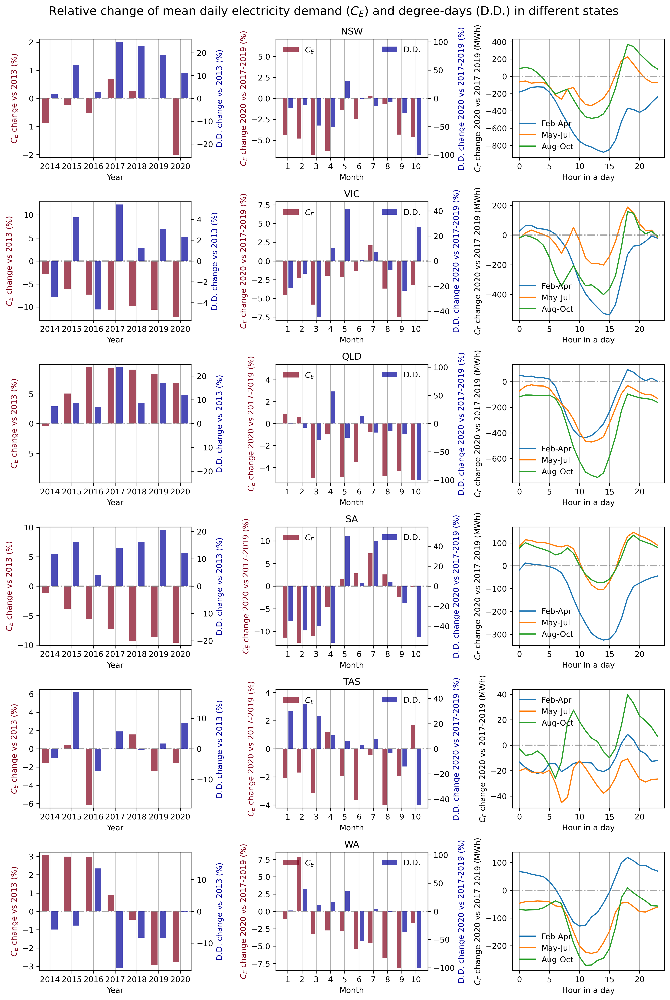

In [121]:
plt.figure(figsize = (12,18))

df = matrix_ele_day.copy()
cond0 = (df.date >= '2013-01-01') & (df.month < 11)
cond1 =(df.date >= '2017-01-01') & (df.date<'2019-10-10') & (df.month < 11)
cond2 =(df.date >= '2020-01-01') & (df.date<'2020-10-10')

df_h = matrix_ele.copy()
cond0_h = (df_h.date_time >= '2013-01-01') & (df.month < 11)
cond1_h =(df_h.date_time >= '2017-01-01') & (df_h.date_time<'2020-01-01') & (df_h.month < 11)
cond2_h =(df_h.date_time >= '2020-01-01') & (df_h.date_time<'2020-11-01')


marker_size = 8
alpha = 0.2

for i,state in enumerate(states):
    
    df[state+'_DD'] = df[state+'_HDD'] + df[state+'_CDD'];

    ax1 = plt.subplot(6,3,i*3+1)
    ax2 = ax1.twinx()
    
    xticks = [2014,2015,2016,2017,2018,2019,2020]
    df0 = df[cond0].groupby('year')[[state,state+'_DD']].mean().reset_index()
    df0[state+'_change'] = (df0[state]/(df0.loc[0,state]+0.0001) -1)*100
    df0[state+'_DD_change'] = (df0[state+'_DD']/(df0.loc[0,state+'_DD']+0.0001) -1)*100 
     
    ax1.bar(df0.year-0.2, df0[state+'_change'], width=0.3, color=[0.5,0.0,0.1,0.7], align='center')
    ax1.axhline(y=0,color=[0.5,0.5,0.5,0.7],ls="-.")
    ax2.bar(df0.loc[1:,'year']+0.2, df0.loc[1:,state+'_DD_change'], width=0.3, color=[0.0,0.0,0.6,0.7], align='center')
    ax1.set_ylim(-1.05*max(abs(df0[state+'_change'])),1.05*max(abs(df0[state+'_change'])))
    ax2.set_ylim(-1.05*max(abs(df0[state+'_DD_change'])),1.05*max(abs(df0[state+'_DD_change'])))
    plt.xlim(2013.5,2020.5)
    #ax1.legend(['$C_E$'],loc='upper left',frameon=False)
    #ax2.legend(['D.D.'],loc='upper right',frameon=False)
    plt.xticks(xticks,rotation = 85)
    ax1.set_xlabel('Year')
    ax1.set_ylabel('$C_E$ change vs 2013 (%)',color=[0.5,0.0,0.1,1])
    ax2.set_ylabel('D.D. change vs 2013 (%)',color=[0.0,0.0,0.6,1])
    ax1.grid(axis='x')
    
    ##################
    ax1 = plt.subplot(6,3,i*3+2) 
    ax2 = ax1.twinx()
    xticks = ['Jan','Feb','Mar','Apr','May','Jun','July','Aug','Sep','Oct']
    xticks = np.arange(1,11)
    df1 = df[cond1].groupby('month')[[state,state+'_DD']].mean().reset_index()
    df2 = df[cond2].groupby('month')[[state,state+'_DD']].mean().reset_index()
    df2[state+'_change'] = (df2[state]/(df1[state]+0.0001) -1) * 100  
    df2[state+'_DD_change'] = (df2[state+'_DD']/(df1[state+'_DD']+0.0001) -1) * 100
         
    ax1.bar(df2.month-0.2, df2[state+'_change'], width=0.3, color=[0.5,0.0,0.1,0.7], align='center')
    ax2.bar(df2.month+0.2, df2[state+'_DD_change'], width=0.3, color=[0.0,0.0,0.6,0.7], align='center')
    ax1.set_ylim(-1.05*max(abs(df2[state+'_change'])),1.05*max(abs(df2[state+'_change'])))
    ax2.set_ylim(-1.05*max(abs(df2[state+'_DD_change'])),1.05*max(abs(df2[state+'_DD_change'])))
    ax1.set_xlabel('Month')
    ax1.legend(['$C_E$'],loc='upper left',frameon=False)
    ax2.legend(['D.D.'],loc='upper right',frameon=False)
    ax1.axhline(y=0,color=[0.5,0.5,0.5,0.7],ls="-.")
    
    plt.title(state)     
    plt.xticks(xticks)
    ax1.set_ylabel('$C_E$ change 2020 vs 2017-2019 (%)',color=[0.5,0.0,0.1,1])
    ax2.set_ylabel('D.D. change 2020 vs 2017-2019 (%)',color=[0.0,0.0,0.6,1])
    ax1.grid(axis='x')
    
    #####################
    plt.subplot(6,3,i*3+3)  
    
    for j in range(2,9,3):
        cond_s = (df_h.month>=j) & (df_h.month<=j+2)
        
        df3 = df_h[cond1_h&cond_s].groupby('hour')[state].mean().reset_index();
        df4 = df_h[cond2_h&cond_s].groupby('hour')[state].mean().reset_index();
        df4[state+'_delta'] = df4[state] - df3[state]    
        sns.lineplot(data = df4,x='hour',y=state+'_delta');    
    
    plt.axhline(y=0,color=[0.5,0.5,0.5,0.7],ls="--")
    plt.xlabel('Hour in a day')
    plt.ylabel('$C_E$ change 2020 vs 2017-2019 (MWh)')    
    plt.legend(['Feb-Apr','May-Jul', 'Aug-Oct'],frameon=False)
    plt.grid(axis = 'x')
        
plt.suptitle('Relative change of mean daily electricity demand ($C_E$) and degree-days (D.D.) in different states \n', fontsize = 15)    
plt.tight_layout()


plt.savefig('electricity_change.png')

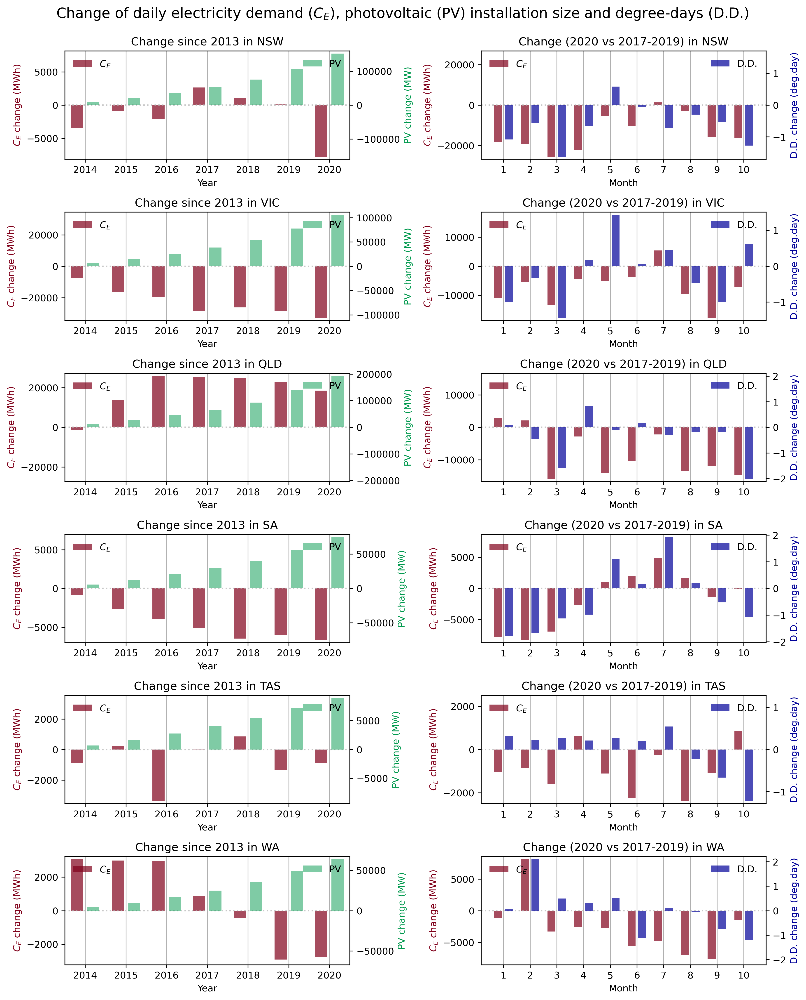

In [183]:
plt.figure(figsize = (12,15))

df = matrix_ele_day.copy()
cond0 = (df.date >= '2013-01-01') & (df.month < 11)
cond1 =(df.date >= '2017-01-01') & (df.date<'2020-01-01') & (df.month < 11)
cond2 =(df.date >= '2020-01-01') & (df.date<'2020-11-01')

df_h = matrix_ele.copy()
cond0_h = (df_h.date_time >= '2013-01-01') 
cond1_h =(df_h.date_time >= '2017-01-01') & (df_h.date_time<'2020-01-01') & (df_h.month < 11)
cond2_h =(df_h.date_time >= '2020-01-01') & (df_h.date_time<'2020-11-01')


marker_size = 8
alpha = 0.2

for i,state in enumerate(states):
    
    df[state+'_DD'] = df[state+'_HDD'] + df[state+'_CDD'];

    ax1 = plt.subplot(6,2,i*2+1)
    ax2 = ax1.twinx()
    
    xticks = [2014,2015,2016,2017,2018,2019,2020]
    df0 = df[cond0].groupby('year')[[state,state+'_PV']].mean().reset_index()
    #df0[state+'_change'] = (df0[state]/(df0.loc[0,state]+0.0001) -1)*100
    #df0[state+'_DD_change'] = (df0[state+'_PV']/(df0.loc[0,state+'_PV']+0.0001) -1)*100 
    df0[state+'_change'] = df0[state]-df0.loc[0,state]
    df0[state+'_PV_change'] = (df0[state+'_PV']-df0.loc[0,state+'_PV'])/1e3
     
    ax1.bar(df0.year-0.2, df0[state+'_change'], width=0.3, color=[0.5,0.0,0.1,0.7], align='center')
    ax2.bar(df0.loc[1:,'year']+0.2, df0.loc[1:,state+'_PV_change'], width=0.3, color=[0.0,0.6,0.3,0.5], align='center')
    ax1.set_ylim(-1.05*max(abs(df0[state+'_change'])),1.05*max(abs(df0[state+'_change'])))
    ax2.set_ylim(-1.05*max(abs(df0[state+'_PV_change'])),1.05*max(abs(df0[state+'_PV_change'])))
    plt.xlim(2013.5,2020.5)
    ax1.legend(['$C_E$'],loc='upper left',frameon=False)
    ax2.legend(['PV'],loc='upper right',frameon=False)
    plt.xticks(xticks,rotation = 85)
    ax1.set_xlabel('Year')
    ax1.set_ylabel('$C_E$ change (MWh)',color=[0.5,0.0,0.1,1])
    ax2.set_ylabel('PV change (MW)',color=[0.0,0.6,0.3,1])
    ax1.grid(axis='x')
    ax1.axhline(y=0,color=[0.7,0.7,0.7,0.7],ls=":")
    
    plt.title('Change since 2013 in '+state) 
    
    ##################
    ax1 = plt.subplot(6,2,i*2+2) 
    ax2 = ax1.twinx()
    xticks = ['Jan','Feb','Mar','Apr','May','Jun','July','Aug','Sep','Oct']
    xticks = np.arange(1,11)
    df1 = df[cond1].groupby('month')[[state,state+'_DD']].mean().reset_index()
    df2 = df[cond2].groupby('month')[[state,state+'_DD']].mean().reset_index()
    #df2[state+'_change'] = (df2[state]/(df1[state]+0.0001) -1) * 100  
    #df2[state+'_DD_change'] = (df2[state+'_DD']/(df1[state+'_DD']+0.0001) -1) * 100
    df2[state+'_change'] = df2[state] - df1[state]
    df2[state+'_DD_change'] = df2[state+'_DD']-df1[state+'_DD']
         
    ax1.bar(df2.month-0.2, df2[state+'_change'], width=0.3, color=[0.5,0.0,0.1,0.7], align='center')
    ax2.bar(df2.month+0.2, df2[state+'_DD_change'], width=0.3, color=[0.0,0.0,0.6,0.7], align='center')
    ax1.set_ylim(-1.05*max(abs(df2[state+'_change'])),1.05*max(abs(df2[state+'_change'])))
    ax2.set_ylim(-1.05*max(abs(df2[state+'_DD_change'])),1.05*max(abs(df2[state+'_DD_change'])))
    ax1.set_xlabel('Month')
    ax1.legend(['$C_E$'],loc='upper left',frameon=False)
    ax2.legend(['D.D.'],loc='upper right',frameon=False)
    ax1.axhline(y=0,color=[0.7,0.7,0.7,0.7],ls=":")
    plt.title('Change (2020 vs 2017-2019) in '+state) 
    
        
    plt.xticks(xticks)
    ax1.set_ylabel('$C_E$ change (MWh)',color=[0.5,0.0,0.1,1])
    ax2.set_ylabel('D.D. change (deg.day)',color=[0.0,0.0,0.6,1])
    ax1.grid(axis='x')
    
plt.suptitle('Change of daily electricity demand ($C_E$), photovoltaic (PV) installation size and degree-days (D.D.) \n', fontsize = 15)    
plt.tight_layout()

plt.savefig('electricity_change1.png')

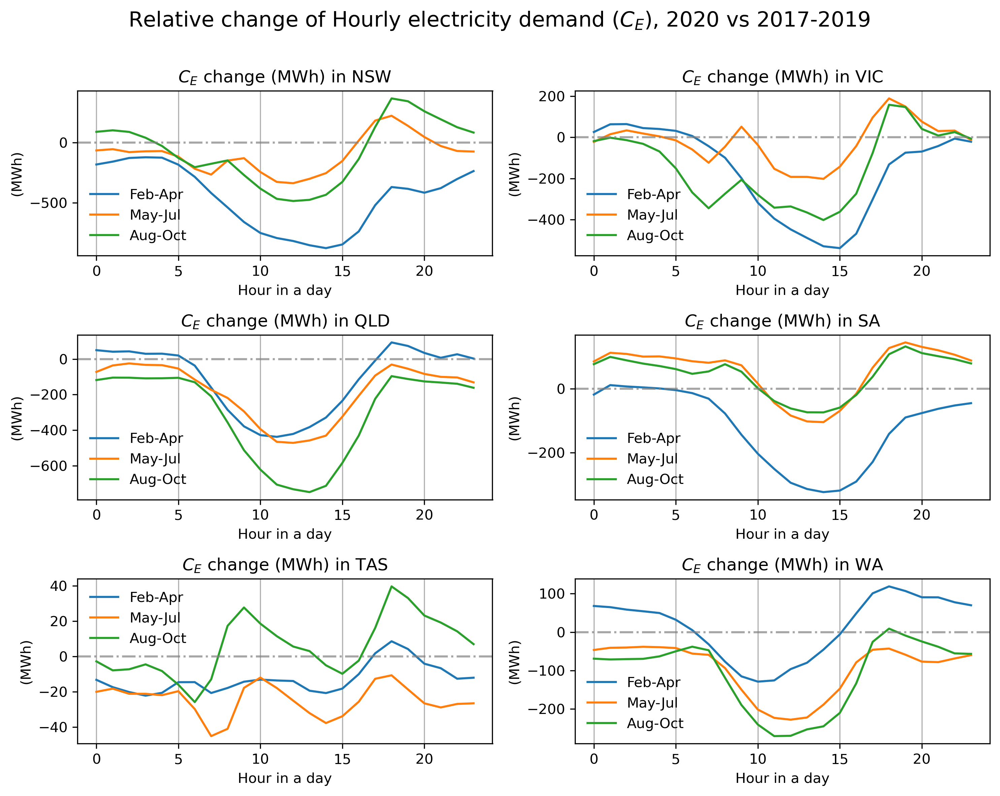

In [224]:
plt.figure(figsize = (10,8))

df = matrix_ele_day.copy()
cond0 = (df.date >= '2013-01-01') & (df.month < 11)
cond1 =(df.date >= '2017-01-01') & (df.date<'2019-10-10') & (df.month < 11)
cond2 =(df.date >= '2020-01-01') & (df.date<'2020-10-10')

df_h = matrix_ele.copy()
cond0_h = (df_h.date_time >= '2013-01-01') & (df.month < 11)
cond1_h =(df_h.date_time >= '2017-01-01') & (df_h.date_time<'2020-01-01') & (df_h.month < 11)
cond2_h =(df_h.date_time >= '2020-01-01') & (df_h.date_time<'2020-11-01')


marker_size = 8
alpha = 0.2

for i,state in enumerate(states):
    
    #####################
    plt.subplot(3,2,i+1)  
    
    for j in range(2,9,3):
        cond_s = (df_h.month>=j) & (df_h.month<=j+2)
        
        df3 = df_h[cond1_h&cond_s].groupby('hour')[state].mean().reset_index();
        df4 = df_h[cond2_h&cond_s].groupby('hour')[state].mean().reset_index();
        df4[state+'_delta'] = df4[state] - df3[state]    
        sns.lineplot(data = df4,x='hour',y=state+'_delta');    
    
    plt.axhline(y=0,color=[0.5,0.5,0.5,0.7],ls="-.")
    plt.xlabel('Hour in a day')
    plt.ylabel('(MWh)')    
    plt.legend(['Feb-Apr','May-Jul', 'Aug-Oct'],frameon=False)
    plt.title('$C_E$ change (MWh) in '+ state)
    plt.grid(axis = 'x')
        
plt.suptitle('Relative change of Hourly electricity demand ($C_E$), 2020 vs 2017-2019 \n', fontsize = 15)    
plt.tight_layout()


plt.savefig('electricity_change2.png')

In [362]:
# select columns to export to json file for Tableau dashboard
col_base = [ 'date','year','month','week','day','day_of_week','solar'] 
col_T = ['C','C_5d','T_ave','T_ave_5d','T_max','T_min','T_HDD','T_CDD','T_GSP_i','T_PV','T_HDAY']
col_state = []
col_feature = col_base+col_T + ['state']
matrix_select = pd.DataFrame(columns = col_feature)
col_feature.remove('state')

for state in states:
    col_state = col_base.copy()
    df_state = pd.DataFrame(columns = col_feature)
    
    for x in col_T:
        x_n = x.replace('T',state)
        if x_n == x:
            x_n = x.replace('C',state)
            
        col_state.append(x_n)
        
    for i,_ in enumerate(col_feature):
        df_state.loc[:,col_feature[i]] = matrix_ele_day.loc[:,col_state[i]].values
        
    df_state['state'] = state    
     
    matrix_select = pd.concat([matrix_select,df_state],axis = 0) 
        
        
#col_feature = col_feature+col_state
matrix_select    
#col_feature
 
#matrix_select = matrix_ele_day[col_feature].copy()


,date,year,month,week,day,day_of_week,solar,C,C_5d,T_ave,T_ave_5d,T_max,T_min,T_HDD,T_CDD,T_GSP_i,T_PV,T_HDAY,state
0,2013-01-01,2013,1,1,1,1,0.988039,346328.03,NaN,25.65,NaN,31.3,20.0,-0.00,6.15,1426.367318,NaN,0.0,NSW
1,2013-01-02,2013,1,1,2,2,0.990545,361317.14,NaN,22.25,NaN,24.7,19.8,-0.00,2.75,1426.514239,NaN,0.0,NSW
2,2013-01-03,2013,1,1,3,3,0.992759,370664.31,NaN,21.75,NaN,26.7,16.8,-0.00,2.25,1426.661161,NaN,0.0,NSW
3,2013-01-04,2013,1,1,4,4,0.994678,397909.05,NaN,23.45,NaN,31.5,15.4,-0.00,3.95,1426.808082,NaN,0.0,NSW
4,2013-01-05,2013,1,1,5,5,0.996303,396019.12,374447.530,25.05,23.63,33.6,16.5,-0.00,5.55,1426.955003,NaN,0.0,NSW
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2826,2020-09-27,2020,9,39,27,6,-0.220724,79400.52,81950.760,14.25,17.59,20.5,8.0,2.25,-0.00,717.999125,73480766.0,0.0,WA
2827,2020-09-28,2020,9,40,28,0,-0.203914,79845.22,81556.704,16.20,17.50,20.8,11.6,0.30,-0.00,717.999125,73480766.0,1.0,WA
2828,2020-09-29,2020,9,40,29,1,-0.187043,91712.33,83600.556,13.75,16.04,20.0,7.5,2.75,-0.00,717.999125,73480766.0,0.0,WA
2829,2020-09-30,2020,9,40,30,2,-0.170118,88997.82,84260.042,18.25,15.93,21.8,14.7,-0.00,-0.00,717.999125,73480766.0,0.0,WA


In [363]:
# col_T = ['T_pred','T_10d','T_10d_pred','T_10d_pred/true']
# col_state = []
# col_feature = ['date']

# for state in states:
#     for x in col_T:
#         x_n = x.replace('T',state)
#         col_state.append(x_n)
        
        
# col_feature = col_feature+col_state
# df1_select = df[col_feature].copy()
# df2_select = df2[col_feature].copy()

# for state in states: 
#     df1_select.rename(columns={state+'_pred':state+'_pred_lin',
#                                state+'_10d':state+'_10d_lin',
#                                state+'_10d_pred':state+'_10d_pred_lin',
#                                state+'_10d_pred/true':state+'_10d_pred/true_lin'},inplace=True)
    
#     df2_select.rename(columns={state+'_pred':state+'_pred_cat',
#                                state+'_10d':state+'_10d_cat',
#                                state+'_10d_pred':state+'_10d_pred_cat',
#                                state+'_10d_pred/true':state+'_10d_pred/true_cat'},inplace=True)
    
# select columns to export to json file for Tableau dashboard
col_base = ['date'] 
col_T = ['C_pred','C_10d','C_10d_pred','C_10d_pred/true']
col_lin = ['C_pred_lin','C_10d_lin','C_10d_pred_lin','C_10d_pred/true_lin']
col_cat = ['C_pred_cat','C_10d_cat','C_10d_pred_cat','C_10d_pred/true_cat']

col_state = []
col_f1 = col_base+col_lin + ['state'] 
col_f2 = col_base+col_cat + ['state'] 

df1_select = pd.DataFrame(columns = col_f1)
df2_select = pd.DataFrame(columns = col_f2)
col_f1.remove('state')
col_f2.remove('state')

for state in states:
    col_state = col_base.copy()
    df_state_1 = pd.DataFrame(columns = col_f1)
    df_state_2 = pd.DataFrame(columns = col_f2)
    
    for x in col_T:
        x_n = x.replace('T',state)
        if x_n == x:
            x_n = x.replace('C',state)
            
        col_state.append(x_n)
        
    for i,_ in enumerate(col_f1):
        df_state_1.loc[:,col_f1[i]] = df.loc[:,col_state[i]].values
        df_state_2.loc[:,col_f2[i]] = df2.loc[:,col_state[i]].values
        
     
    df_state_1['state'] = state
    df_state_2['state'] = state
    
    df1_select =  pd.concat([df1_select,df_state_1],axis = 0) 
    df2_select =  pd.concat([df2_select,df_state_2],axis = 0) 

        
#matrix_select = pd.concat([matrix_select,df_state],axis = 1) 


In [364]:
df1_select

,date,C_pred_lin,C_10d_lin,C_10d_pred_lin,C_10d_pred/true_lin,state
0,2013-01-01,NaN,NaN,NaN,NaN,NSW
1,2013-01-02,NaN,NaN,NaN,NaN,NSW
2,2013-01-03,NaN,NaN,NaN,NaN,NSW
3,2013-01-04,NaN,NaN,NaN,NaN,NSW
4,2013-01-05,NaN,NaN,NaN,NaN,NSW
...,...,...,...,...,...,...
2826,2020-09-27,84592.849092,84036.687,90974.714707,-7.626325,WA
2827,2020-09-28,84101.285995,83909.635,90137.903902,-6.909711,WA
2828,2020-09-29,93753.900136,85006.517,90579.809228,-6.152908,WA
2829,2020-09-30,91444.770058,85479.953,90695.003293,-5.750097,WA


In [365]:
# add predictive values
matrix_select = matrix_select.merge(df1_select,on=['date','state'],how = 'left')
matrix_select = matrix_select.merge(df2_select,on=['date','state'],how = 'left')
matrix_select.head()

,date,year,month,week,day,day_of_week,solar,C,C_5d,T_ave,T_ave_5d,T_max,T_min,T_HDD,T_CDD,T_GSP_i,T_PV,T_HDAY,state,C_pred_lin,C_10d_lin,C_10d_pred_lin,C_10d_pred/true_lin,C_pred_cat,C_10d_cat,C_10d_pred_cat,C_10d_pred/true_cat
0,2013-01-01,2013,1,1,1,1,0.988039,346328.03,NaN,25.65,NaN,31.3,20.0,-0.0,6.15,1426.367318,NaN,0.0,NSW,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2013-01-02,2013,1,1,2,2,0.990545,361317.14,NaN,22.25,NaN,24.7,19.8,-0.0,2.75,1426.514239,NaN,0.0,NSW,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2013-01-03,2013,1,1,3,3,0.992759,370664.31,NaN,21.75,NaN,26.7,16.8,-0.0,2.25,1426.661161,NaN,0.0,NSW,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2013-01-04,2013,1,1,4,4,0.994678,397909.05,NaN,23.45,NaN,31.5,15.4,-0.0,3.95,1426.808082,NaN,0.0,NSW,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2013-01-05,2013,1,1,5,5,0.996303,396019.12,374447.53,25.05,23.63,33.6,16.5,-0.0,5.55,1426.955003,NaN,0.0,NSW,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [367]:
# export dataframe as json format
#matrix_select.to_json(r'covid_electricity_day.json')
matrix_select.to_excel("covid_electricity_day_2.xlsx",
             sheet_name='daily_data')  

In [366]:
df_NSW = matrix_select[matrix_select.state == 'VIC']
df_NSW[df_NSW.date>'2020-01-01']

,date,year,month,week,day,day_of_week,solar,C,C_5d,T_ave,T_ave_5d,T_max,T_min,T_HDD,T_CDD,T_GSP_i,T_PV,T_HDAY,state,C_pred_lin,C_10d_lin,C_10d_pred_lin,C_10d_pred/true_lin,C_pred_cat,C_10d_cat,C_10d_pred_cat,C_10d_pred/true_cat
5388,2020-01-02,2020,1,1,2,3,0.990545,205976.37,218472.032,19.250000,22.580000,26.300000,12.2,-0.00,1.250000,1240.782049,1.044190e+08,0.0,VIC,224313.896577,212712.006,220599.528458,-3.575494,215534.307185,212712.006,221907.807305,-4.143974
5389,2020-01-03,2020,1,1,3,4,0.992759,237844.43,218723.508,23.600000,22.210000,34.500000,12.7,-0.00,5.600000,1240.782049,1.045070e+08,0.0,VIC,251421.935865,216062.663,224214.226630,-3.635614,246312.289653,216062.663,224986.508651,-3.966391
5390,2020-01-04,2020,1,1,4,5,0.994678,204491.22,203457.702,24.050000,20.830000,29.300000,18.8,-0.00,6.050000,1240.782049,1.045951e+08,0.0,VIC,216894.155803,216849.236,224901.457316,-3.580333,230916.419320,216849.236,226062.094880,-4.075366
5391,2020-01-05,2020,1,1,5,6,0.996303,191342.40,203562.026,14.300000,20.020000,16.100000,12.5,2.20,-0.000000,1240.782049,1.046831e+08,0.0,VIC,196822.788842,216759.371,225535.602744,-3.891284,197161.455402,216759.371,226368.983116,-4.245110
5392,2020-01-06,2020,1,2,6,0,0.997634,220507.18,212032.320,14.300000,19.100000,17.500000,11.1,2.20,-0.000000,1240.782049,1.047711e+08,0.0,VIC,224681.760867,217358.876,226058.440290,-3.848370,214409.314803,217358.876,226211.018009,-3.913223
5393,2020-01-07,2020,1,2,7,1,0.998669,218673.12,214571.670,16.400000,18.530000,20.700000,12.1,0.10,-0.000000,1240.782049,1.048591e+08,0.0,VIC,220079.358138,216521.851,227200.632650,-4.700155,218196.954149,216521.851,225747.464979,-4.086697
5394,2020-01-08,2020,1,2,8,2,0.999408,220077.25,211018.234,21.400000,18.090000,26.400000,16.4,-0.00,3.400000,1240.782049,1.049471e+08,0.0,VIC,233519.528040,214870.871,228185.564213,-5.835029,235558.093211,214870.871,225348.358060,-4.649462
5395,2020-01-09,2020,1,2,9,3,0.999852,254731.18,221066.226,25.250000,18.330000,33.100000,17.4,-0.00,7.250000,1240.782049,1.050352e+08,0.0,VIC,256764.246706,212261.964,223961.390439,-5.223859,269973.105050,212261.964,224523.555580,-5.461160
5396,2020-01-10,2020,1,2,10,4,1.000000,245067.76,231811.298,26.800000,20.830000,34.000000,19.6,-0.00,8.800000,1240.782049,1.051232e+08,0.0,VIC,266286.812315,217686.662,229191.120202,-5.019592,264937.520138,217686.662,229364.436339,-5.091362
5397,2020-01-11,2020,1,2,11,5,0.999852,183773.21,224464.504,15.700000,21.110000,19.300000,12.1,0.80,-0.000000,1240.782049,1.052112e+08,0.0,VIC,192151.524385,218248.412,228293.600754,-4.400118,194501.337185,218248.412,228750.079610,-4.590891


In [371]:
matrix_ele


,date_time,NSW,VIC,QLD,SA,TAS,WA,date,year,month,week,day,day_of_year,day_of_week,hour,time,month_name,year_month,EML_of_month
0,2013-01-01 00:30:00,7166.97,4652.88,5260.28,1514.07,777.94,NaN,2013-01-01,2013,1,1,1,1,1,0,00:30:00,January,2013-01,10
1,2013-01-01 01:00:00,6928.11,4447.73,5154.60,1446.95,856.77,NaN,2013-01-01,2013,1,1,1,1,1,1,01:00:00,January,2013-01,10
2,2013-01-01 01:30:00,6541.21,4487.48,4983.32,1338.02,856.83,NaN,2013-01-01,2013,1,1,1,1,1,1,01:30:00,January,2013-01,10
3,2013-01-01 02:00:00,6253.60,4329.87,4881.88,1258.22,841.16,NaN,2013-01-01,2013,1,1,1,1,1,2,02:00:00,January,2013-01,10
4,2013-01-01 02:30:00,6003.44,4162.36,4776.31,1240.19,849.46,NaN,2013-01-01,2013,1,1,1,1,1,2,02:30:00,January,2013-01,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
136219,2020-10-08 22:00:00,7250.18,4420.68,6331.73,1317.37,1142.15,1997.35,2020-10-08,2020,10,41,8,282,3,22,22:00:00,October,2020-10,10
136220,2020-10-08 22:30:00,7233.80,4275.38,6230.70,1246.55,1111.34,1913.54,2020-10-08,2020,10,41,8,282,3,22,22:30:00,October,2020-10,10
136221,2020-10-08 23:00:00,7105.03,4157.76,6098.43,1188.72,1067.43,1858.46,2020-10-08,2020,10,41,8,282,3,23,23:00:00,October,2020-10,10
136222,2020-10-08 23:30:00,7003.55,4423.74,5876.38,1158.53,1052.45,1769.39,2020-10-08,2020,10,41,8,282,3,23,23:30:00,October,2020-10,10


In [372]:
# select columns to export to json file for Tableau dashboard
col_base = [ 'date_time','date','time','hour','year','month','week','day','day_of_week'] 
col_T = ['C']
col_state = []
col_feature = col_base+col_T + ['state']
matrix_day_select = pd.DataFrame(columns = col_feature)
col_feature.remove('state')

for state in states:
    col_state = col_base.copy()
    df_state = pd.DataFrame(columns = col_feature)
    
    for x in col_T:
        x_n = x.replace('T',state)
        if x_n == x:
            x_n = x.replace('C',state)
            
        col_state.append(x_n)
        
    for i,_ in enumerate(col_feature):
        df_state.loc[:,col_feature[i]] = matrix_ele.loc[:,col_state[i]].values
        
    df_state['state'] = state    
     
    matrix_day_select = pd.concat([matrix_day_select,df_state],axis = 0) 
        
        
#col_feature = col_feature+col_state
matrix_day_select    


,date_time,date,time,hour,year,month,week,day,day_of_week,C,state
0,2013-01-01 00:30:00,2013-01-01,00:30:00,0,2013,1,1,1,1,7166.97,NSW
1,2013-01-01 01:00:00,2013-01-01,01:00:00,1,2013,1,1,1,1,6928.11,NSW
2,2013-01-01 01:30:00,2013-01-01,01:30:00,1,2013,1,1,1,1,6541.21,NSW
3,2013-01-01 02:00:00,2013-01-01,02:00:00,2,2013,1,1,1,1,6253.60,NSW
4,2013-01-01 02:30:00,2013-01-01,02:30:00,2,2013,1,1,1,1,6003.44,NSW
...,...,...,...,...,...,...,...,...,...,...,...
136219,2020-10-08 22:00:00,2020-10-08,22:00:00,22,2020,10,41,8,3,1997.35,WA
136220,2020-10-08 22:30:00,2020-10-08,22:30:00,22,2020,10,41,8,3,1913.54,WA
136221,2020-10-08 23:00:00,2020-10-08,23:00:00,23,2020,10,41,8,3,1858.46,WA
136222,2020-10-08 23:30:00,2020-10-08,23:30:00,23,2020,10,41,8,3,1769.39,WA


In [375]:
matrix_day_select.to_excel("covid_electricity_hour_day_2.xlsx",
             sheet_name='hourly_data')  